0. Introducción

El presente proyecto de Ciencia de Datos, dispone estructuradamente todos los pasos para la generación de un Modelo Predictivo, orientado al Mundo de las Finanzas.

Se presentan Objetivos, Contexto y Problemas Comerciales, Análisis Exploratorio de Datos, junto con la Manipulación de estos generando Insights claves del Negocio.

Se realizan preguntas e hipótesis, las cuales posteriormente son respondidas a través diferentes métodos estadísticos y analítica descriptiva.

Datos son transformados y mejorados, quedando disponibles para posterior selección y desarrollo de Algoritmos de Machine Learning y/o Deep Learning.

1. Objetivo

Diseño de un Modelo de Análisis Financiero Predictivo de Clasificación, el cual reciba como Input diferentes Ratios Financieros y Características de una Empresa en particular, para un periodo Contable específico, el cual permita asesorar a los Futuros Inversionistas sobre la opción de Invertir o Retirar el Dinero Invertido en dicha Entidad. 

2. Contexto Comercial

El Equipo de Inteligencia de Negocios de un Broker Financiero, se encuentra trabajando en un Algoritmo de Recomendación de Inversión para sus clientes.

El Algoritmo trabaja con calificaciones crediticias corporativas, las cuales proporcionan una evaluación sobre la solvencia crediticia de una empresa y actúan como un indicador financiero fundamental para los potenciales inversionistas. 

Estas ayudan a entregar una noción concreta sobre el riesgo asociado a la inversión en una empresa en particular, a través de los rendimientos de las inversiones crediticias que posee la empresa. 

Toda empresa aspira a obtener una buena calificación crediticia con el objetivo de buscar más inversionistas y tasas de interés de deuda más bajos.

3. Problema Comercial - Hipótesis
3.1  ¿Cuantas Clasificaciones nos permiten obtener un Resultado de Inversión Asertivo para los Clientes?
3.2  ¿De qué manera influye la estacionalidad en los Ratios Financieros Analizados?
3.3  ¿Es posible que las Variables Predictoras tengan cierto grado de Correlación, sesgando el Modelo Predictivo?
3.4  ¿Cual es la incidencia del Know How Financiero para el Tratamiento de Valores Atípicos? 
3.5  ¿Que tanto influye el Rubro o Industria a la cual pertence la empresa en la decisión de Inversión?

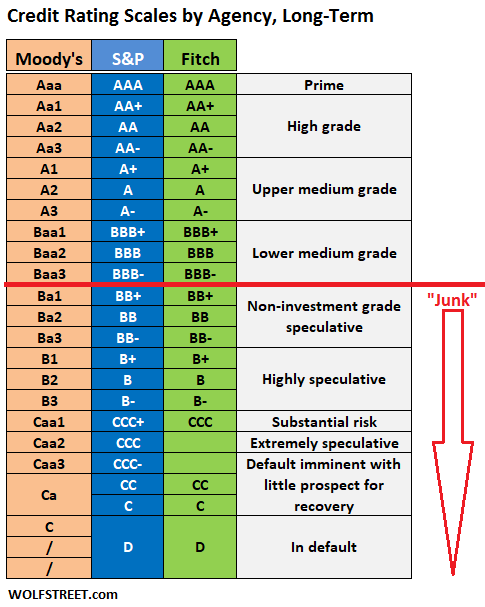

4. Data Acquisition

4.1 Importar Librerías

In [1090]:
# Importar Librerias
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import sklearn as sk
import bokeh as bk
import plotly as ply
import scipy as sci
import scipy.stats as stats
import statsmodels.api as sm
import ptitprince as pt
import sklearn.cluster as skc
import yellowbrick.cluster  as ybc
import plotly.graph_objects as go
import plotly.offline as py
import prince as prc
import sklearn.naive_bayes as nb
import lazypredict as lzp

4.2 Obtención Datos

Datos Proporcionados por el Departamento de Finanzas de la Bolsa de EEUU.
7.805 Registros Organizados y Etiquetados en 25 Columnas.
Periodo 2010 - 2016
Descripción Detallada de Variables en el Punto 4.3.

In [1091]:
# Fuente: https://www.kaggle.com/datasets/kirtandelwadia/corporate-credit-rating-with-financial-ratios/data
url = 'https://raw.githubusercontent.com/jfdonosom/Data_Bases/main/Corporate_Credit_Rating_With_Financial_Ratios.csv'
df = pd.read_csv(url)
df.head(5)

,Rating Agency,Corporation,Rating,Rating Date,CIK,Binary Rating,SIC Code,Sector,Ticker,Current Ratio,...,EBITDA Margin,Pre-Tax Profit Margin,Net Profit Margin,Asset Turnover,ROE - Return On Equity,Return On Tangible Equity,ROA - Return On Assets,ROI - Return On Investment,Operating Cash Flow Per Share,Free Cash Flow Per Share
0,Standard & Poor's Ratings Services,American States Water Co.,A-,2010-07-30,1056903,1,4941.00,Utils,AWR,1.15,...,28.98,13.61,8.32,0.32,8.17,8.20,2.64,4.45,2.00,-0.13
1,Standard & Poor's Ratings Services,Automatic Data Processing Inc.,AAA,2010-09-16,8670,1,7374.00,BusEq,ADP,1.11,...,23.94,20.87,13.57,0.33,22.04,47.29,4.49,21.88,0.25,0.31
2,Standard & Poor's Ratings Services,Avnet Inc.,BBB-,2010-11-23,8858,1,5065.00,Shops,AVT,1.93,...,3.63,3.05,2.14,2.46,13.64,16.80,5.27,9.65,-7.61,-7.32
3,Standard & Poor's Ratings Services,California Water Service Co.,AA-,2010-06-29,1035201,1,4941.00,Utils,CWT,0.84,...,27.94,15.11,9.02,0.29,9.64,9.70,2.66,5.10,1.74,-0.90
4,Standard & Poor's Ratings Services,Cardinal Health Inc.,A,2010-07-14,721371,1,5122.00,Shops,CAH,1.29,...,1.58,1.23,0.65,4.93,11.13,19.42,2.94,8.18,1.97,2.42


In [1092]:
df.tail(5)

,Rating Agency,Corporation,Rating,Rating Date,CIK,Binary Rating,SIC Code,Sector,Ticker,Current Ratio,...,EBITDA Margin,Pre-Tax Profit Margin,Net Profit Margin,Asset Turnover,ROE - Return On Equity,Return On Tangible Equity,ROA - Return On Assets,ROI - Return On Investment,Operating Cash Flow Per Share,Free Cash Flow Per Share
7800,Moody's Investors Service,"eBay, Inc.",BBB+,2016-02-22,1065088,1,7370.00,BusEq,EBAY,3.49,...,33.57,28.00,20.08,0.48,29.61,95.68,10.97,14.61,-1.23,-1.28
7801,Moody's Investors Service,"eBay, Inc.",BBB+,2016-03-02,1065088,1,7370.00,BusEq,EBAY,3.49,...,33.57,28.00,20.08,0.48,29.61,95.68,10.97,14.61,-1.23,-1.28
7802,Standard & Poor's Ratings Services,iHeartCommunications Inc.,CC,2016-03-08,739708,0,4832.00,Telcm,CCU,1.76,...,14.25,12.72,8.06,0.82,11.83,13.51,7.71,10.61,0.09,1.26
7803,Standard & Poor's Ratings Services,iHeartCommunications Inc.,CCC,2016-03-24,739708,0,4832.00,Telcm,CCU,1.76,...,14.25,12.72,8.06,0.82,11.83,13.51,7.71,10.61,0.09,1.26
7804,Standard & Poor's Ratings Services,iHeartCommunications Inc.,CC,2016-06-14,739708,0,4832.00,Telcm,CCU,1.76,...,14.25,12.72,8.06,0.82,11.83,13.51,7.71,10.61,0.09,1.26


In [1093]:
df.shape

(7805, 25)

In [1094]:
df.columns

Index(['Rating Agency', 'Corporation', 'Rating', 'Rating Date', 'CIK',
       'Binary Rating', 'SIC Code', 'Sector', 'Ticker', 'Current Ratio',
       'Long-term Debt / Capital', 'Debt/Equity Ratio', 'Gross Margin',
       'Operating Margin', 'EBIT Margin', 'EBITDA Margin',
       'Pre-Tax Profit Margin', 'Net Profit Margin', 'Asset Turnover',
       'ROE - Return On Equity', 'Return On Tangible Equity',
       'ROA - Return On Assets', 'ROI - Return On Investment',
       'Operating Cash Flow Per Share', 'Free Cash Flow Per Share'],
      dtype='object')

4.3 Descripción Variables

In [1095]:
# Fuentes: https://finviz.com/help/screener.ashx , https://www.sec.gov/search-filings/standard-industrial-classification-sic-code-list ,  

# Corporation: Nombre de la Empresa.
# Rating: Calificación Otorgada por la Agencia Especialista - Calificación S&P Decreciente {AAA, AA+, AA, AA−, A+, A, A−, BBB+, BBB, BBB−, BB+, BB, BB−, B+, B, B−, CCC+, CCC, CCC−, CC, C, D}
# Rating Date: Fecha de Calificación.
# CIK: Identificador único de la Compañía provisto por el SEC (Security and Exchange Comission).
# Binary Rating: Calificación Binaria (1: Empresas con Grado de Inversión, 0: Empresas Basura) 
# SIC Code: Estándar Industrial de Clasificación (USA) - Indica el tipo de Negocio asociado a la Empresa.
# Sector: Grupos en función de las actividades de la Compañia en las cuales se agrupan diferentes Empresas. Relación Directa con el Código SIC.
# Ticker: Abreviación Empresa para Cotizar en Bolsa (Identificador Único)
# Current Ratio: Radio de Liquidez, que mide la capacidad de una empresa para pagar sus obligaciones en el corto plazo. Ratio Actual = Activos Actuales / Pasivos Actuales.
# Long-term Debt / Capital: Ratio que mide el Apalancamiento Financiero de una Compañía. Indica que proporción de las acciones y deuda la compañía está utilizando para financiar sus activos en el Largo Plazo. (Pasivos LP / Capital Accionistas)
# Debt/Equity Ratio (D/E): Ratio que mide el Apalancamiento Financiero de una Compañía. Indica que proporción de las acciones y deuda la compañía está utilizando para financiar sus activos en el Corto Plazo. (Pasivos Actuales / Capital Accionistas)                                              
# Gross Margin: Porcentaje del total de Ingresos por Ventas que la Compañía retiene después de incurrir en los costos directos de producción de un Bien o Servicio. Margen Bruto = (Ingresos Ventas - Costos Fijos Producción) / Ingresos Ventas 
# Operating Margin: Indica qué proporción de la ganancia de la compañía queda, luego de pagar los costos variables de producción, tales como salarios, insumos, etc. Margen Operacional = Ingresos Operacionales / Ingresos Totales Ventas. 
# EBIT Margin: Earnings Before Interest and Taxes. Ratio que nos indica la rentabilidad de una empresa. Se calcula como las ganancias de esta menos los gatos, exluyendo los impuestos e intereses.
# EBITDA Margin: Earnings Before Interest, Taxes, Depreciation and Amortization. Ratio o medida de rentabilidad, alternativo al Ingreso Neto, el cual busca representar el beneficio en efectivo generado por las operaciones de la compañía.
# Pre-Tax Profit Margin: Mide las ganancias remantentes de la empresa, después de que los gastos operacionales y no operacionales, sin considerar los impuestos, hayan sido descontados. Ganancia Previa a los Impuestos = EBT (Ganancias antes de Impuestos) / Ingresos.
# Net Profit Margin: Ratio de Rentabilidad que mide cuanto de cada Dólar por Ventas, la compañía mantiene como ganancia. Beneficio Neto = Ganancia Neta / Ingresos por Venta.
# Asset Turnover: Mide la eficiencia de los activos de una compañía para generar Ingresos o Ventas. Rotación de Activos = Ingresos por Ventas / Promedio Total de Activos.
# ROE - Return On Equity: Ratio de Rentabilidad que indica cuanta ganancia genera la compañía con el dinero que lo accionistas han invertido en ella. ROE = Ingreso Neto Anual / Capital Accionistas
# Return On Tangible Equity (ROTE): Mide la Eficiencia con la cual una compañía opera y utiliza sus Activos Tangibles para generar Ingresos en el Largo Plazo. ROTE = Ingreso Neto Anual / (Promedio Capital Accionistas - Activos Intangibles)
# ROA - Return On Assets: Indicador que nos da una idea sobre que tan eficiente es la gerencia de una compañía utilizando sus activos para generar ingresos. ROA = ingresos Netos Anuales / Total Activos.
# ROI - Return On Investment: Medida de Desempeño, utilizada para evaluar la eficiencia de una inversión. ROI = (Ingresos de Inversión - Costos de Inversión) / Costos de Inversión
# Operating Cash Flow Per Share: Cantidad de efectivo que genera una empresa a partir de los Ingresos que genera, excluyendo los costos asociados con la Inversión de Capital a Largo Plazo. Medido en lo últimos 12 Meses (TTM)
# Free Cash Flow Per Share: Medida de la Flexibilidad Financiera de una empresa que se determina dividiendo el Flujo de Caja Libre por el número total de Acciones en Circulación. Indicador de los cambios en las ganancias por acción.

In [1096]:
# Clasificación de Ratios por Tipo:

# Ratios de Liquidez: Current Ratio.
# Ratios de Rentabilidad: Gross Margin, Operating Margin, EBIT Margin, EBITDA Margin, Pre-Tax Profit Margin, Net Profit Margin, ROE - Return On Equity, Return On Tangible Equity (ROTE), ROA - Return On Assets, ROI - Return On Investment.
# Ratios de Deuda (Pasivos): Long-Term Debt / Capital, Debt/Equity Ratio (D/E).
# Ratios de Desempeño Operacional: Asset Turnover.
# Ratios de Flujo de Caja: Operating Cash Flow Per Share, Free Cash Flow Per Share.

5. Análisis Exploratorio de Datos (EDA) & Data Wrangling

In [1097]:
df['Rating Agency'].unique()

array(["Standard & Poor's Ratings Services", 'DBRS',
       "Moody's Investors Service", 'Fitch Ratings',
       'Japan Credit Rating Agency,Ltd.',
       'HR Ratings de Mexico S.A. de C.V.', 'Egan-Jones Ratings Company'],
      dtype=object)

In [1098]:
df.duplicated().sum()

0

In [1099]:
# Eliminamos Columna Rating Agency (axis=0 filas, axis=1 columnas)
# Asumimos que la Agencia de Clasificación es una entidad Neutral y que no existen juicios subjetivos de la evaluación de una empresa entre una y otra agencia.
df = df.drop('Rating Agency', axis=1)

In [1100]:
# Eliminamos las columnas CIK y SIC Code, ya que estas solo son identificadores únicos de la empresa y de la Industria a la cual pertenecen. En términos de comprensión, se hace más fácil trabajar con la Columnas Corportation y Sector, las cuales entregan mucha más información.
df = df.drop(columns=['CIK', 'SIC Code'])
df.head(5)

,Corporation,Rating,Rating Date,Binary Rating,Sector,Ticker,Current Ratio,Long-term Debt / Capital,Debt/Equity Ratio,Gross Margin,...,EBITDA Margin,Pre-Tax Profit Margin,Net Profit Margin,Asset Turnover,ROE - Return On Equity,Return On Tangible Equity,ROA - Return On Assets,ROI - Return On Investment,Operating Cash Flow Per Share,Free Cash Flow Per Share
0,American States Water Co.,A-,2010-07-30,1,Utils,AWR,1.15,0.46,0.88,77.62,...,28.98,13.61,8.32,0.32,8.17,8.20,2.64,4.45,2.00,-0.13
1,Automatic Data Processing Inc.,AAA,2010-09-16,1,BusEq,ADP,1.11,0.01,0.01,43.66,...,23.94,20.87,13.57,0.33,22.04,47.29,4.49,21.88,0.25,0.31
2,Avnet Inc.,BBB-,2010-11-23,1,Shops,AVT,1.93,0.29,0.43,11.90,...,3.63,3.05,2.14,2.46,13.64,16.80,5.27,9.65,-7.61,-7.32
3,California Water Service Co.,AA-,2010-06-29,1,Utils,CWT,0.84,0.47,0.95,64.51,...,27.94,15.11,9.02,0.29,9.64,9.70,2.66,5.10,1.74,-0.90
4,Cardinal Health Inc.,A,2010-07-14,1,Shops,CAH,1.29,0.26,0.40,3.84,...,1.58,1.23,0.65,4.93,11.13,19.42,2.94,8.18,1.97,2.42


In [1101]:
df.shape

(7805, 22)

In [1102]:
# Verificamos que No exista más de una agencia que califique en una misma fecha con los mismos valores a una misma empresa.
df.duplicated().sum()

0

5.1 Equilibrio de la Muestra

In [1103]:
# Equilibrio Muestra 'Binary Rating', Invertir o No Invertir.
((df.value_counts('Binary Rating')/len(df))*100).round(1)

Binary Rating
1   65.30
0   34.70
Name: count, dtype: float64

In [1104]:
# Equilibrio Muestra 'Rating', Calificación S&P.
(df.value_counts('Rating')/len(df)*100).round(1).sort_index(ascending=True)

Rating
A      10.70
A+      6.10
A-      9.30
AA      2.40
AA+     0.90
AA-     3.30
AAA     1.20
B       4.00
B+      5.40
B-      3.70
BB      5.80
BB+     7.00
BB-     5.50
BBB    11.70
BBB+   10.80
BBB-    9.00
C       0.10
CC      0.20
CC+     0.00
CCC     0.80
CCC+    1.90
CCC-    0.10
D       0.10
Name: count, dtype: float64

Muestra efectivamente desbalanceada. Debemos crear nuevas agrupaciones para que nuestros datos de entrenamiento sean balanceados y no se produzca Overfitting (Sobreajuste) en el Modelo Predictivo.

In [1105]:
((df.groupby(['Binary Rating','Rating']).size())/len(df)*100).round(1)

Binary Rating  Rating
0              B         4.00
               B+        5.40
               B-        3.70
               BB        5.80
               BB+       7.00
               BB-       5.50
               C         0.10
               CC        0.20
               CC+       0.00
               CCC       0.80
               CCC+      1.90
               CCC-      0.10
               D         0.10
1              A        10.70
               A+        6.10
               A-        9.30
               AA        2.40
               AA+       0.90
               AA-       3.30
               AAA       1.20
               BBB      11.70
               BBB+     10.80
               BBB-      9.00
dtype: float64

In [1106]:
# De acuerdo a la información otorgada por Wolfstreet.com (https://wolfstreet.com/credit-rating-scales-by-moodys-sp-and-fitch/), generamos nuevas agrupaciones para equilibrar la muestra.

df['Rating'] = df['Rating'].replace({'AAA': 'Alta', 'AA+': 'Alta', 'AA': 'Alta', 'AA-': 'Alta', 
                                     'A+': 'Media Superior', 'A': 'Media Superior', 
                                     'A-': 'Media', 'BBB+': 'Media', 
                                     'BBB': 'Media Inferior', 'BBB-': 'Media Inferior', 
                                     'BB+': 'Especulativa', 'BB': 'Especulativa', 
                                     'BB-': 'Altamente Especulativa', 'B+': 'Altamente Especulativa', 'B': 'Altamente Especulativa', 
                                     'B-': 'Riesgo Sustancial', 'CCC+': 'Riesgo Sustancial', 'CCC': 'Riesgo Sustancial', 'CCC-': 'Riesgo Sustancial', 
                                     'CC+': 'Riesgo Sustancial', 'CC': 'Riesgo Sustancial', 'C': 'Riesgo Sustancial', 'D': 'Riesgo Sustancial'})

In [1107]:
# Variables Categóricas Ordinales.
# Ordinal Encoder
# Como el sistema NO necesariamente asocia el orden lógico ordinal de la clasificación, es necesario crear un diccionario y asociarlos uno a uno.
evaluacion = ['Alta', 'Media Superior', 'Media', 'Media Inferior', 'Especulativa', 'Altamente Especulativa', 'Riesgo Sustancial']
codificador = range(7,0,-1)
mapping = {rating: code for rating, code in zip(evaluacion, codificador)}
df['Rating_OE'] = df['Rating'].map(mapping)
#from sklearn.preprocessing import OrdinalEncoder
#ord = OrdinalEncoder()

# Transformar los datos
#df['Rating_OE'] = ord.fit_transform(df[['Rating']]).astype('int64')

In [1108]:
df['Rating_OE'] = df['Rating_OE'].astype('int64')

In [1109]:
nuevo_rating = df[['Rating','Rating_OE']].sort_values(by='Rating_OE',ascending=False)
nuevo_rating

,Rating,Rating_OE
3651,Alta,7
6019,Alta,7
2042,Alta,7
2033,Alta,7
2032,Alta,7
...,...,...
4767,Riesgo Sustancial,1
4813,Riesgo Sustancial,1
4816,Riesgo Sustancial,1
4818,Riesgo Sustancial,1


In [1110]:
print((df.groupby(['Binary Rating', 'Rating', 'Rating_OE']).size()/len(df)*100).round(1))

Binary Rating  Rating                  Rating_OE
0              Altamente Especulativa  2           14.80
               Especulativa            3           12.80
               Riesgo Sustancial       1            7.00
1              Alta                    7            7.70
               Media                   5           20.10
               Media Inferior          4           20.70
               Media Superior          6           16.80
dtype: float64


In [1111]:
# Pie Chart 1
import plotly.express as px

fig = px.pie(values=df.value_counts(), 
             names=df['Rating'], title='Distribución Clasificación Empresas')

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [1112]:
# Equilibrio Muestra 'Sector', Industria a la cual pertenece.
(df.value_counts('Sector')/len(df)*100).round(1).sort_values(ascending=False)

Sector
Other   16.00
Manuf   12.60
BusEq   12.30
Utils   10.80
Shops   10.10
Enrgy    8.50
Hlth     8.00
NoDur    7.30
Telcm    4.90
Chems    4.00
Durbl    2.80
Money    2.70
Name: count, dtype: float64

In [1113]:
# Reclasificamos los sectores de acuerdo a la nomenclatura vigente de S&P.
# S&P Sectors: https://corporatefinanceinstitute.com/resources/valuation/the-sp-sectors/

#BusEq - Information Technology: The information technology – IT – sector consists of companies that develop or distribute technological items or services, and includes internet companies. Technology products include computers, microprocessors, and operating systems. 
#Chems - Materials: Companies within the materials sector provide the raw materials needed for other sectors to function. This includes the mining companies that provide gold, zinc, and copper, and forestry companies that provide wood.    
#Durbl - Consumer Discretionary: Discretionary consumer products are luxury items or services that are not necessary for survival. The demand for these items depends on economic conditions and the wealth of individuals.
#Enrgy - Energy: The energy sector consists of all companies that play a part in the oil, gas, and consumable fuels business. This includes companies that find, drill, and extract the commodity.
#Hlth -  Health Care: Health care consists of medical supply companies, pharmaceutical companies, and scientific-based operations or services that aim to improve the human body or mind.      
#Manuf - Industrials: ndustrials include a wide range of companies, from airlines and railroad companies to military weapons manufacturers. Two of the largest industries are Aerospace & Defense and Construction & Engineering.      
#Money - Financials: The financial sector includes all companies involved in finance, investing, and the movement or storage of money. It includes banks, credit card issuers, credit unions, insurance companies, and mortgage real estate investment trusts (REITs).     
#NoDur - Consumer Staples: Consumer staples companies provide all the necessities of life. This includes food and beverage companies, household product providers, and personal product providers. Consumer staple companies are well known, since people see their products in stores regularly.   
#Other - Other: Industries that cannot be classified on a single sector.   
#Shops - Consumer Staples: Consumer staples companies provide all the necessities of life. This includes food and beverage companies, household product providers, and personal product providers. Consumer staple companies are well known, since people see their products in stores regularly.
#Telcm - Communication Services: The communication services sector consists of companies that keep people connected. This includes internet providers and phone plan providers. The more exciting part of the sector includes media, entertainment, and interactive media & services companies.    
#Utils - Utilities: Utility companies provide or generate electricity, water, and gas to buildings and households.

In [1114]:
df['Sector'] = df['Sector'].replace({'BusEq': 'Information Technology', 'Chems': 'Materials', 'Durbl': 'Consumer Discretionary', 
                                     'Enrgy': 'Energy', 'Hlth': 'Health Care', 'Manuf': 'Industrials', 'Money': 'Financials', 
                                     'NoDur': 'Consumer Staples', 'Shops': 'Consumer Staples', 'Telcm': 'Communication Services', 'Utils': 'Utilities'})

In [1115]:
# Equilibrio Muestra 'Sector', Industria a la cual pertenece.
(df.value_counts('Sector')/len(df)*100).round(1).sort_values(ascending=False)

Sector
Consumer Staples         17.30
Other                    16.00
Industrials              12.60
Information Technology   12.30
Utilities                10.80
Energy                    8.50
Health Care               8.00
Communication Services    4.90
Materials                 4.00
Consumer Discretionary    2.80
Financials                2.70
Name: count, dtype: float64

In [1116]:
# Pie Chart 2
import plotly.express as px

fig = px.pie(values=df.value_counts(), 
             names=df['Sector'], title='Clasificación Empresas por Sector')

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [1117]:
# Variables Categóricas Nominales (No importa el Orden).
# Label Encoder - Utilizamos One Hot Encoder, ya que las Variables Nominales no poseen un Orden Jerárquico en sus Categorías. 
df.Sector.value_counts()

Sector
Consumer Staples          1353
Other                     1251
Industrials                981
Information Technology     958
Utilities                  843
Energy                     665
Health Care                625
Communication Services     386
Materials                  315
Consumer Discretionary     221
Financials                 207
Name: count, dtype: int64

In [1118]:
# Variables Dummies o Binarias
pd.get_dummies(df.Sector).head(5)

,Communication Services,Consumer Discretionary,Consumer Staples,Energy,Financials,Health Care,Industrials,Information Technology,Materials,Other,Utilities
0,False,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,True,False,False,False
2,False,False,True,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,True
4,False,False,True,False,False,False,False,False,False,False,False


In [1119]:
pd.get_dummies(df.Sector, prefix= 'Sector')

,Sector_Communication Services,Sector_Consumer Discretionary,Sector_Consumer Staples,Sector_Energy,Sector_Financials,Sector_Health Care,Sector_Industrials,Sector_Information Technology,Sector_Materials,Sector_Other,Sector_Utilities
0,False,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,True,False,False,False
2,False,False,True,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,True
4,False,False,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
7800,False,False,False,False,False,False,False,True,False,False,False
7801,False,False,False,False,False,False,False,True,False,False,False
7802,True,False,False,False,False,False,False,False,False,False,False
7803,True,False,False,False,False,False,False,False,False,False,False


In [1120]:
# Label Encoder
from sklearn.preprocessing import LabelEncoder
# Instanciar el método
LE = LabelEncoder()
# Transformar los datos
df['Sector_LE'] = LE.fit_transform(df['Sector'].astype(str))

In [1121]:
df[['Sector', 'Sector_LE']].value_counts().sort_index()

Sector                  Sector_LE
Communication Services  0             386
Consumer Discretionary  1             221
Consumer Staples        2            1353
Energy                  3             665
Financials              4             207
Health Care             5             625
Industrials             6             981
Information Technology  7             958
Materials               8             315
Other                   9            1251
Utilities               10            843
Name: count, dtype: int64

5.2 Valores Nulos

<Axes: >

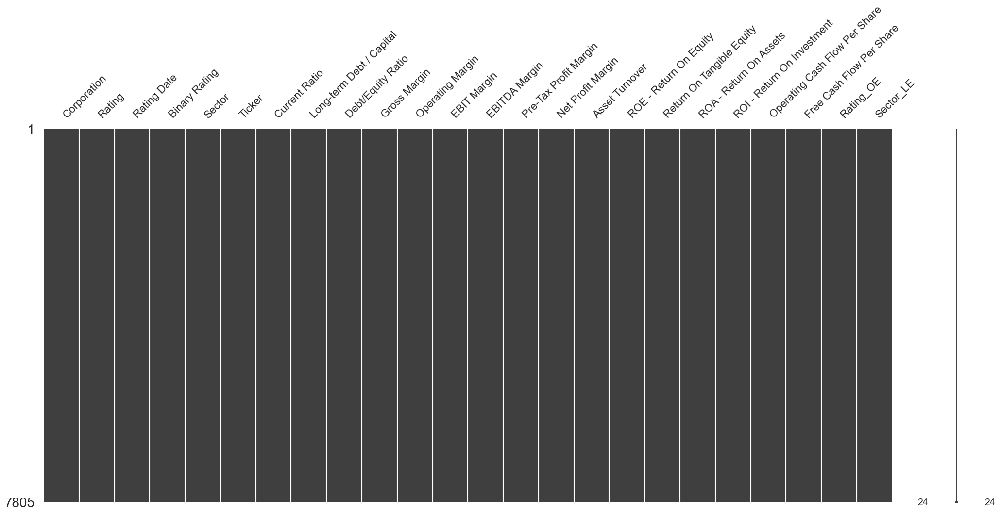

In [1122]:
# Valores Faltantes.
msno.matrix(df)

In [1123]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7805 entries, 0 to 7804
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Corporation                    7805 non-null   object 
 1   Rating                         7805 non-null   object 
 2   Rating Date                    7805 non-null   object 
 3   Binary Rating                  7805 non-null   int64  
 4   Sector                         7805 non-null   object 
 5   Ticker                         7805 non-null   object 
 6   Current Ratio                  7805 non-null   float64
 7   Long-term Debt / Capital       7805 non-null   float64
 8   Debt/Equity Ratio              7805 non-null   float64
 9   Gross Margin                   7805 non-null   float64
 10  Operating Margin               7805 non-null   float64
 11  EBIT Margin                    7805 non-null   float64
 12  EBITDA Margin                  7805 non-null   f

5.3 Cambio Tipo Variables

In [1124]:
# Si bien las variables 'Binary Rating', 'Rating_OE', 'Sector_LE' son Categorías, en lugar de convertirlas en Variables Categoricas, le cambiaremos 
# El Formato a Números Enteros, para que estas puedan ser reconocidas por los modelos predictivos, ahorrar memoria y tener un procesamiento de datos más eficiente.
Columnas = ['Binary Rating', 'Rating_OE', 'Sector_LE']
def Cambio_Formato(df, Columnas):
    for i in Columnas:
        df[i] = df[i].astype('int64')
    return df

df = Cambio_Formato(df, Columnas)

In [1125]:
# Cambiamos Formato Columnas Descriptivas a String.
Columnas = ['Corporation', 'Rating', 'Sector', 'Ticker']
def Cambio_Formato(df, Columnas):
    for i in Columnas:
        df[i] = df[i].astype('string')
    return df

df = Cambio_Formato(df, Columnas)

In [1126]:
# Cambiamos el Formato de Fecha y Segmentamos por Intervalos.
# Año, Mes, Semana, Día de la Semana
df['Rating Date'] = pd.to_datetime(df['Rating Date'])
df['Year'] = df['Rating Date'].dt.year.astype('int64')
df['Month'] = df['Rating Date'].dt.month.astype('int64')
df['Week'] = df['Rating Date'].dt.isocalendar().week.astype('int64')
df['Day'] = df['Rating Date'].dt.day_of_week.astype('int64')

In [1127]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7805 entries, 0 to 7804
Data columns (total 28 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   Corporation                    7805 non-null   string        
 1   Rating                         7805 non-null   string        
 2   Rating Date                    7805 non-null   datetime64[ns]
 3   Binary Rating                  7805 non-null   int64         
 4   Sector                         7805 non-null   string        
 5   Ticker                         7805 non-null   string        
 6   Current Ratio                  7805 non-null   float64       
 7   Long-term Debt / Capital       7805 non-null   float64       
 8   Debt/Equity Ratio              7805 non-null   float64       
 9   Gross Margin                   7805 non-null   float64       
 10  Operating Margin               7805 non-null   float64       
 11  EBIT Margin      

5.4 Reclasificación Variables

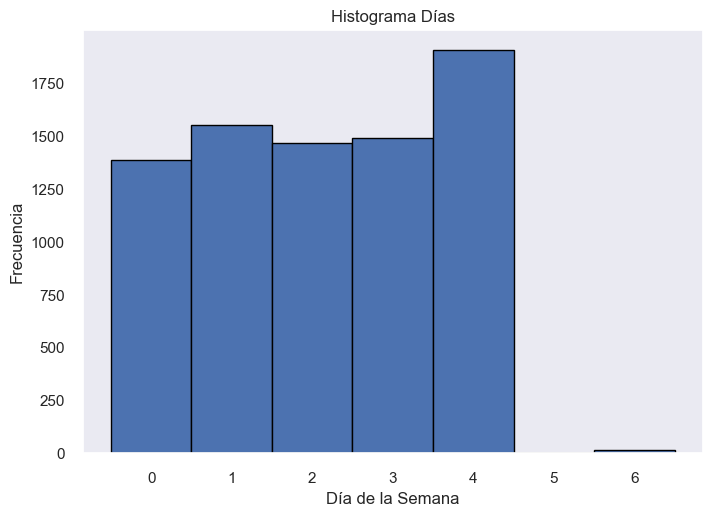

In [1128]:
# Histograma Días.
plt.hist(df['Day'], bins=range(0,8), edgecolor='black', align='left')

# Etiquetas y título
plt.title('Histograma Días')
plt.xlabel('Día de la Semana')
plt.ylabel('Frecuencia')

# Mostrar el gráfico
plt.show()

In [1129]:
#Días Lunes
df[df['Day']==0]['Rating Date']

6      2010-12-20
49     2011-10-31
50     2011-07-25
52     2011-10-31
54     2011-09-12
          ...    
7778   2016-01-11
7787   2016-02-01
7790   2016-08-15
7798   2016-09-26
7800   2016-02-22
Name: Rating Date, Length: 1383, dtype: datetime64[ns]

In [1130]:
#Días Sábado
df[df['Day']==5]['Rating Date']

5948   2015-09-19
Name: Rating Date, dtype: datetime64[ns]

In [1131]:
# Días Domingo
df[df['Day']==6]['Rating Date']

351    2011-11-13
1517   2013-03-17
2811   2013-12-08
2880   2014-07-27
3058   2014-10-05
3333   2014-11-23
4345   2014-12-14
4561   2014-10-26
4649   2014-07-27
5358   2015-01-25
5834   2015-12-20
6432   2015-06-28
6945   2016-03-20
7058   2016-01-31
7687   2016-05-08
Name: Rating Date, dtype: datetime64[ns]

Es poco probable que se haya realizado la calificación de una Agencia un día Domingo, cuando la bolsa de EEUU está cerrada.

In [1132]:
# Reemplazamos Sábado por Viernes y Domingo por Lunes.
df['Day'].replace({5: 4, 6: 1}, inplace=True)

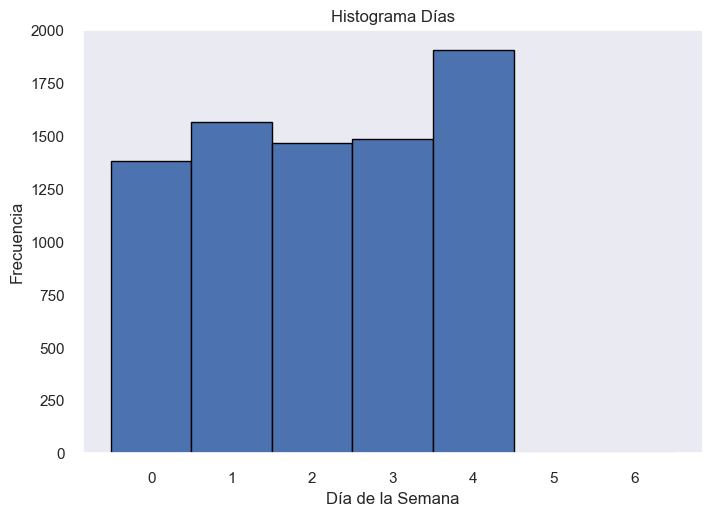

In [1133]:
# Histograma Días.
plt.hist(df['Day'], bins=range(0,8), edgecolor='black', align='left')

# Etiquetas y título
plt.title('Histograma Días')
plt.xlabel('Día de la Semana')
plt.ylabel('Frecuencia')

# Mostrar el gráfico
plt.show()

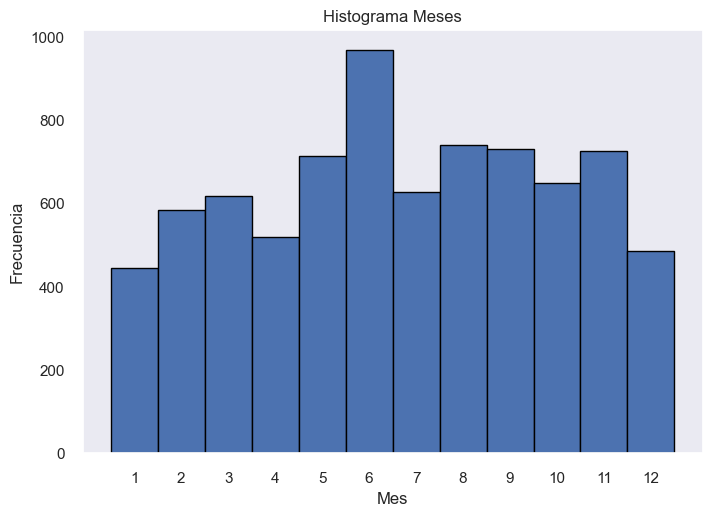

In [1134]:
# Histograma Meses.
plt.hist(df['Month'], bins=range(1,14), edgecolor='black', align='left')

# Etiquetas y título
plt.title('Histograma Meses')
plt.xlabel('Mes')
plt.ylabel('Frecuencia')
plt.xticks(range(1, 13))

# Mostrar el gráfico
plt.show()

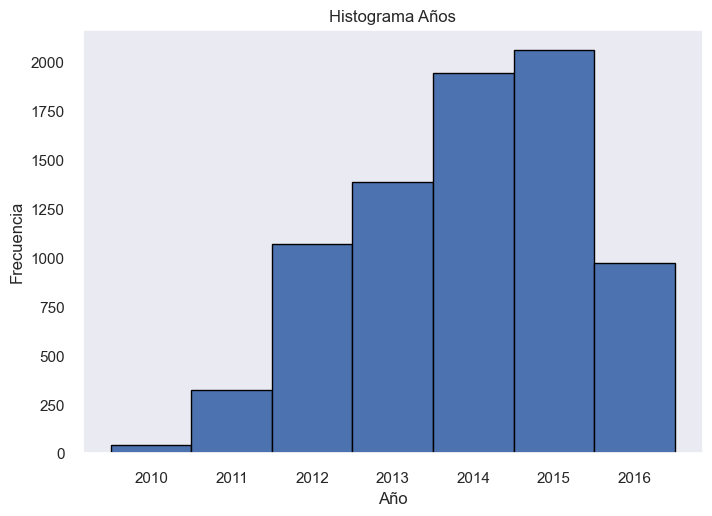

In [1135]:
# Histograma Años.
plt.hist(df['Year'], bins=range(2010,2018), edgecolor='black', align='left')

# Etiquetas y título
plt.title('Histograma Años')
plt.xlabel('Año')
plt.ylabel('Frecuencia')

# Mostrar el gráfico
plt.show()

In [1136]:
# Agrupamos la clasificación de una compañía para un mes y año en particular, para identificar si es que existe más de una clasificación en un mismo periodo contable.
df_grouped = df.groupby(['Year', 'Month', 'Corporation'])['Rating'].nunique()

In [1137]:
df_grouped.describe().round(2)

count   7285.00
mean       1.02
std        0.13
min        1.00
25%        1.00
50%        1.00
75%        1.00
max        3.00
Name: Rating, dtype: float64

In [1138]:
# Existen casos en los cuales tenemos 2 o 3 clasificaciones diferentes de una empresa para un mismo año, mes.
df_grouped.value_counts()

Rating
1    7156
2     127
3       2
Name: count, dtype: int64

In [1139]:
# Agrupamos nuevamente, pero ahora considerando la fecha más antigua para un mismo mes y año, intentando tomar la fecha más cercana al fin del periodo contable. 
df = df.loc[df.groupby(['Year','Month','Corporation'])['Rating Date'].idxmax()]

In [1140]:
# Se reduce el df de (7805, 28) a (7285, 28)
df.shape

(7285, 28)

In [1141]:
# Valores Duplicados.
df.duplicated().sum()

0

In [1142]:
# Estadistica Descriptiva Enteros.
int64_columns = df.select_dtypes(include='int64')
int64_columns.describe().round(0)

,Binary Rating,Rating_OE,Sector_LE,Year,Month,Week,Day
count,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00
mean,1.00,4.00,6.00,2014.00,7.00,28.00,2.00
std,0.00,2.00,3.00,1.00,3.00,14.00,1.00
min,0.00,1.00,0.00,2010.00,1.00,1.00,0.00
25%,0.00,3.00,2.00,2013.00,4.00,17.00,1.00
50%,1.00,4.00,6.00,2014.00,7.00,27.00,2.00
75%,1.00,5.00,9.00,2015.00,9.00,39.00,3.00
max,1.00,7.00,10.00,2016.00,12.00,53.00,4.00


In [1143]:
# Estadistica Descriptiva Flotantes.
float64_columns = df.select_dtypes(include='float64')
float64_columns.describe().round(0)

,Current Ratio,Long-term Debt / Capital,Debt/Equity Ratio,Gross Margin,Operating Margin,EBIT Margin,EBITDA Margin,Pre-Tax Profit Margin,Net Profit Margin,Asset Turnover,ROE - Return On Equity,Return On Tangible Equity,ROA - Return On Assets,ROI - Return On Investment,Operating Cash Flow Per Share,Free Cash Flow Per Share
count,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00,7285.00
mean,2.00,0.00,0.00,42.00,11.00,12.00,20.00,9.00,6.00,1.00,15.00,20.00,5.00,7.00,0.00,0.00
std,2.00,3.00,34.00,24.00,25.00,25.00,24.00,28.00,24.00,1.00,233.00,455.00,9.00,25.00,6.00,7.00
min,0.00,-86.00,-1473.00,-88.00,-462.00,-462.00,-361.00,-476.00,-415.00,0.00,-11258.00,-14023.00,-226.00,-745.00,-91.00,-131.00
25%,1.00,0.00,0.00,23.00,6.00,6.00,11.00,4.00,3.00,0.00,6.00,-12.00,2.00,4.00,-0.00,-1.00
50%,2.00,0.00,1.00,40.00,12.00,12.00,18.00,10.00,7.00,1.00,12.00,11.00,5.00,7.00,0.00,0.00
75%,2.00,1.00,1.00,60.00,19.00,19.00,30.00,17.00,12.00,1.00,20.00,27.00,8.00,13.00,1.00,1.00
max,34.00,172.00,194.00,100.00,94.00,94.00,286.00,221.00,219.00,9.00,7038.00,9883.00,115.00,467.00,282.00,108.00


In [1144]:
# Estadistica Descriptiva Cadenas de Texto.
df.describe(include='string')

,Corporation,Rating,Sector,Ticker
count,7285,7285,7285,7285
unique,1377,7,11,678
top,Chevron Corporation,Media Inferior,Consumer Staples,DTE
freq,20,1495,1268,40


5.5 Selección de Variables

5.5.1 Correlación Entre Variables

https://saber.ucv.ve/bitstream/10872/18490/1/Otros%20Coeficientes%20Correlaci%C3%B3n_FHE_UCV.pdf

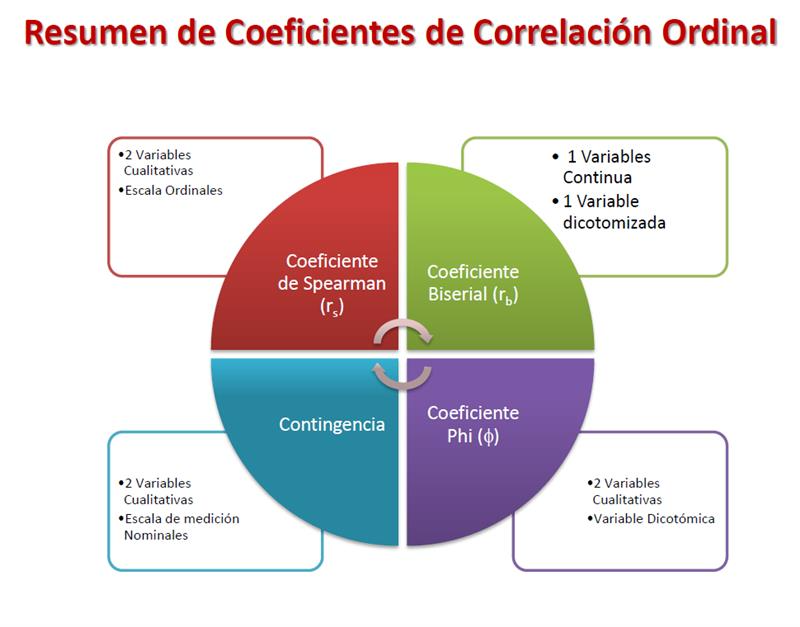

Ho: Hipótesis Nula.
Ha: Hipótesis Alternativa.
0,05: Nivel de Significancia Definido.

P-Value
p < 0,05 significa que la hipótesis nula es falsa
p > 0,05 que la hipótesis nula es verdadera

Un valor p pequeño (generalmente menor que 0.05) indica que la probabilidad de obtener una correlación tan fuerte o más fuerte que la observada bajo la hipótesis nula es baja. Por lo tanto, se considera que hay evidencia suficiente para rechazar la hipótesis nula y concluir que existe una correlación significativa entre las variables.

Por otro lado, un valor p grande (generalmente mayor que 0.05) indica que la probabilidad de obtener una correlación tan fuerte o más fuerte que la observada bajo la hipótesis nula es alta. En este caso, no hay suficiente evidencia para rechazar la hipótesis nula y se concluye que no hay una correlación significativa entre las variables.

Coeficiente Biserial
Ho: No existe correlación entre una variable dicotómica y una variable métrica.
Ha: Existe correlación entre una variable dicotómica y una variable métrica.

Coeficiente de Spearman
Ho: No hay correlación entre las variables
Ha: Si hay correlación entre las variables

Coeficiente de Pearson
Ho: No hay correlación lineal entre las variables
Ha: Si hay correlación lineal entre las variables

In [1145]:
# Coeficiente Biserial
# Correlación Clasificación Binaria con Clasificación Ordinal.

variable_dicotomica = df['Binary Rating']
variable_numerica_continua = df['Rating_OE']

# Calcular el coeficiente de correlación de punto biserial
coeficiente, p_value = stats.pointbiserialr(variable_dicotomica, variable_numerica_continua)

print("Coeficiente de correlación de punto biserial:", coeficiente)
print("P-valor:", p_value)

Coeficiente de correlación de punto biserial: 0.8406313971695824
P-valor: 0.0


Conclusión: Se Rechaza la Hipótesis Nula -> Existe una Alta Correlación entre las Variables.

In [1146]:
print((df.groupby(['Binary Rating', 'Rating_OE'], observed=True)).size())

Binary Rating  Rating_OE
0              1             494
               2            1095
               3             947
1              4            1495
               5            1450
               6            1236
               7             568
dtype: int64


Esto queda evidenciado al analizar la relación directa entre la clasificación Dicotómica 0: No Inventir con los 3 primeros Valores de la Clasificación Ordinal 1,2,3 ('Especulativa', 'Altamente Especulativa', 'Riesgo Sustancial') y la clasificación Dicotómica 1: Invertir con los Valores más altos de la Clasificaicón Ordinal 4,5,6,7 ('Alta', 'Media Superior', 'Media', 'Media Inferior').

RATIOS DE LIQUIDEZ.

In [1147]:
# Coeficiente de Spearman 
# Correlación Ratio de Liquidez con Variable Objetivo.

coeficiente, p_value = stats.spearmanr(df['Current Ratio'], df['Rating_OE'])
print("Coeficiente de Spearman:", coeficiente)
print("P-valor:", p_value)

Coeficiente de Spearman: -0.127931266341371
P-valor: 5.793364343672758e-28


Conclusión: Se Rechaza la Hipótesis Nula -> Existe una Alta Correlación entre las Variables. Se debe conservar la Variable 'Current Ratio' para posteriores Análisis.

RATIOS DE RENTABILIDAD.

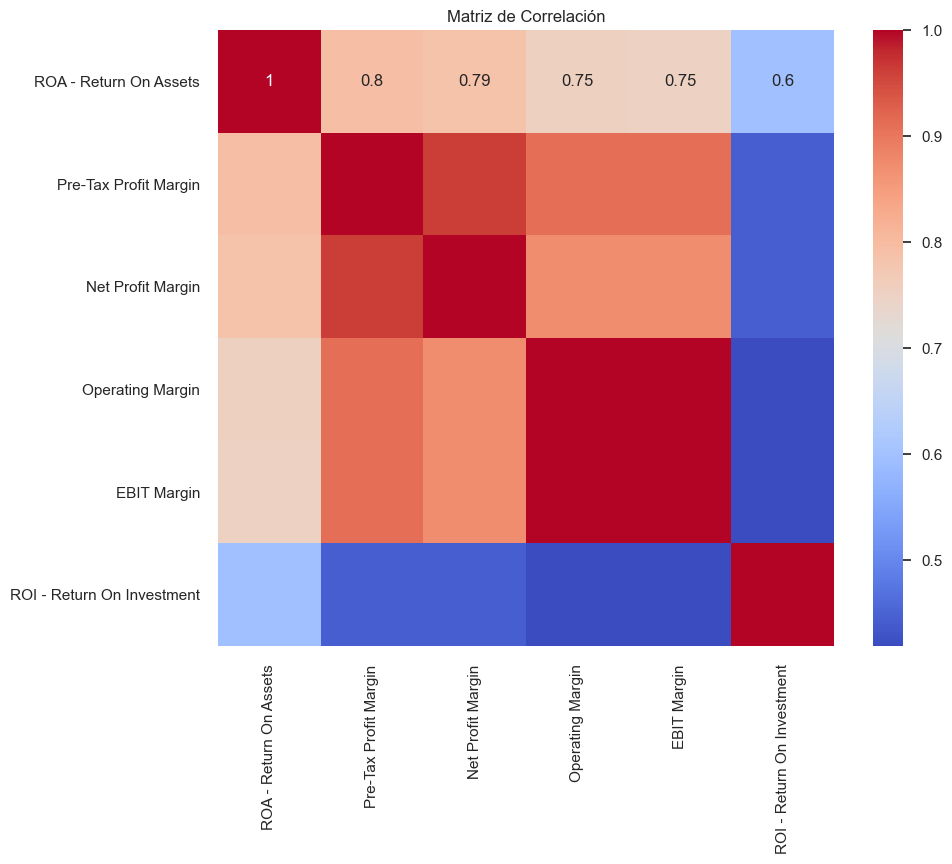

In [1148]:
# Coeficiente de Pearson.
# Correlación entre Ratios de Rentabilidad.

df_rentabilidad = df[['ROA - Return On Assets', 'Pre-Tax Profit Margin', 'Net Profit Margin', 'Operating Margin', 'EBIT Margin', 'ROI - Return On Investment']]
matriz_corr = df_rentabilidad.corr()

# Gráfico de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(matriz_corr, annot=True, cmap='coolwarm', square=True)
plt.title('Matriz de Correlación')
plt.show()

In [1149]:
df_rentabilidad.corr().round(3)

,ROA - Return On Assets,Pre-Tax Profit Margin,Net Profit Margin,Operating Margin,EBIT Margin,ROI - Return On Investment
ROA - Return On Assets,1.00,0.80,0.79,0.75,0.75,0.60
Pre-Tax Profit Margin,0.80,1.00,0.96,0.91,0.91,0.44
Net Profit Margin,0.79,0.96,1.00,0.87,0.87,0.44
Operating Margin,0.75,0.91,0.87,1.00,1.00,0.42
EBIT Margin,0.75,0.91,0.87,1.00,1.00,0.42
ROI - Return On Investment,0.60,0.44,0.44,0.42,0.42,1.00


Conclusión 1: Existe un alto grado de Correlación Lineal entre las variables 'ROA - Return On Assets', 'Pre-Tax Profit Margin', 'Net Profit Margin', 'Operating Margin', 'EBIT Margin', por lo cual se podría discernir de alguna de ellas si es que estas explicasen el mismo fenómeno y si es que tuvieran baja correlación con la Variable Objetivo.

Conclusión 2: La Variable 'ROI - Return On Investment' no posee un grado de correlación alto con ninguna de los otros Ratios de Rentabilidad, por lo cual la información de esta se debe conservar para su posterior análisis, siempre y cuando tenga un grado de correlación alto con la Variable Objetivo. 

In [1150]:
# Coeficiente de Spearman 
# Correlación Ratios de Rentabilidad con Variable Objetivo.
for column in df_rentabilidad:
    coeficiente, p_value = stats.spearmanr(df[column], df['Rating_OE'])
    print(f'{column}: Coeficiente de Spearman: {coeficiente}, P-Value: {p_value}')

ROA - Return On Assets: Coeficiente de Spearman: 0.4189843501456261, P-Value: 1.1607220829029526e-307
Pre-Tax Profit Margin: Coeficiente de Spearman: 0.45771717976608445, P-Value: 0.0
Net Profit Margin: Coeficiente de Spearman: 0.43362358122591177, P-Value: 0.0
Operating Margin: Coeficiente de Spearman: 0.3608064979193858, P-Value: 6.963107384684966e-223
EBIT Margin: Coeficiente de Spearman: 0.36232855641360434, P-Value: 6.894919178192096e-225
ROI - Return On Investment: Coeficiente de Spearman: 0.44578334699634364, P-Value: 0.0


Conclusión: 
1. Se Rechaza la Hipótesis Nula -> Existe una Alta Correlación entre las Variables. Se debe conservar la Variable 'ROA - Return On Assets' para posteriores Análisis.
2. Se Rechaza la Hipótesis Nula -> Existe una Alta Correlación entre las Variables. Se debe conservar la Variable 'Pre-Tax Profit Margin' para posteriores Análisis.
3. Se Rechaza la Hipótesis Nula -> Existe una Alta Correlación entre las Variables. Se debe conservar la Variable 'Net Profit Margin' para posteriores Análisis.
4. Se Rechaza la Hipótesis Nula -> Existe una Alta Correlación entre las Variables. Se debe conservar la Variable 'Net Profit Margin' para posteriores Análisis.
5. Se Rechaza la Hipótesis Nula -> Existe una Alta Correlación entre las Variables. Se debe conservar la Variable 'Net Profit Margin' para posteriores Análisis.
6. Se Rechaza la Hipótesis Nula -> Existe una Alta Correlación entre las Variables. Se debe conservar la Variable 'Net Profit Margin' para posteriores Análisis.

RATIOS DE DEUDA.

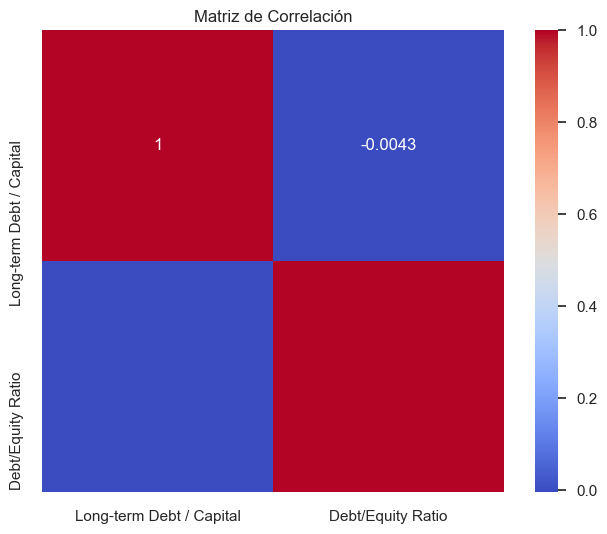

In [1151]:
# Coeficiente de Pearson.
# Correlación entre Ratios de Deuda.
df_deuda = df[['Long-term Debt / Capital','Debt/Equity Ratio']]
matriz_corr = df_deuda.corr()

# Gráfico de correlación
plt.figure(figsize=(8, 6))
sns.heatmap(matriz_corr, annot=True, cmap='coolwarm', square=True)
plt.title('Matriz de Correlación')
plt.show()

In [1152]:
df_deuda.corr().round(3)

,Long-term Debt / Capital,Debt/Equity Ratio
Long-term Debt / Capital,1.00,-0.00
Debt/Equity Ratio,-0.00,1.00


Conclusión: Los Ratios de Deuda no poseen un grado de Correlación Lineal alto entre ellos, por lo cual la información de estas variables se debe conservar para su posterior análisis, siempre y cuando estas tengan un grado de correlación alto con la Variable Objetivo. 

In [1153]:
# Coeficiente de Spearman 
# Correlación Ratios de Deuda con Variable Objetivo.
for column in df_deuda:
    coeficiente, p_value = stats.spearmanr(df[column], df['Rating_OE'])
    print(f'{column}: Coeficiente de Spearman: {coeficiente}, P-Value: {p_value}')

Long-term Debt / Capital: Coeficiente de Spearman: -0.36614004720771703, P-Value: 5.905327671656042e-230
Debt/Equity Ratio: Coeficiente de Spearman: -0.23312338750791736, P-Value: 1.6995451517624205e-90


Conclusión: 
1. Se Rechaza la Hipótesis Nula -> Existe una Alta Correlación entre las Variables. Se debe conservar la Variable 'Long-term Debt / Capital' para posteriores Análisis.
2. Se Rechaza la Hipótesis Nula -> Existe una Alta Correlación entre las Variables. Se debe conservar la Variable 'Debt/Equity Ratio' para posteriores Análisis.

RATIOS DE DESEMPEÑO OPERACIONAL.

In [1154]:
# Coeficiente de Spearman 
# Correlación Ratio de Desempeño Operacional con Variable Objetivo.

coeficiente, p_value = stats.spearmanr(df['Asset Turnover'], df['Rating_OE'])
print("Coeficiente de Spearman:", coeficiente)
print("P-valor:", p_value)

Coeficiente de Spearman: -0.012927456822223406
P-valor: 0.26992131196425595


RATIOS DE FLUJO DE CAJA.

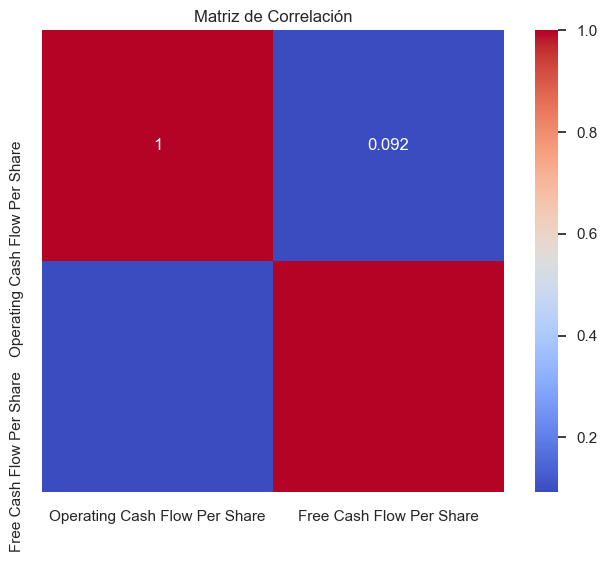

In [1155]:
# Coeficiente de Pearson.
# Correlación entre Ratios de Flujo de Caja.
df_flujo_caja = df[['Operating Cash Flow Per Share','Free Cash Flow Per Share']]
matriz_corr = df_flujo_caja.corr()

# Gráfico de correlación
plt.figure(figsize=(8, 6))
sns.heatmap(matriz_corr, annot=True, cmap='coolwarm', square=True)
plt.title('Matriz de Correlación')
plt.show()

In [1156]:
df_flujo_caja.corr().round(3)

,Operating Cash Flow Per Share,Free Cash Flow Per Share
Operating Cash Flow Per Share,1.00,0.09
Free Cash Flow Per Share,0.09,1.00


Conclusión: Los Ratios de Flujo de Caja no poseen un grado de Correlación Lineal alto entre ellos, por lo cual la información de estas variables se debe conservar para su posterior análisis, siempre y cuando estas tengan un grado de correlación alto con la Variable Objetivo. 

In [1157]:
# Coeficiente de Spearman 
# Correlación Ratios de Flujo de Caja con Variable Objetivo.
for column in df_flujo_caja:
    coeficiente, p_value = stats.spearmanr(df[column], df['Rating_OE'])
    print(f'{column}: Coeficiente de Spearman: {coeficiente}, P-Value: {p_value}')

Operating Cash Flow Per Share: Coeficiente de Spearman: 0.05648877672960009, P-Value: 1.4037816291405448e-06
Free Cash Flow Per Share: Coeficiente de Spearman: 0.05711473501621771, P-Value: 1.0715910945856728e-06


Conclusión: 
1. Se Rechaza la Hipótesis Nula -> Existe una Alta Correlación entre las Variables. Se debe conservar la Variable 'Operating Cash Flow Per Share' para posteriores Análisis.
2. Se Rechaza la Hipótesis Nula -> Existe una Alta Correlación entre las Variables. Se debe conservar la Variable 'Operating Cash Flow Per Share' para posteriores Análisis.

VIF - Factor de Inflación de la Varianza.
https://profesordata.com/2020/08/22/metodos-de-seleccion-de-variables-el-factor-de-inflacion-de-la-varianza/

VIF igual a 1: Un VIF de 1 indica que no hay colinealidad entre la variable predictora y las demás variables. Esto significa que la variable no está correlacionada con ninguna otra variable en el modelo.

VIF entre 1 y 5: Un VIF en este rango generalmente se considera aceptable y sugiere una colinealidad leve o moderada entre la variable predictora y otras variables. No es motivo de preocupación grave, pero se debe tener en cuenta al interpretar los coeficientes de regresión.

VIF mayor a 5: Un VIF mayor a 5 indica una colinealidad sustancial entre la variable predictora y al menos una de las otras variables. Esto puede sugerir que la variable está  muy correlacionada con otras variables y puede dificultar la interpretación de los coeficientes de regresión.

VIF muy alto: En casos donde el VIF es extremadamente alto (por ejemplo, superior a 10 o 20), se considera que la colinealidad es muy fuerte. Esto indica que la variable está altamente correlacionada con otras variables y puede afectar significativamente las estimaciones de los coeficientes de regresión.

In [1158]:
from statsmodels.regression.linear_model import OLS
from statsmodels.tools.tools import add_constant

df_ratios = df[['Current Ratio', 'ROA - Return On Assets', 'Pre-Tax Profit Margin', 
                'Net Profit Margin', 'Operating Margin', 'EBIT Margin', 'ROI - Return On Investment', 
                'Long-term Debt / Capital','Debt/Equity Ratio', 'Asset Turnover', 'Operating Cash Flow Per Share','Free Cash Flow Per Share']]

def variance_inflation_factors(df_ratios):
    exog_df = add_constant(df_ratios)
    vifs = pd.Series(
        [1 / (1. - OLS(df_ratios[col].values,
                       df_ratios.loc[:, df_ratios.columns != col].values).fit().rsquared)
         for col in df_ratios],
        index=df_ratios.columns,
        name='VIF'
    )
    return vifs

variance_inflation_factors(df_ratios)

Current Ratio                      1.47
ROA - Return On Assets             5.58
Pre-Tax Profit Margin             22.20
Net Profit Margin                 14.99
Operating Margin                2274.93
EBIT Margin                     2273.49
ROI - Return On Investment         3.41
Long-term Debt / Capital           2.06
Debt/Equity Ratio                  1.00
Asset Turnover                     1.64
Operating Cash Flow Per Share      1.08
Free Cash Flow Per Share           1.03
Name: VIF, dtype: float64

5.5.2 Selección de Variables

SELECCIÓN DE VARIABLES RATIOS DE LIQUIDEZ.
1. Se conserva la variable 'Current Ratio' debido a su alto grado de correlación con la Variable Objetivo y a su bajo grado de Colinealidad entre Variables Predictoras.

SELECIÓN DE VARIABLES RATIOS DE RENTABILIDAD.
1. Se descarta la variable 'ROA - Return On Assets' debido a su menor grado de correlación con la Variable Objetivo y a su alto grado de Colinealidad entre Variables Predictoras.
2. Se descarta la variable 'Pre-Tax Profit Margin' aunque tenga un alto grado de correlación con la Variable Objetivo debido a su alto grado de Colinealidad entre Variables Predictoras.
3. Se descarta la variable 'Net Profit Margin' aunque tenga un alto grado de correlación con la Variable Objetivo debido a su alto grado de Colinealidad entre Variables Predictoras.
4. Se descarta la variable 'Operating Margin' debido a su menor grado de correlación con la Variable Objetivo y a su alto grado de Colinealidad entre Variables Predictoras.
5. Se descarta la variable 'EBIT Margin' debido a su menor grado de correlación con la Variable Objetivo y a su alto grado de Colinealidad entre Variables Predictoras.
6. Se conserva la variable 'ROI - Return On Investment' debido a su alto grado de correlación con la Variable Objetivo y a su nivel medio de Colinealidad entre Variables Predictoras.

SELECCIÓN DE VARIABLES RATIOS DE DEUDA.
1. Se conserva la variable 'Long-term Debt / Capital' debido a su mayor grado de correlación con la Variable Objetivo y a su nivel medio de Colinealidad entre Variables Predictoras.
2. Se descarta la variable 'Debt/Equity Ratio' debido a su menor grado de correlación con la Variable Objetivo aunque posea un bajo grado de Colinealidad entre Variables Predictoras.

SELECCIÓN DE VARIABLES DESEMPEÑO OPERACIONAL.
1. Se descarta la variable 'Asset Turnover' debido a su bajo grado de correlación con la Variable Objetivo aunque posea un bajo grado de Colinealidad entre Variables Predictoras.

SELECCIÓN DE VARIABLES RATIOS DE FLUJO DE CAJA.
1. Se conserva la variable 'Free Cash Flow Per Share' debido a su mayor grado de correlación con la Variable Objetivo y a su bajo grado de Colinealidad entre Variables Predictoras.
2. Se descarta la variable 'Operating Cash Flow Per Share' debido a su menor grado de correlación con la Variable Objetivo aunque posea un bajo grado de Colinealidad entre Variables Predictoras.

In [1159]:
df.drop(columns=['ROA - Return On Assets', 'Pre-Tax Profit Margin', 'Net Profit Margin', 'Operating Margin', 
                 'EBIT Margin', 'Debt/Equity Ratio', 'Asset Turnover', 'Operating Cash Flow Per Share', 'Gross Margin',
                 'EBITDA Margin', 'ROE - Return On Equity', 'Return On Tangible Equity', 'Rating Date'], inplace=True)
df.head(5)

,Corporation,Rating,Binary Rating,Sector,Ticker,Current Ratio,Long-term Debt / Capital,ROI - Return On Investment,Free Cash Flow Per Share,Rating_OE,Sector_LE,Year,Month,Week,Day
33,Southern Copper Corp.,Media Inferior,1,Other,SCCO,2.97,0.25,18.10,0.66,4,9,2010,4,14,1
8,Compass Group PLC,Media,1,Information Technology,COMP,1.07,0.34,11.80,0.94,5,7,2010,5,21,4
3,California Water Service Co.,Alta,1,Utilities,CWT,0.84,0.47,5.10,-0.90,7,10,2010,6,26,1
16,Fresh Del Monte Produce Inc.,Altamente Especulativa,0,Consumer Staples,FDP,2.54,0.16,7.17,2.99,2,2,2010,6,22,1
29,Northwest Natural Gas Co.,Media,1,Utilities,NWN,0.84,0.48,5.95,3.96,5,10,2010,6,24,2


In [1160]:
df.shape

(7285, 15)

5.5.3 Estadística Descriptiva

5.5.3.1. Medidas de Tendencia Central

In [1161]:
df_var_selecc= df[['Current Ratio', 'ROI - Return On Investment', 'Long-term Debt / Capital', 'Free Cash Flow Per Share']]

In [1162]:
df_var_selecc.describe().round(1)

,Current Ratio,ROI - Return On Investment,Long-term Debt / Capital,Free Cash Flow Per Share
count,7285.00,7285.00,7285.00,7285.00
mean,1.90,7.00,0.50,0.10
std,1.90,25.00,2.70,7.40
min,0.20,-745.50,-86.40,-130.70
25%,1.10,3.70,0.30,-0.70
50%,1.50,7.40,0.40,0.10
75%,2.20,12.50,0.50,1.00
max,34.10,466.70,171.50,107.70


5.5.3.2 Medidas de Dispersión

In [1163]:
# Varianza
variance = np.var(df_var_selecc)
print(variance)

Current Ratio                  3.61
ROI - Return On Investment   624.82
Long-term Debt / Capital       7.40
Free Cash Flow Per Share      54.44
dtype: float64


In [1164]:
# Desviación Estándar
std_dev = np.std(df_var_selecc)
print(std_dev)

Current Ratio                 1.90
ROI - Return On Investment   25.00
Long-term Debt / Capital      2.72
Free Cash Flow Per Share      7.38
dtype: float64


In [1165]:
# Coeficiente de Variación
for column in df_var_selecc.columns:
   coef_var = stats.variation(df_var_selecc[column])*100
   print(f'Coeficiente de Variación de {column}: {coef_var}')

Coeficiente de Variación de Current Ratio: 98.87328749424908
Coeficiente de Variación de ROI - Return On Investment: 355.5598062824857
Coeficiente de Variación de Long-term Debt / Capital: 602.8450714969538
Coeficiente de Variación de Free Cash Flow Per Share: 6440.922598150037


In [1166]:
# IQR
for column in df_var_selecc.columns:
   IQR = stats.iqr(df_var_selecc[column]) 
   print(f'IQR de {column}: {IQR}')

IQR de Current Ratio: 1.0901000000000003
IQR de ROI - Return On Investment: 8.8587
IQR de Long-term Debt / Capital: 0.25140000000000007
IQR de Free Cash Flow Per Share: 1.7054


In [1167]:
# Error Estándar
for column in df_var_selecc.columns:
   SE = stats.sem(df_var_selecc[column])
   print(f'Error Estandar de {column}: {SE}')

Error Estandar de Current Ratio: 0.022254119029723494
Error Estandar de ROI - Return On Investment: 0.292882081512362
Error Estandar de Long-term Debt / Capital: 0.03186292907057499
Error Estandar de Free Cash Flow Per Share: 0.08645216492122465


5.5.3.3 Medidas de Asimetría y Curtosis

In [1168]:
# Coeficiente de Asimetía
for column in df_var_selecc.columns:
    SK = stats.skew(df_var_selecc[column])
    print(f'Coef de Asimetría de {column}: {SK}') 

Coef de Asimetría de Current Ratio: 7.301547657476572
Coef de Asimetría de ROI - Return On Investment: -14.703097946605935
Coef de Asimetría de Long-term Debt / Capital: 20.902377386398094
Coef de Asimetría de Free Cash Flow Per Share: -2.856754622967281


In [1169]:
# Curtosis
for column in df_var_selecc.columns:
   KUR = stats.kurtosis(df_var_selecc[column])
   print(f'Kurstosis de {column}: {KUR}') 

Kurstosis de Current Ratio: 79.17258729914595
Kurstosis de ROI - Return On Investment: 437.157159592925
Kurstosis de Long-term Debt / Capital: 2574.2678067416673
Kurstosis de Free Cash Flow Per Share: 182.0120231178187


GRAFICOS PARA VISUALIZAR ASIMETRÍA Y CURTOSIS.

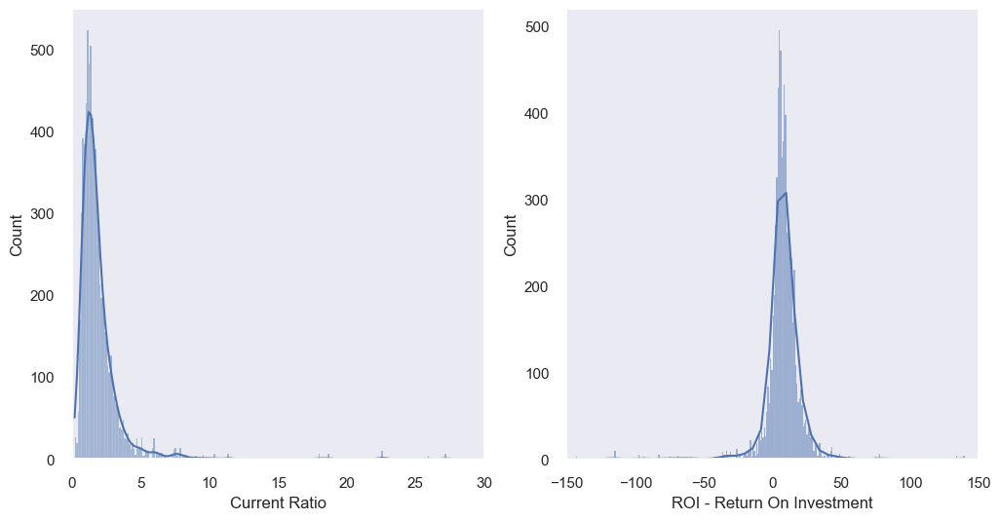

In [1170]:
# Gráfico 1 Asimetría y Curtosis
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Gráfico 1: Current Ratio
sns.histplot(df, x='Current Ratio', kde=True, ax=ax1)
ax1.set_xlim([0, 30])

# Gráfico 2: ROI - Return On Investment
sns.histplot(df, x='ROI - Return On Investment', kde=True, ax=ax2)
ax2.set_xlim([-150, 150])

plt.show()

Conclusión 1:
1. Current Ratio: Distribución Simétrica con Custosis Positiva y Asimetría Positiva (Hacia la Derecha).
2. ROI - Return On Investment: Distribución Simétrica con Curtosis Positiva y sin Asimetrías evidentes. 

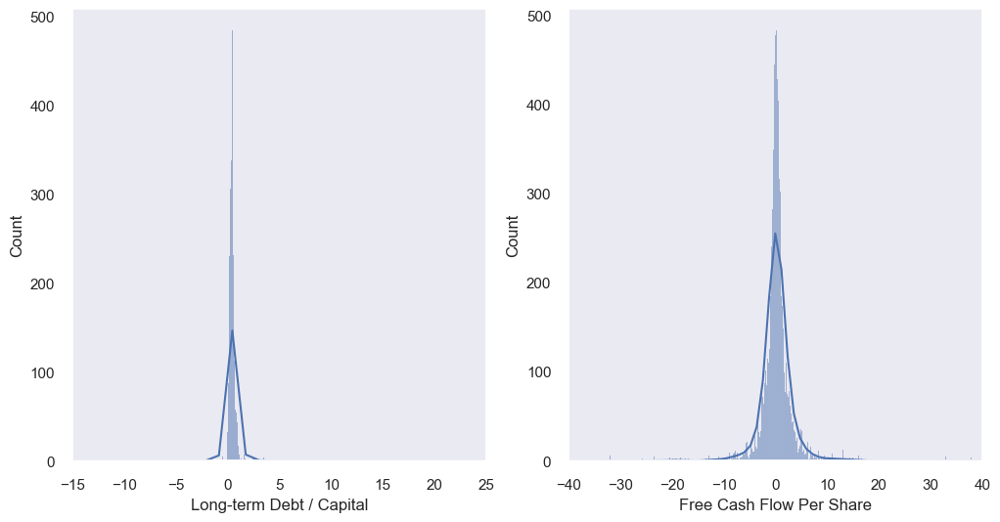

In [1171]:
# Gráfico 2 Asimetría y Curtosis
fig, (ax3, ax4) = plt.subplots(1, 2, figsize=(12, 6))

# Gráfico 3: Long-term Debt / Capital
sns.histplot(df, x='Long-term Debt / Capital', kde=True, ax=ax3)
ax3.set_xlim([-15,25])

# Gráfico 4: Free Cash Flow Per Share
sns.histplot(df, x='Free Cash Flow Per Share', kde=True, ax=ax4)
ax4.set_xlim([-40,40])

plt.show()

Conclusión 2:
1. Long-term Debt / Capital: Distribución Asimétrica con Custosis Positiva muy alta y Asimetría Positiva (Hacia la Derecha).
2. Free Cash Flow Per Share: Distribución Simétrica con Curtosis Positiva y sin Asimetrías evidentes. 

5.5.3.4 Tests de Normalidad.

In [1172]:
# Test de Shapiro
nivel_significancia = 0.05

for column in df_var_selecc.columns:
    p_value = stats.shapiro(df_var_selecc[column])[0]  # Obtiene el primer valor de la tupla
    print(f'P Value de {column}:', p_value)
    if p_value < nivel_significancia:
        print(f'Los datos de {column} NO siguen una distribución normal.')
    else:
        print(f'Los datos de {column} siguen una distribución normal.')

P Value de Current Ratio: 0.49128232549654094
Los datos de Current Ratio siguen una distribución normal.
P Value de ROI - Return On Investment: 0.3095762296101294
Los datos de ROI - Return On Investment siguen una distribución normal.
P Value de Long-term Debt / Capital: 0.037198424915057315
Los datos de Long-term Debt / Capital NO siguen una distribución normal.
P Value de Free Cash Flow Per Share: 0.2988703215934564
Los datos de Free Cash Flow Per Share siguen una distribución normal.


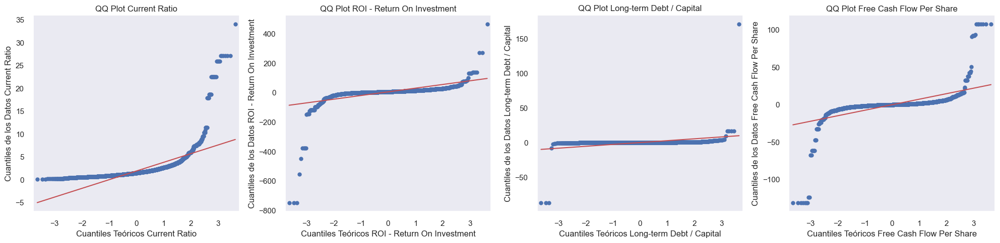

In [1173]:
# QQ Plot
num_columns = len(df_var_selecc.columns)
fig, axes = plt.subplots(1, num_columns, figsize=(5 * num_columns, 5))

for i, column in enumerate(df_var_selecc.columns):
    sm.qqplot(df_var_selecc[column], line='s', ax=axes[i])
    axes[i].set_xlabel(f'Cuantiles Teóricos {column}')
    axes[i].set_ylabel(f'Cuantiles de los Datos {column}')
    axes[i].set_title(f'QQ Plot {column}')

plt.tight_layout()
plt.show()

Contrastando los Resultados de los Tests y Analizando los Gráficos de Histograma, se concluye lo siguiente:
1. Current Ratio: Los Datos poseen una Distribución Normal.
2. ROI - Return On Investment: Los Datos poseen una Distribución Normal.
3. Long-term Debt / Capital: Los Datos NO poseen una Distribución Normal.
4. Free Cash Flow Per Share: Los Datos poseen una Distribución Normal.

5.5.4 Identificación y Tratamiento de Valores Atípicos (Outliers) - Univariado
https://repository.javeriana.edu.co/bitstream/handle/10554/10347/MorenoCastellanosJuanGabriel2012.pdf

(0.0, 35.0)

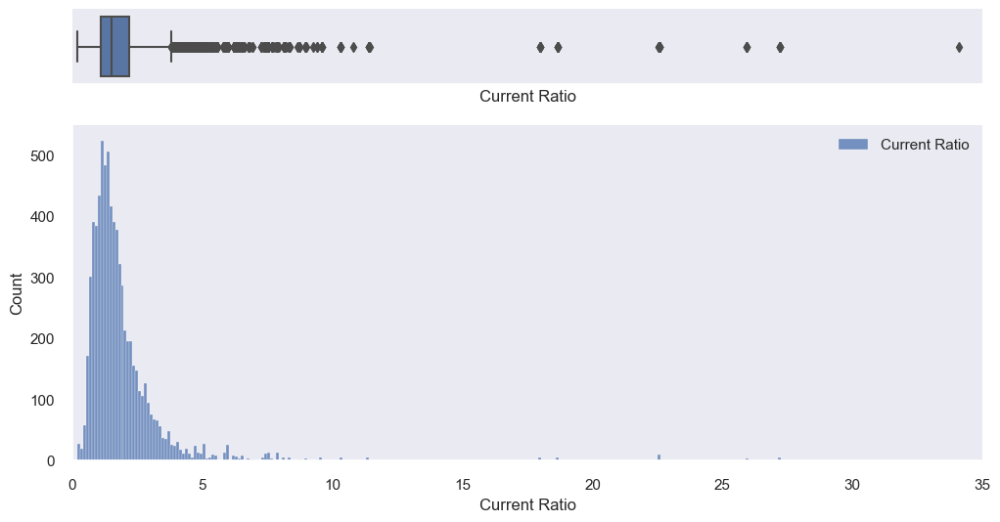

In [1174]:
# Box Plot 1: Current Ratio
import warnings
warnings.filterwarnings("ignore")

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(12,6), gridspec_kw={"height_ratios": (.2, .9)})
sns.boxplot(df['Current Ratio'], ax=ax_box, orient="h") 
sns.histplot(df['Current Ratio'], ax=ax_hist, label='Current Ratio')
ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)
ax_hist.legend()
ax_hist.set_xlim(0,35)

Se identifican Outliers Leves y Extremos sobre el Tercer Cuartil (Q3).

(-200.0, 200.0)

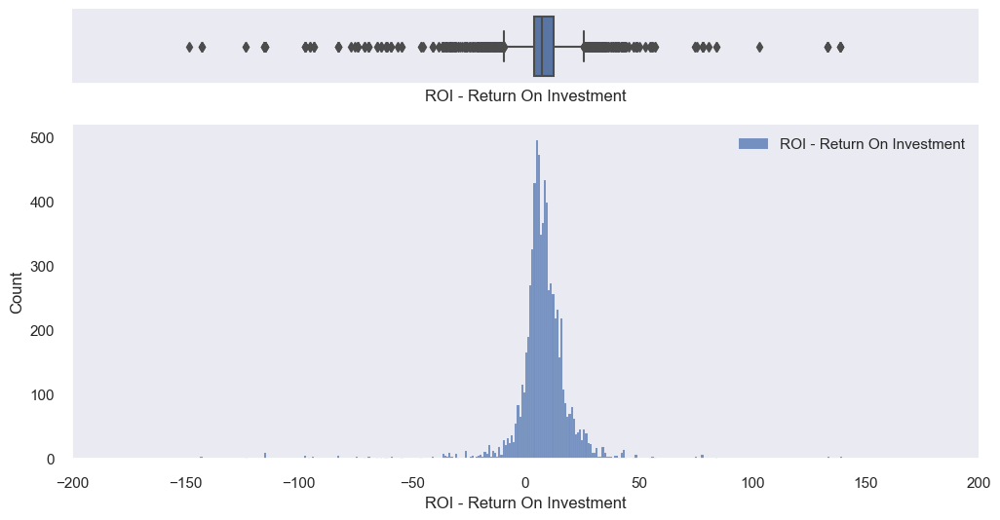

In [1175]:
# Box Plot 2: ROI - Return On Investment
import warnings
warnings.filterwarnings("ignore")

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(12,6), gridspec_kw={"height_ratios": (.2, .9)})
sns.boxplot(df['ROI - Return On Investment'], ax=ax_box, orient="h") 
sns.histplot(df['ROI - Return On Investment'], ax=ax_hist, label='ROI - Return On Investment')
ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)
ax_hist.legend()
ax_hist.set_xlim(-200,200)

Se identifican Outliers Leves y Extremos bajo el primer (Q1) y sobre el Tercer Cuartil (Q3).

(-5.0, 5.0)

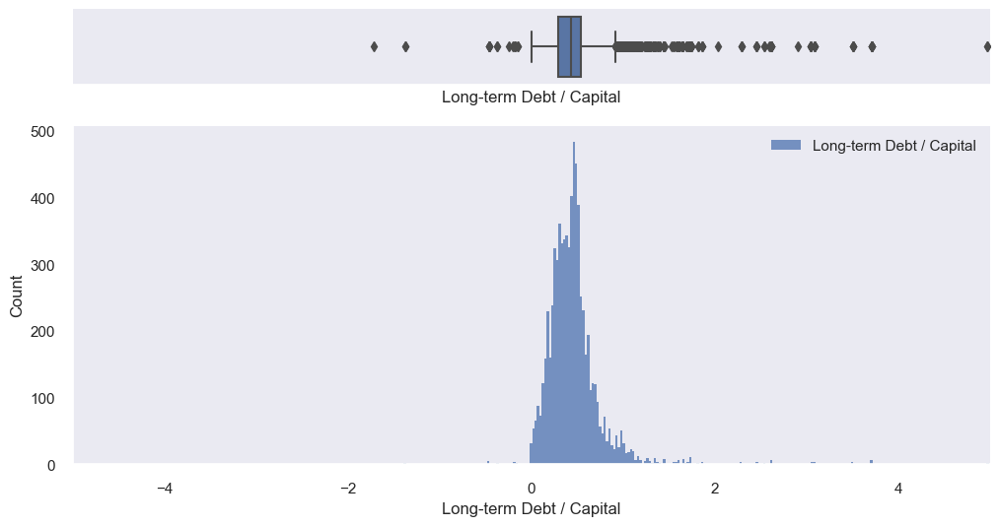

In [1176]:
# Box Plot 3: Long-term Debt / Capital
import warnings
warnings.filterwarnings("ignore")

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(12,6), gridspec_kw={"height_ratios": (.2, .9)})
sns.boxplot(df['Long-term Debt / Capital'], ax=ax_box, orient="h") 
sns.histplot(df['Long-term Debt / Capital'], ax=ax_hist, label='Long-term Debt / Capital')
ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)
ax_hist.legend()
ax_hist.set_xlim(-5,5)

Se identifican Outliers Leves bajo el Primer Cuartil (Q1) y Outliers Leves y Extremos sobre el Tercer Cuartil (Q3).

(-50.0, 50.0)

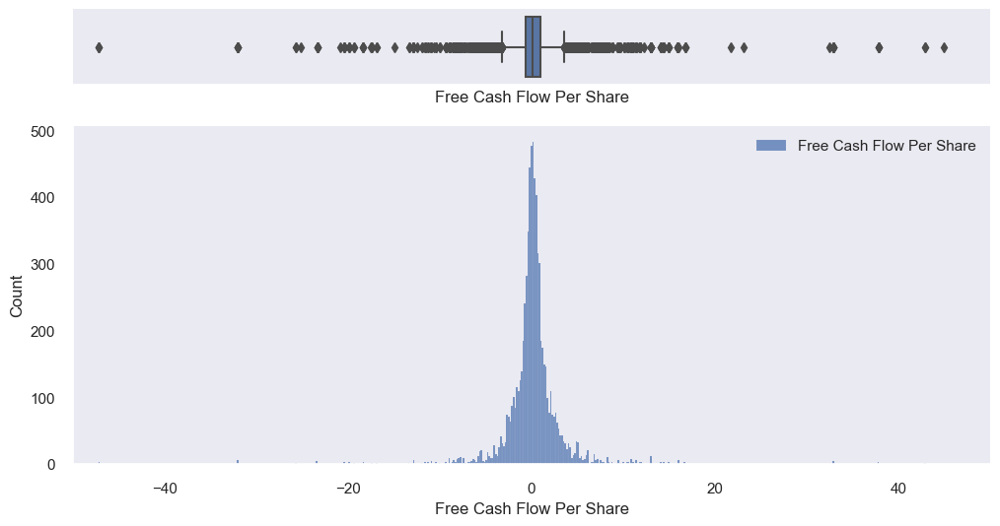

In [1177]:
# Box Plot 4: Free Cash Flow Per Share
import warnings
warnings.filterwarnings("ignore")

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(12,6), gridspec_kw={"height_ratios": (.2, .9)})
sns.boxplot(df['Free Cash Flow Per Share'], ax=ax_box, orient="h") 
sns.histplot(df['Free Cash Flow Per Share'], ax=ax_hist, label='Free Cash Flow Per Share')
ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)
ax_hist.legend()
ax_hist.set_xlim(-50,50)

Se identifican Outliers Leves y Extremos bajo el Primer Cuartil (Q1) y Outliers Leves y Extremos sobre el Tercer Cuartil (Q3).

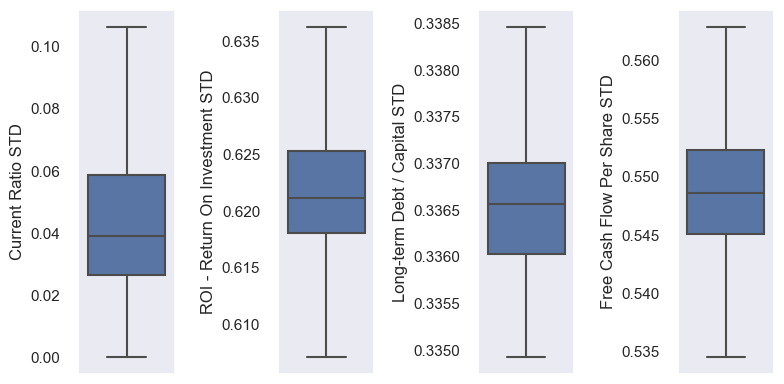

In [1178]:
# Box Plot 5
# Estandarizamos las variables para no desvirtuar el gráfico, considerando los diferentes órdenes de magnitud.
# Dejamos los valores atípicos fuera del gráfico para mejorar la visualización.

from sklearn.preprocessing import MinMaxScaler

df['Current Ratio STD'] = df['Current Ratio']
df['ROI - Return On Investment STD'] = df['ROI - Return On Investment']
df['Long-term Debt / Capital STD'] = df['Long-term Debt / Capital']
df['Free Cash Flow Per Share STD'] = df['Free Cash Flow Per Share']

variables = ['Current Ratio STD', 'ROI - Return On Investment STD', 'Long-term Debt / Capital STD', 'Free Cash Flow Per Share STD']

scaler = MinMaxScaler()
df[variables] = scaler.fit_transform(df[variables])

fig, axes = plt.subplots(1, len(variables), figsize=(8,4))

for ax, variable in zip(axes, variables):
    ax = sns.boxplot( y=variable, data=df, ax=ax, showfliers=False)
plt.tight_layout()
plt.show()

Ratios Financieros por Industria https://www.cubesoftware.com/blog/financial-ratios

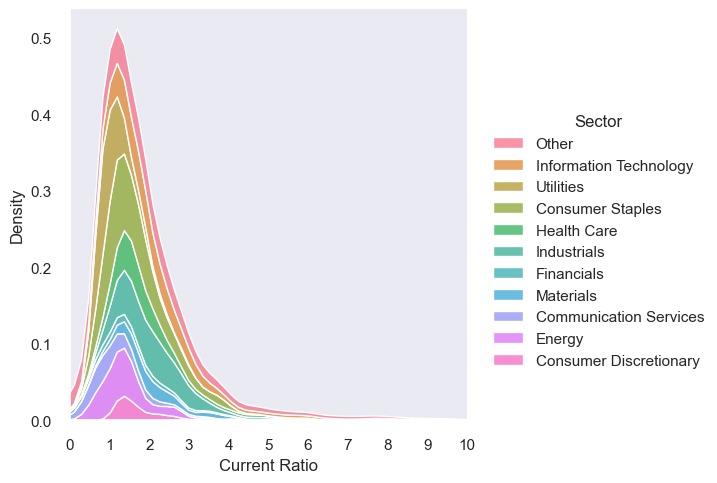

In [1179]:
sns.displot(df, x='Current Ratio', hue='Sector', kind="kde", multiple='stack')
plt.xlim(0,10)
plt.xticks(range(0, 11))
plt.show()

Rangos de Current Ratio: Fluctuan entre 0 y 4 generalmente. Valores mayores a 4 podrían ser considerados como valores atípicos, dependiendo de las circunstancias, por lo cual, deben ser evaluados en mayor profundidad.

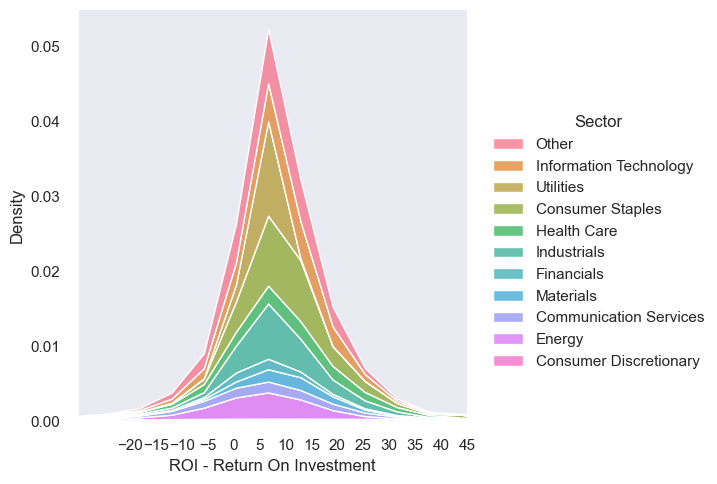

In [1180]:
sns.displot(df, x='ROI - Return On Investment', hue='Sector', kind="kde", multiple='stack')
plt.xlim(-30,30)
plt.xticks(range(-20, 50, 5))
plt.show()

Rangos de ROI - Return On Investment: Fluctuan entre -100% y 200% generalmente. Valores mayores a 2 podrían ser considerados como valores atípicos, por lo cual, se debe utilizar como punto de referencia otras empresas de la misma Industria para analizarlos.

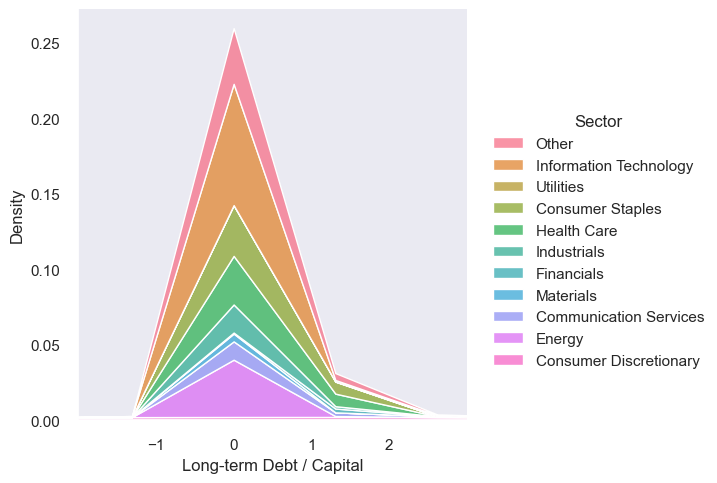

In [1181]:
sns.displot(df, x='Long-term Debt / Capital', hue='Sector', kind="kde", multiple='stack')
plt.xlim(-2,3)
plt.xticks(range(-1, 3, 1))
plt.show()

Rangos de Long-Term Debt / Capital: Los Coeficientes de Endeudamiento dependen directamente de la etapa de creciemiento de la empresa y de la Industria a la cual pertenecen. En general, empresas de crecimiento rápido como las startups poseen altos coeficientes de endeudamiento a diferencia de empresas más maduras, por otro lado, se conoce que empresas del mundo financiero y de retail, suelen tener mayores coeficientes de endeudamiento, llegando algunas veces a alcanzar relaciones de endeudamiento sobre capital de 2:1. Finalmente, los ratios de endeudamiento negativos, indican que la empresa no dispone de ningún recurso propio para financiarse.

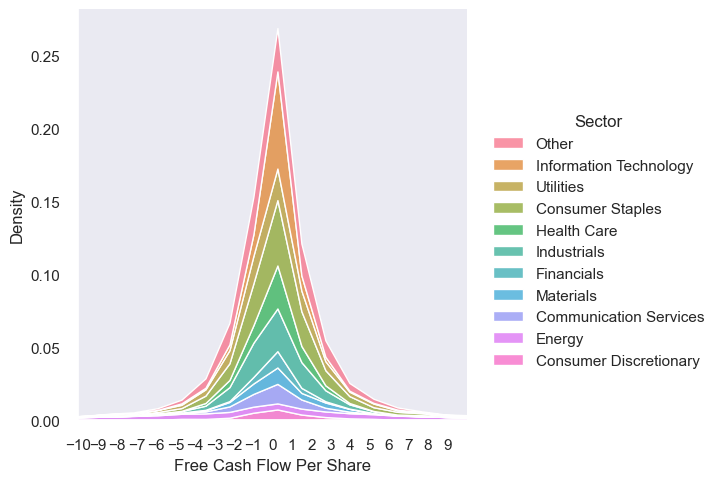

In [1182]:
sns.displot(df, x='Free Cash Flow Per Share', hue='Sector', kind="kde", multiple='stack')
plt.xlim(-10,10)
plt.xticks(range(-10, 10, 1))
plt.show()

Rangos de Free Cash Flow Per Share: Es difícil definir un rango de valores aceptables, ya que este valor depende directamente del número de acciones que posee la empresa en circulación, por lo tanto puede variar significativamente entre una empresa y otra con flujos de caja similares.

TRATAMIENTO DE OUTLIERS

Distribuciones NO Normales.
1. Long-term Debt / Capital

In [1183]:
# Método de las Desviaciones Absolutas Medianas (MAD)
median = np.median(df['Long-term Debt / Capital'])
mad = np.median(np.abs(df['Long-term Debt / Capital'] - median))

# Definir umbral para los outliers por lo general se usa desde 2,5 hasta 3,5
threshold = 3.5

# Detección de outliers
outliers = df['Long-term Debt / Capital'][np.abs(df['Long-term Debt / Capital'] - median) / mad > threshold]

print("Outliers detectados por el Método de las Desviaciones Absolutas Medianas (MAD):")
print(outliers)

Outliers detectados por el Método de las Desviaciones Absolutas Medianas (MAD):
40       1.01
101      0.90
222    171.50
139      9.96
308      1.15
        ...  
7707     1.07
7353     0.92
7539     0.97
7675     0.94
7746     1.14
Name: Long-term Debt / Capital, Length: 443, dtype: float64


El método MAD, identifica muchos valores atípicos que NO necesariamente lo son, de acuerdo al conocimiento Financiero de los Ratios.

In [1184]:
df['Long-term Debt / Capital'].describe()

count   7285.00
mean       0.45
std        2.72
min      -86.36
25%        0.29
50%        0.42
75%        0.54
max      171.50
Name: Long-term Debt / Capital, dtype: float64

Se procede a definir como Outliers, todos aquellos valores de 'Long-term Debt / Capital' > 2 y -1 > 'Long-term Debt / Capital'.

In [1185]:
# Detección de Outliers y Valores Imposibles
df['Long-term Debt / Capital Outliers'] = 0
col1 = 'Long-term Debt / Capital'

def filtro_outliers(df, col1):
    Q1 = df[col1].quantile(0.25)
    Q3 = df[col1].quantile(0.75)
    IQR = Q3 - Q1
    df.loc[( (df[col1] > 2) | (df[col1] < -1)), 'Long-term Debt / Capital Outliers'] = 1

filtro_outliers(df,col1)
df[['Long-term Debt / Capital','Long-term Debt / Capital Outliers']][df['Long-term Debt / Capital Outliers'] == 1]

,Long-term Debt / Capital,Long-term Debt / Capital Outliers
222,171.50,1
139,9.96,1
112,2.46,1
346,-7.44,1
114,2.46,1
235,4.97,1
115,2.46,1
236,4.97,1
712,-1.38,1
1000,-86.36,1


In [1186]:
df['Long-term Debt / Capital Outliers'].value_counts()

Long-term Debt / Capital Outliers
0    7235
1      50
Name: count, dtype: int64

In [1187]:
df['Long-term Debt / Capital'][df['Long-term Debt / Capital Outliers'] == 1].describe()

count    50.00
mean      1.86
std      33.00
min     -86.36
25%       2.46
50%       3.04
75%       3.71
max     171.50
Name: Long-term Debt / Capital, dtype: float64

In [1188]:
# Agrupaciones de Años y Meses son Poco Representativas para el Reemplazo de Outliers, 
df.groupby(['Rating','Sector','Year','Month'])['Long-term Debt / Capital'].describe().round(1)

count  mean  std  min  \
Rating            Sector                 Year Month                          
Alta              Communication Services 2013 9       1.00  0.50  NaN 0.50   
                                         2014 7       1.00  0.10  NaN 0.10   
                                              9       1.00  0.10  NaN 0.10   
                  Consumer Discretionary 2013 11      1.00  0.60  NaN 0.60   
                                         2014 5       1.00  0.60  NaN 0.60   
...                                                    ...   ...  ...  ...   
Riesgo Sustancial Utilities              2015 1       1.00  0.70  NaN 0.70   
                                              3       1.00  0.60  NaN 0.60   
                                              5       1.00  0.70  NaN 0.70   
                                              6       2.00  0.50 0.10 0.50   
                                              9       2.00  0.50 0.10 0.50   

                                                     25%  50%  75%  max  
Rating            Sector                 Year Month                      
Alta              Communication Services 2013 9     0.50 0.50 0.50 0.50  
                                         2014 7     0.10 0.10 0.10 0.10  
                                              9     0.10 0.10 0.10 0.10  
                  Consumer Discretionary 2013 11    0.60 0.60 0.60 0.60  
                                         2014 5     0.60 0.60 0.60 0.60  
...                                                  ...  ...  ...  ...  
Riesgo Sustancial Utilities              2015 1     0.70 0.70 0.70 0.70  
                                              3     0.60 0.60 0.60 0.60  
                                              5     0.70 0.70 0.70 0.70  
                                              6     0.50 0.50 0.60 0.60  
                                              9     0.50 0.50 0.60 0.60  

[3015 rows x 8 columns]

In [1189]:
# Considerando ahora solo el Año, es posible realizar reemplazos con promedios de muestras más variadas.
df.groupby(['Rating','Sector','Year'])['Long-term Debt / Capital'].describe().round(1)

count  mean  std  min  25%  \
Rating            Sector                 Year                               
Alta              Communication Services 2013   1.00  0.50  NaN 0.50 0.50   
                                         2014   2.00  0.10 0.00 0.10 0.10   
                  Consumer Discretionary 2013   1.00  0.60  NaN 0.60 0.60   
                                         2014   3.00  0.60 0.00 0.60 0.60   
                                         2015   2.00  0.50 0.00 0.50 0.50   
...                                              ...   ...  ...  ...  ...   
Riesgo Sustancial Other                  2016  22.00  1.00 0.90 0.10 0.40   
                  Utilities              2012   3.00  0.30 0.30 0.10 0.10   
                                         2013   4.00  0.50 0.20 0.10 0.50   
                                         2014   6.00  0.50 0.20 0.20 0.50   
                                         2015   7.00  0.60 0.10 0.50 0.50   

                                               50%  75%  max  
Rating            Sector                 Year                 
Alta              Communication Services 2013 0.50 0.50 0.50  
                                         2014 0.10 0.10 0.10  
                  Consumer Discretionary 2013 0.60 0.60 0.60  
                                         2014 0.60 0.60 0.60  
                                         2015 0.50 0.50 0.50  
...                                            ...  ...  ...  
Riesgo Sustancial Other                  2016 0.70 0.90 3.00  
                  Utilities              2012 0.10 0.30 0.60  
                                         2013 0.60 0.60 0.60  
                                         2014 0.60 0.60 0.60  
                                         2015 0.60 0.60 0.70  

[456 rows x 8 columns]

In [1190]:
# Creamos un diccionario con la agrupación de las categorías 'Rating','Sector', 'Year'. 
mapping_dict_1 = df.set_index(['Rating','Sector','Year'])['Long-term Debt / Capital'].to_dict()

In [1191]:
# Valores promedio por agrupación:
average_ltd_cap_dict = df.groupby(['Rating','Sector','Year'])['Long-term Debt / Capital'].mean().to_dict()

In [1192]:
# Utilizamos una función para reemplazar los valores promedios de las categorías, siempre y cuando el valor sea un Outlier.
def replace_with_average(row, average_ltd_cap_dict):
    if row['Long-term Debt / Capital Outliers'] == 1:
        return average_ltd_cap_dict.get((row['Rating'], row['Sector'], row['Year']), row['Long-term Debt / Capital'])
    return row['Long-term Debt / Capital']

# Reemplazamos el Precio por el Promedio en la misma columna.
df['Long-term Debt / Capital'] = df.apply(replace_with_average, axis=1, args=(average_ltd_cap_dict,))

df_ltd_cap_updated = df[df['Long-term Debt / Capital Outliers'] == 1]

In [1193]:
df_ltd_cap_updated.groupby(['Rating','Sector','Year'])['Long-term Debt / Capital'].describe().round(1)

count   mean  std    min  \
Rating                 Sector                 Year                             
Altamente Especulativa Communication Services 2013   2.00   1.10 0.00   1.10   
                       Consumer Discretionary 2013   2.00   3.40 0.00   3.40   
                                              2014   4.00   1.90 0.00   1.90   
                                              2015   5.00   1.40 0.00   1.40   
                       Energy                 2012   2.00   0.90 0.00   0.90   
                       Information Technology 2011   1.00  -1.30  NaN  -1.30   
                       Other                  2016   1.00   0.60  NaN   0.60   
Especulativa           Communication Services 2013   2.00   1.30 0.00   1.30   
                       Information Technology 2012   1.00   0.20  NaN   0.20   
Media                  Other                  2011   2.00   1.40 0.00   1.40   
Media Inferior         Other                  2013   1.00   0.30  NaN   0.30   
Media Superior         Information Technology 2016   2.00   0.60 0.00   0.60   
Riesgo Sustancial      Communication Services 2011   3.00   2.50 0.00   2.50   
                       Consumer Discretionary 2011   1.00  44.10  NaN  44.10   
                                              2012   4.00 -40.00 0.00 -40.00   
                                              2013   2.00   6.30 0.00   6.30   
                                              2014   2.00   2.70 0.00   2.70   
                       Health Care            2014   4.00   1.20 0.00   1.20   
                       Information Technology 2011   1.00   5.40  NaN   5.40   
                                              2012   1.00  -0.40  NaN  -0.40   
                       Other                  2012   3.00   0.90 0.00   0.90   
                                              2015   1.00   0.80  NaN   0.80   
                                              2016   3.00   1.00 0.00   1.00   

                                                      25%    50%    75%    max  
Rating                 Sector                 Year                              
Altamente Especulativa Communication Services 2013   1.10   1.10   1.10   1.10  
                       Consumer Discretionary 2013   3.40   3.40   3.40   3.40  
                                              2014   1.90   1.90   1.90   1.90  
                                              2015   1.40   1.40   1.40   1.40  
                       Energy                 2012   0.90   0.90   0.90   0.90  
                       Information Technology 2011  -1.30  -1.30  -1.30  -1.30  
                       Other                  2016   0.60   0.60   0.60   0.60  
Especulativa           Communication Services 2013   1.30   1.30   1.30   1.30  
                       Information Technology 2012   0.20   0.20   0.20   0.20  
Media                  Other                  2011   1.40   1.40   1.40   1.40  
Media Inferior         Other                  2013   0.30   0.30   0.30   0.30  
Media Superior         Information Technology 2016   0.60   0.60   0.60   0.60  
Riesgo Sustancial      Communication Services 2011   2.50   2.50   2.50   2.50  
                       Consumer Discretionary 2011  44.10  44.10  44.10  44.10  
                                              2012 -40.00 -40.00 -40.00 -40.00  
                                              2013   6.30   6.30   6.30   6.30  
                                              2014   2.70   2.70   2.70   2.70  
                       Health Care            2014   1.20   1.20   1.20   1.20  
                       Information Technology 2011   5.40   5.40   5.40   5.40  
                                              2012  -0.40  -0.40  -0.40  -0.40  
                       Other                  2012   0.90   0.90   0.90   0.90  
                                              2015   0.80   0.80   0.80   0.80  
                                              2016   1.00   1.00   1.00   1.00

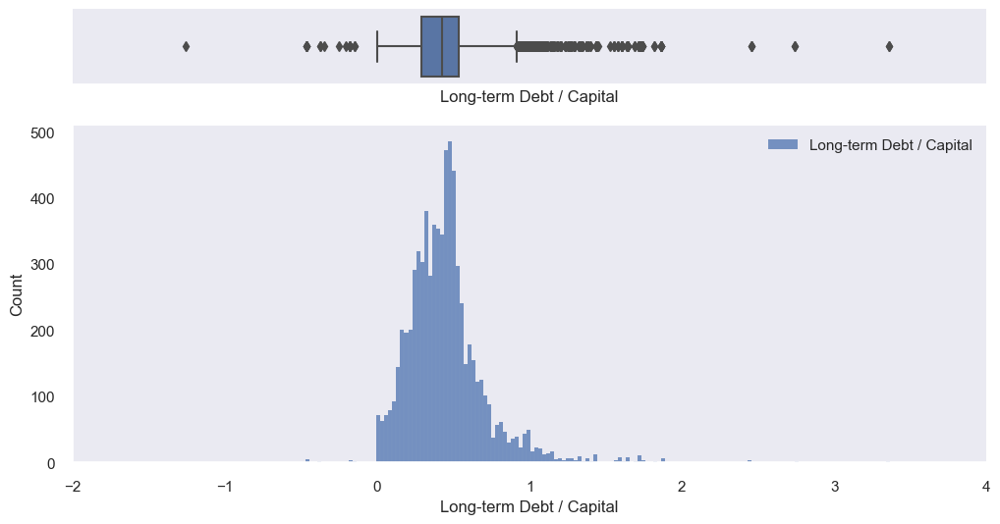

In [1194]:
# Box Plot 6: Long-term Debt / Capital - Outliers Tratados.
import warnings
warnings.filterwarnings("ignore")

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(12,6), gridspec_kw={"height_ratios": (.2, .9)})
sns.boxplot(df['Long-term Debt / Capital'], ax=ax_box, orient="h") 
sns.histplot(df['Long-term Debt / Capital'], ax=ax_hist, label='Long-term Debt / Capital')
ax_box.set(yticks=[])
ax_box.set_xlim(-2,4)
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)
ax_hist.legend()

In [1195]:
df.drop(columns='Long-term Debt / Capital Outliers', inplace=True)

Distribuciones Normales.
1. Current Ratio
2. ROI - Return On Investment
3. Free Cash Flow Per Share

In [1196]:
# Variable Dependiente: 'Current Ratio'
# Identificamos los valores atípicos de acuerdo al modelo Z-Score (Estandarización). 
# Estandarizamos los valores de la variable, para poder comparar todos los valores bajo una misma regla, haciendo más fácil la identificación de valores atípicos.

df['Current Ratio Z'] = (df['Current Ratio'] - df['Current Ratio'].mean())/df['Current Ratio'].std()
df['Current Ratio Outliers'] = 0
df.loc[(df['Current Ratio Z']>3)|(df['Current Ratio Z']<-3) , 'Current Ratio Outliers'] = 1
df[['Current Ratio', 'Current Ratio Z','Current Ratio Outliers']]

,Current Ratio,Current Ratio Z,Current Ratio Outliers
33,2.97,0.55,0
8,1.07,-0.45,0
3,0.84,-0.57,0
16,2.54,0.33,0
29,0.84,-0.57,0
...,...,...,...
7299,1.91,-0.01,0
7434,2.80,0.47,0
7506,1.45,-0.25,0
7585,2.86,0.49,0


In [1197]:
df['Current Ratio Outliers'].value_counts()

Current Ratio Outliers
0    7188
1      97
Name: count, dtype: int64

In [1198]:
print(df.loc[df['Current Ratio Outliers']== 1, 'Current Ratio'])

24      7.92
73     34.08
209     8.32
210     8.32
60      8.35
        ... 
6942   17.98
7364    7.86
7309    8.19
7721    8.66
7310    8.19
Name: Current Ratio, Length: 97, dtype: float64


In [1199]:
print(df.loc[df['Current Ratio Outliers'] == 1, 'Current Ratio'].max())
print(df.loc[df['Current Ratio Outliers'] == 1, 'Current Ratio'].min())

34.0768
7.6585


In [1200]:
# Agrupaciones de Clasificación, Sector y Año si son Representativas para el Reemplazo de Outliers.
df.groupby(['Rating','Sector','Year'])[['Current Ratio','ROI - Return On Investment','Free Cash Flow Per Share']].describe().round(1)

Current Ratio                 \
                                                      count mean  std  min   
Rating            Sector                 Year                                
Alta              Communication Services 2013          1.00 1.30  NaN 1.30   
                                         2014          2.00 3.20 0.00 3.20   
                  Consumer Discretionary 2013          1.00 1.70  NaN 1.70   
                                         2014          3.00 2.70 0.00 2.70   
                                         2015          2.00 1.60 0.00 1.60   
...                                                     ...  ...  ...  ...   
Riesgo Sustancial Other                  2016         22.00 5.30 7.10 0.50   
                  Utilities              2012          3.00 1.40 0.10 1.30   
                                         2013          4.00 1.70 0.10 1.60   
                                         2014          6.00 1.70 0.20 1.30   
                                         2015          7.00 1.20 0.50 0.80   

                                                                    \
                                               25%  50%  75%   max   
Rating            Sector                 Year                        
Alta              Communication Services 2013 1.30 1.30 1.30  1.30   
                                         2014 3.20 3.20 3.20  3.20   
                  Consumer Discretionary 2013 1.70 1.70 1.70  1.70   
                                         2014 2.70 2.70 2.70  2.70   
                                         2015 1.60 1.60 1.60  1.60   
...                                            ...  ...  ...   ...   
Riesgo Sustancial Other                  2016 1.30 1.70 2.80 18.00   
                  Utilities              2012 1.40 1.50 1.50  1.50   
                                         2013 1.70 1.70 1.70  1.70   
                                         2014 1.60 1.80 1.80  1.80   
                                         2015 0.80 1.00 1.70  1.70   

                                              ROI - Return On Investment  \
                                                                   count   
Rating            Sector                 Year                              
Alta              Communication Services 2013                       1.00   
                                         2014                       2.00   
                  Consumer Discretionary 2013                       1.00   
                                         2014                       3.00   
                                         2015                       2.00   
...                                                                  ...   
Riesgo Sustancial Other                  2016                      22.00   
                  Utilities              2012                       3.00   
                                         2013                       4.00   
                                         2014                       6.00   
                                         2015                       7.00   

                                                       ...                  \
                                                 mean  ...     75%     max   
Rating            Sector                 Year          ...                   
Alta              Communication Services 2013 -552.10  ... -552.10 -552.10   
                                         2014 -123.30  ... -123.30 -123.30   
                  Consumer Discretionary 2013    8.70  ...    8.70    8.70   
                                         2014    9.00  ...    9.00    9.00   
                                         2015   11.40  ...   11.40   11.40   
...                                               ...  ...     ...     ...   
Riesgo Sustancial Other                  2016    4.20  ...   16.10   16.20   
                  Utilities              2012    6.30  ...    8.90    8.90   
                                         2013    

In [1201]:
# Creamos un diccionario con la agrupación de las categorías 'Rating','Sector','Year'.
mapping_dict_2 = df.set_index(['Rating','Sector','Year'])['Current Ratio'].to_dict()

In [1202]:
# Valores promedio por agrupación:
average_cr_dict = df.groupby(['Rating','Sector','Year'])['Current Ratio'].mean().to_dict()

In [1203]:
# Utilizamos una función para reemplazar los valores promedios de las categorías, siempre y cuando el valor sea un Outlier.
def replace_with_average(row, average_cr_dict):
    if row['Current Ratio Outliers'] == 1:
        return average_cr_dict.get((row['Rating'], row['Sector'], row['Year']), row['Current Ratio'])
    return row['Current Ratio']

# Reemplazamos el Precio por el Promedio en la misma columna.
df['Current Ratio'] = df.apply(replace_with_average, axis=1, args=(average_cr_dict,))

df_cr_updated = df[df['Current Ratio Outliers'] == 1]

In [1204]:
df_cr_updated.groupby(['Rating','Sector','Year'])['Current Ratio'].describe().round(1)

count  mean  std  min  \
Rating                 Sector                 Year                          
Altamente Especulativa Communication Services 2014   2.00  2.00 0.00 2.00   
                       Information Technology 2010   1.00  7.90  NaN 7.90   
                                              2012   3.00  2.60 0.00 2.60   
                                              2013   1.00  2.60  NaN 2.60   
                                              2014   1.00  3.30  NaN 3.30   
                                              2015   1.00  2.90  NaN 2.90   
                                              2016   1.00  2.90  NaN 2.90   
                       Other                  2012   1.00  2.70  NaN 2.70   
                                              2014   5.00  4.30 0.00 4.30   
                                              2015   5.00  3.70 0.00 3.70   
                                              2016   3.00  2.30 0.00 2.30   
Especulativa           Financials             2012   1.00  5.60  NaN 5.60   
                       Industrials            2015   5.00  2.60 0.00 2.60   
                       Other                  2013   3.00  3.40 0.00 3.40   
                                              2014   5.00  3.70 0.00 3.70   
                                              2015   7.00  3.30 0.00 3.30   
                                              2016   2.00  2.40 0.00 2.40   
Media                  Financials             2012   1.00  4.40  NaN 4.40   
                       Information Technology 2011   1.00  3.00  NaN 3.00   
                                              2012   3.00  2.80 0.00 2.80   
                                              2013   2.00  2.60 0.00 2.60   
                                              2014   1.00  2.20  NaN 2.20   
                       Other                  2015   7.00  2.40 0.00 2.40   
Media Inferior         Information Technology 2016   1.00  2.20  NaN 2.20   
                       Other                  2012   1.00  2.10  NaN 2.10   
                                              2013   3.00  2.50 0.00 2.50   
                                              2014   1.00  2.50  NaN 2.50   
                                              2015   1.00  2.10  NaN 2.10   
Media Superior         Information Technology 2013   2.00  2.80 0.00 2.80   
                                              2014   3.00  2.60 0.00 2.60   
Riesgo Sustancial      Other                  2011   3.00  8.20 0.00 8.20   
                                              2012   3.00  5.40 0.00 5.40   
                                              2013   6.00  9.60 0.00 9.60   
                                              2014   4.00  4.50 0.00 4.50   
                                              2015   2.00  3.60 0.00 3.60   
                                              2016   5.00  5.30 0.00 5.30   

                                                    25%  50%  75%  max  
Rating                 Sector                 Year                      
Altamente Especulativa Communication Services 2014 2.00 2.00 2.00 2.00  
                       Information Technology 2010 7.90 7.90 7.90 7.90  
                                              2012 2.60 2.60 2.60 2.60  
                                              2013 2.60 2.60 2.60 2.60  
                                              2014 3.30 3.30 3.30 3.30  
                                              2015 2.90 2.90 2.90 2.90  
                                              2016 2.90 2.90 2.90 2.90  
                       Other                  2012 2.70 2.70 2.70 2.70  
                                              2014 4.30 4.30 4.30 4.30  
                                              2015 3.70 3.70 3.70 3.70  
                                              2016 2.30 2.30 2.30 2.30  
Especulativa           Financials             2012 5.60 5.60 5.60 5.60  
                       Industrials            2015 2.60 2.60 2.60 2.60  
                       Other  

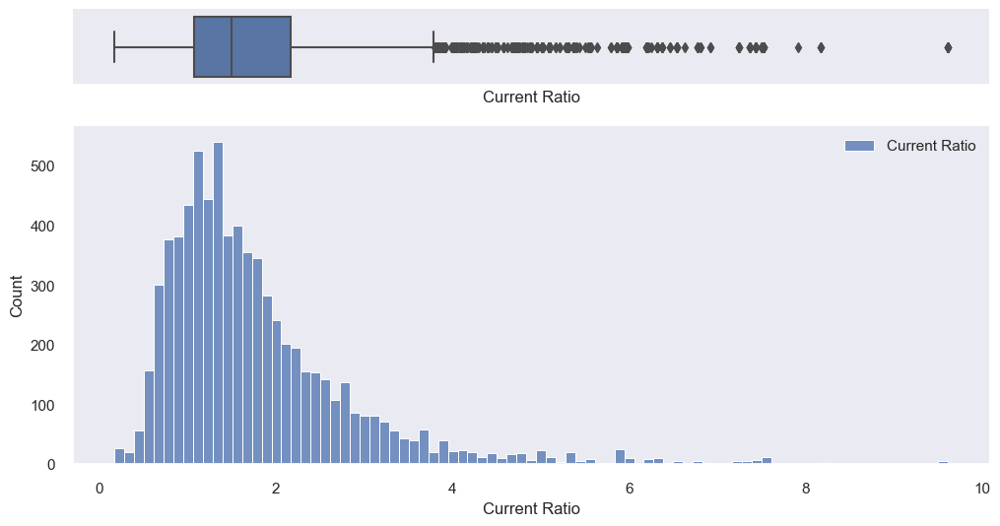

In [1205]:
# Box Plot 7: Current Ratio - Outliers Tratados.
import warnings
warnings.filterwarnings("ignore")

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(12,6), gridspec_kw={"height_ratios": (.2, .9)})
sns.boxplot(df['Current Ratio'], ax=ax_box, orient="h") 
sns.histplot(df['Current Ratio'], ax=ax_hist, label='Current Ratio')
ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)
ax_hist.legend()

In [1206]:
df.drop(columns='Current Ratio Outliers', inplace=True)

In [1207]:
# Variable Dependiente: 'ROI - Return On Investment'
# Identificamos los valores atípicos de acuerdo al modelo Z-Score (Estandarización). 
# Estandarizamos los valores de la variable, para poder comparar todos los valores bajo una misma regla, haciendo más fácil la identificación de valores atípicos.

df['ROI - Return On Investment Z'] = (df['ROI - Return On Investment'] - df['ROI - Return On Investment'].mean())/df['ROI - Return On Investment'].std()
df['ROI - Return On Investment Outliers'] = 0
df.loc[(df['ROI - Return On Investment Z']>3)|(df['ROI - Return On Investment Z']<-3) , 'ROI - Return On Investment Outliers'] = 1
df[['ROI - Return On Investment', 'ROI - Return On Investment Z','ROI - Return On Investment Outliers']]

,ROI - Return On Investment,ROI - Return On Investment Z,ROI - Return On Investment Outliers
33,18.10,0.44,0
8,11.80,0.19,0
3,5.10,-0.08,0
16,7.17,0.01,0
29,5.95,-0.04,0
...,...,...,...
7299,5.13,-0.08,0
7434,26.38,0.77,0
7506,-0.17,-0.29,0
7585,1.94,-0.20,0


In [1208]:
df['ROI - Return On Investment Outliers'].value_counts()

ROI - Return On Investment Outliers
0    7220
1      65
Name: count, dtype: int64

In [1209]:
print(df.loc[df['ROI - Return On Investment Outliers']== 1, 'ROI - Return On Investment'])

222     466.67
139    -445.83
346    -148.37
352      84.40
235     271.22
         ...  
7089    -97.13
7090    -97.13
7091    -97.13
7353   -142.79
7566    -71.19
Name: ROI - Return On Investment, Length: 65, dtype: float64


In [1210]:
print(df.loc[df['ROI - Return On Investment Outliers'] == 1, 'ROI - Return On Investment'].max())
print(df.loc[df['ROI - Return On Investment Outliers'] == 1, 'ROI - Return On Investment'].min())

466.6667
-745.4545


In [1211]:
# Creamos un diccionario con la agrupación de las categorías 'Rating','Sector','Year'.
mapping_dict_3 = df.set_index(['Rating','Sector','Year'])['ROI - Return On Investment'].to_dict()

In [1212]:
# Valores promedio por agrupación:
average_ROI_dict = df.groupby(['Rating','Sector','Year'])['ROI - Return On Investment'].mean().to_dict()

In [1213]:
# Utilizamos una función para reemplazar los valores promedios de las categorías, siempre y cuando el valor sea un Outlier.
def replace_with_average(row, average_ROI_dict):
    if row['ROI - Return On Investment Outliers'] == 1:
        return average_cr_dict.get((row['Rating'], row['Sector'], row['Year']), row['ROI - Return On Investment'])
    return row['ROI - Return On Investment']

# Reemplazamos el Precio por el Promedio en la misma columna.
df['ROI - Return On Investment'] = df.apply(replace_with_average, axis=1, args=(average_ROI_dict,))

df_ROI_updated = df[df['ROI - Return On Investment Outliers'] == 1]

In [1214]:
df_ROI_updated.groupby(['Rating','Sector','Year'])['ROI - Return On Investment'].describe().round(1)

count  mean  std  min  \
Rating                 Sector                 Year                          
Alta                   Communication Services 2013   1.00  1.30  NaN 1.30   
                                              2014   2.00  3.20 0.00 3.20   
Altamente Especulativa Communication Services 2014   2.00  2.00 0.00 2.00   
                       Consumer Discretionary 2013   1.00  1.40  NaN 1.40   
                       Consumer Staples       2012   1.00  1.80  NaN 1.80   
                       Energy                 2012   1.00  1.70  NaN 1.70   
                                              2016   6.00  1.10 0.00 1.10   
                       Industrials            2012   1.00  2.20  NaN 2.20   
                       Information Technology 2011   1.00  3.10  NaN 3.10   
                       Materials              2013   2.00  2.50 0.00 2.50   
                       Other                  2016   2.00  2.30 0.00 2.30   
Especulativa           Communication Services 2014   2.00  1.40 0.00 1.40   
                       Consumer Staples       2012   1.00  2.00  NaN 2.00   
Media                  Other                  2011   2.00  1.80 0.00 1.80   
Media Inferior         Financials             2011   2.00  0.30 0.00 0.30   
Riesgo Sustancial      Consumer Discretionary 2011   1.00  1.40  NaN 1.40   
                                              2012   4.00  1.40 0.00 1.40   
                                              2013   2.00  2.30 0.00 2.30   
                       Energy                 2016  12.00  1.10 0.00 1.10   
                       Health Care            2013   3.00  2.30 0.00 2.30   
                                              2014   4.00  2.00 0.00 2.00   
                       Information Technology 2011   1.00  2.20  NaN 2.20   
                       Materials              2013   3.00  1.60 0.00 1.60   
                       Other                  2012   3.00  5.40 0.00 5.40   
                                              2015   5.00  3.60 0.00 3.60   

                                                    25%  50%  75%  max  
Rating                 Sector                 Year                      
Alta                   Communication Services 2013 1.30 1.30 1.30 1.30  
                                              2014 3.20 3.20 3.20 3.20  
Altamente Especulativa Communication Services 2014 2.00 2.00 2.00 2.00  
                       Consumer Discretionary 2013 1.40 1.40 1.40 1.40  
                       Consumer Staples       2012 1.80 1.80 1.80 1.80  
                       Energy                 2012 1.70 1.70 1.70 1.70  
                                              2016 1.10 1.10 1.10 1.10  
                       Industrials            2012 2.20 2.20 2.20 2.20  
                       Information Technology 2011 3.10 3.10 3.10 3.10  
                       Materials              2013 2.50 2.50 2.50 2.50  
                       Other                  2016 2.30 2.30 2.30 2.30  
Especulativa           Communication Services 2014 1.40 1.40 1.40 1.40  
                       Consumer Staples       2012 2.00 2.00 2.00 2.00  
Media                  Other                  2011 1.80 1.80 1.80 1.80  
Media Inferior         Financials             2011 0.30 0.30 0.30 0.30  
Riesgo Sustancial      Consumer Discretionary 2011 1.40 1.40 1.40 1.40  
                                              2012 1.40 1.40 1.40 1.40  
                                              2013 2.30 2.30 2.30 2.30  
                       Energy                 2016 1.10 1.10 1.10 1.10  
                       Health Care            2013 2.30 2.30 2.30 2.30  
                                              2014 2.00 2.00 2.00 2.00  
                       Information Technology 2011 2.20 2.20 2.20 2.20  
                       Materials              2013 1.60 1.60 1.60 1.60  
                       Other                  2012 5.40 5.40 5.40 5.40  
                                              2015 3.60 3.60 3.60 3.60

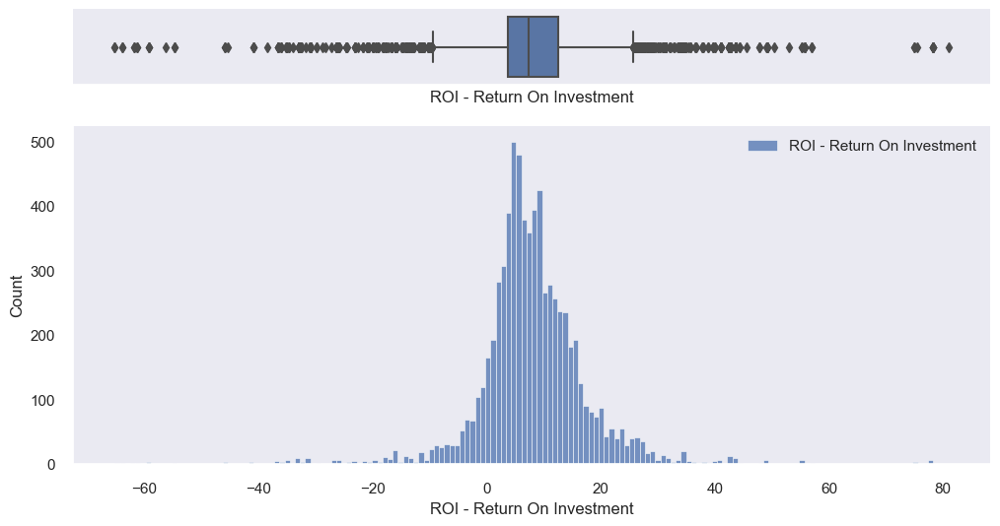

In [1215]:
# Box Plot 8: ROI - Return On Investment - Outliers Tratados.
import warnings
warnings.filterwarnings("ignore")

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(12,6), gridspec_kw={"height_ratios": (.2, .9)})
sns.boxplot(df['ROI - Return On Investment'], ax=ax_box, orient="h") 
sns.histplot(df['ROI - Return On Investment'], ax=ax_hist, label='ROI - Return On Investment')
ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)
ax_hist.legend()

In [1216]:
df.drop(columns='ROI - Return On Investment Outliers', inplace=True)

In [1217]:
# Variable Dependiente: 'Free Cash Flow Per Share'
# Identificamos los valores atípicos de acuerdo al modelo Z-Score (Estandarización). 
# Estandarizamos los valores de la variable, para poder comparar todos los valores bajo una misma regla, haciendo más fácil la identificación de valores atípicos.

df['Free Cash Flow Per Share Z'] = (df['Free Cash Flow Per Share'] - df['Free Cash Flow Per Share'].mean())/df['Free Cash Flow Per Share'].std()
df['Free Cash Flow Per Share Outliers'] = 0
df.loc[(df['Free Cash Flow Per Share Z']>3)|(df['Free Cash Flow Per Share Z']<-3) , 'Free Cash Flow Per Share Outliers'] = 1
df[['Free Cash Flow Per Share', 'Free Cash Flow Per Share Z','Free Cash Flow Per Share Outliers']]

,Free Cash Flow Per Share,Free Cash Flow Per Share Z,Free Cash Flow Per Share Outliers
33,0.66,0.07,0
8,0.94,0.11,0
3,-0.90,-0.14,0
16,2.99,0.39,0
29,3.96,0.52,0
...,...,...,...
7299,-0.62,-0.10,0
7434,-0.80,-0.12,0
7506,14.44,1.94,0
7585,0.43,0.04,0


In [1218]:
df['Free Cash Flow Per Share Outliers'].value_counts()

Free Cash Flow Per Share Outliers
0    7225
1      60
Name: count, dtype: int64

In [1219]:
print(df.loc[df['Free Cash Flow Per Share Outliers']== 1, 'Free Cash Flow Per Share'])

342     -25.69
242      91.37
343     -25.69
288      23.06
622     -23.37
623     -23.37
923     -67.11
625     -23.37
626     -23.37
627     -23.37
848     -61.07
924     -67.11
1048    -60.90
1212     44.92
1049    -60.90
846     -61.07
849     -61.07
847      37.87
1767     42.91
1768     42.91
2296   -130.67
2034     37.87
2299   -130.67
2258   -130.67
2051     37.87
2297   -130.67
2300   -130.67
2035     37.87
2259   -130.67
2298   -130.67
3873     93.68
4030    107.74
4092     50.76
4094    107.74
4031    107.74
4096    107.74
4032    107.74
4033    107.74
3711    -32.10
3712    -32.10
4095    107.74
5670    -32.10
5874   -123.57
5250    -25.18
5875   -123.57
5671    -32.10
5744     32.50
6043     32.92
6112     32.92
5672    -32.10
6044     32.92
5674    -32.10
6045     32.92
6113     32.92
7352     92.62
7448    -47.24
7354     92.62
7446    -47.24
7447    -47.24
7353     92.62
Name: Free Cash Flow Per Share, dtype: float64


In [1220]:
print(df.loc[df['Free Cash Flow Per Share Outliers'] == 1, 'Free Cash Flow Per Share'].max())
print(df.loc[df['Free Cash Flow Per Share Outliers'] == 1, 'Free Cash Flow Per Share'].min())

107.7377
-130.6658


In [1221]:
# Creamos un diccionario con la agrupación de las categorías 'Rating','Sector','Year'.
mapping_dict_4 = df.set_index(['Rating','Sector','Year'])['Free Cash Flow Per Share'].to_dict()

In [1222]:
# Valores promedio por agrupación:
average_fcf_s_dict = df.groupby(['Rating','Sector','Year'])['Free Cash Flow Per Share'].mean().to_dict()

In [1223]:
# Utilizamos una función para reemplazar los valores promedios de las categorías, siempre y cuando el valor sea un Outlier.
def replace_with_average(row, average_fcf_s_dict):
    if row['Free Cash Flow Per Share Outliers'] == 1:
        return average_cr_dict.get((row['Rating'], row['Sector'], row['Year']), row['Free Cash Flow Per Share'])
    return row['Free Cash Flow Per Share']

# Reemplazamos el Precio por el Promedio en la misma columna.
df['Free Cash Flow Per Share'] = df.apply(replace_with_average, axis=1, args=(average_fcf_s_dict,))

df_fcf_s_updated = df[df['Free Cash Flow Per Share Outliers'] == 1]

In [1224]:
df_fcf_s_updated.groupby(['Rating','Sector','Year'])['Free Cash Flow Per Share'].describe().round(1)

count  mean  std  min  25%  50%  \
Rating                 Sector           Year                                    
Altamente Especulativa Energy           2012   1.00  1.70  NaN 1.70 1.70 1.70   
                                        2014   1.00  1.50  NaN 1.50 1.50 1.50   
                                        2015   2.00  1.10 0.00 1.10 1.10 1.10   
                                        2016   1.00  1.10  NaN 1.10 1.10 1.10   
                       Other            2015   1.00  3.70  NaN 3.70 3.70 3.70   
Especulativa           Energy           2011   1.00  2.30  NaN 2.30 2.30 2.30   
                                        2015   2.00  1.30 0.00 1.30 1.30 1.30   
                                        2016   1.00  1.50  NaN 1.50 1.50 1.50   
Media                  Energy           2014   1.00  1.10  NaN 1.10 1.10 1.10   
Media Inferior         Energy           2011   1.00  1.30  NaN 1.30 1.30 1.30   
                                        2012   2.00  1.20 0.00 1.20 1.20 1.20   
                                        2013   6.00  1.60 0.00 1.60 1.60 1.60   
                                        2014   6.00  1.80 0.00 1.80 1.80 1.80   
                                        2015   2.00  1.50 0.00 1.50 1.50 1.50   
                                        2016   2.00  1.90 0.00 1.90 1.90 1.90   
                       Other            2011   2.00  1.60 0.00 1.60 1.60 1.60   
                                        2014   1.00  2.50  NaN 2.50 2.50 2.50   
                                        2015   1.00  2.10  NaN 2.10 2.10 2.10   
Media Superior         Energy           2013   1.00  1.40  NaN 1.40 1.40 1.40   
                                        2015   1.00  2.10  NaN 2.10 2.10 2.10   
Riesgo Sustancial      Consumer Staples 2012   1.00  2.00  NaN 2.00 2.00 2.00   
                       Energy           2012   6.00  1.20 0.00 1.20 1.20 1.20   
                                        2013   2.00  1.20 0.00 1.20 1.20 1.20   
                                        2016   2.00  1.10 0.00 1.10 1.10 1.10   
                       Other            2012   4.00  5.40 0.00 5.40 5.40 5.40   
                                        2013   3.00  9.60 0.00 9.60 9.60 9.60   
                                        2014   2.00  4.50 0.00 4.50 4.50 4.50   
                                        2015   4.00  3.60 0.00 3.60 3.60 3.60   

                                              75%  max  
Rating                 Sector           Year            
Altamente Especulativa Energy           2012 1.70 1.70  
                                        2014 1.50 1.50  
                                        2015 1.10 1.10  
                                        2016 1.10 1.10  
                       Other            2015 3.70 3.70  
Especulativa           Energy           2011 2.30 2.30  
                                        2015 1.30 1.30  
                                        2016 1.50 1.50  
Media                  Energy           2014 1.10 1.10  
Media Inferior         Energy           2011 1.30 1.30  
                                        2012 1.20 1.20  
                                        2013 1.60 1.60  
                                        2014 1.80 1.80  
                                        2015 1.50 1.50  
                                        2016 1.90 1.90  
                       Other            2011 1.60 1.60  
                                        2014 2.50 2.50  
                                        2015 2.10 2.10  
Media Superior         Energy           2013 1.40 1.40  
                                        2015 2.10 2.10  
Riesgo Sustancial      Consumer Staples 2012 2.00 2.00  
                       Energy           2012 1.20 1.20  
                                        2013 1.20 1.20  
                                        2016 1.10 1.10  
                       Other            2012 5.40 5.40  
                                        2013 9.60 9.60  
                   

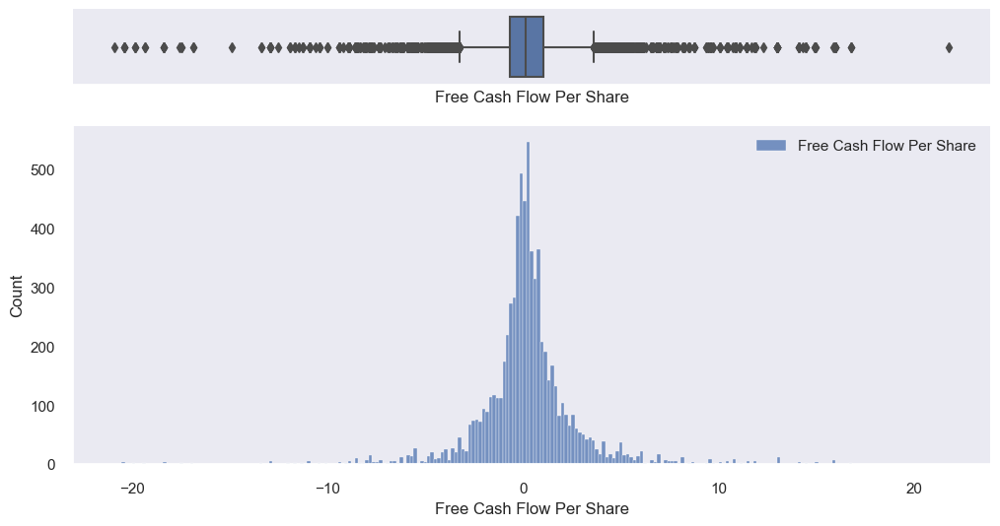

In [1225]:
# Box Plot 9: Free Cash Flow Per Share - Outliers Tratados.
import warnings
warnings.filterwarnings("ignore")

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(12,6), gridspec_kw={"height_ratios": (.2, .9)})
sns.boxplot(df['Free Cash Flow Per Share'], ax=ax_box, orient="h") 
sns.histplot(df['Free Cash Flow Per Share'], ax=ax_hist, label='Free Cash Flow Per Share')
ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)
ax_hist.legend()

In [1226]:
df.drop(columns= ['Free Cash Flow Per Share Outliers', 'Current Ratio STD', 'ROI - Return On Investment STD', 'Long-term Debt / Capital STD', 
                  'Free Cash Flow Per Share STD', 'Current Ratio Z', 'ROI - Return On Investment Z', 'Free Cash Flow Per Share Z'], inplace=True)

5.5.5 Identificación y Tratamiento de Valores Atípicos (Outliers) - Multivariado - Isolation Forest

In [1227]:
df_if = df[['Binary Rating','Current Ratio', 'Long-term Debt / Capital',
            'ROI - Return On Investment', 'Free Cash Flow Per Share', 
            'Rating_OE','Sector_LE']]

In [1228]:
# Isolation Forest
# Para tratamiento NO Supervisado de Outliers Multivariado, posterior al Manual Univariado.
# Se recomienda un nivel de contaminación de un 10% (proporción esperada de Anomalías).
# 1: Valores Normales, -1: Atípicos.
from sklearn.ensemble import IsolationForest

isolation_forest = IsolationForest(n_estimators=500, contamination=0.10)

isolation_forest.fit(df_if)

predictions = isolation_forest.predict(df_if)

predictions

array([ 1,  1,  1, ..., -1,  1,  1])

In [1229]:
df_if['Predicciones'] = predictions
df['Predicciones'] = predictions

In [1230]:
df[df['Predicciones']==-1][['Binary Rating', 'Rating_OE', 'Sector_LE',
                           'Current Ratio', 'Long-term Debt / Capital', 
                           'ROI - Return On Investment', 
                           'Free Cash Flow Per Share']]

,Binary Rating,Rating_OE,Sector_LE,Current Ratio,Long-term Debt / Capital,ROI - Return On Investment,Free Cash Flow Per Share
25,1,7,7,2.13,0.10,36.70,0.71
24,0,2,7,7.92,0.18,11.58,0.53
101,0,1,7,3.07,0.90,-20.82,-2.83
222,0,1,1,1.24,44.06,1.39,6.98
139,0,1,7,1.34,5.43,2.21,-0.18
...,...,...,...,...,...,...,...
7027,0,2,7,3.23,0.08,75.48,-1.49
7098,0,2,3,0.51,0.21,23.54,5.77
7310,0,2,9,2.33,0.30,8.78,14.92
7482,1,5,3,1.37,0.22,-26.10,-5.25


Al verificar el Análisis Multivariado de Outliers, nos damos cuenta que muchas clasificaciones Binarias y Ordinales No coinciden con los ratios Financieros estipulados.

In [1231]:
df['Binary_Rating_1'] = -1
df['Rating_OE_1'] = -1

#Filtramos el Data Frame por Tipo de Predicción.
df_neg= df[df['Predicciones'] == -1]
df_pos = df[df['Predicciones'] == 1]

# Columnas a Comparar (Comparar el Valor más cercano No Outlier, para reemplazar el Outlier)
columns_to_compare = ['Current Ratio', 'Long-term Debt / Capital', 'ROI - Return On Investment', 'Free Cash Flow Per Share', 'Sector_LE']

# Distancia Euclideana entre los Registros
from sklearn.metrics.pairwise import euclidean_distances
distances = euclidean_distances(df_neg[columns_to_compare], df_pos[columns_to_compare])

# Indices Más Cercanos
most_similar_indices = distances.argmin(axis=1)

# Reemplazar los valores de las columnas comparadas en df_neg con los valores correspondientes de df_pos (más cercanos).
for i, idx in enumerate(most_similar_indices):
    df_neg.iloc[i, df_neg.columns.get_loc('Current Ratio')] = df_pos.iloc[idx]['Current Ratio']
    df_neg.iloc[i, df_neg.columns.get_loc('Long-term Debt / Capital')] = df_pos.iloc[idx]['Long-term Debt / Capital']
    df_neg.iloc[i, df_neg.columns.get_loc('ROI - Return On Investment')] = df_pos.iloc[idx]['ROI - Return On Investment']
    df_neg.iloc[i, df_neg.columns.get_loc('Free Cash Flow Per Share')] = df_pos.iloc[idx]['Free Cash Flow Per Share']
    df_neg.iloc[i, df_neg.columns.get_loc('Sector_LE')] = df_pos.iloc[idx]['Sector_LE']

# Añadir las columnas 'Binary Rating' y 'Rating_OE' con los valores de 'Current Ratio', 'Long-term Debt / Capital', 'ROI - Return On Investment', 'Free Cash Flow Per Share', 'Sector_LE' más similares.
df.loc[df['Predicciones'] == -1, 'Binary_Rating_1'] = df_pos.iloc[most_similar_indices]['Binary Rating'].values
df.loc[df['Predicciones'] == -1, 'Rating_OE_1'] = df_pos.iloc[most_similar_indices]['Rating_OE'].values

In [1232]:
df[df['Predicciones']==-1][['Binary Rating', 'Rating_OE', 
                           'Binary_Rating_1', 'Rating_OE_1', 'Sector_LE',
                           'Current Ratio', 'Long-term Debt / Capital', 
                           'ROI - Return On Investment', 
                           'Free Cash Flow Per Share']]

,Binary Rating,Rating_OE,Binary_Rating_1,Rating_OE_1,Sector_LE,Current Ratio,Long-term Debt / Capital,ROI - Return On Investment,Free Cash Flow Per Share
25,1,7,1,5,7,2.13,0.10,36.70,0.71
24,0,2,1,4,7,7.92,0.18,11.58,0.53
101,0,1,0,2,7,3.07,0.90,-20.82,-2.83
222,0,1,0,2,1,1.24,44.06,1.39,6.98
139,0,1,0,1,7,1.34,5.43,2.21,-0.18
...,...,...,...,...,...,...,...,...,...
7027,0,2,1,5,7,3.23,0.08,75.48,-1.49
7098,0,2,1,7,3,0.51,0.21,23.54,5.77
7310,0,2,1,5,9,2.33,0.30,8.78,14.92
7482,1,5,1,6,3,1.37,0.22,-26.10,-5.25


In [1233]:
print((df[df['Predicciones']==-1].groupby(['Binary Rating', 'Binary_Rating_1']).size()).round(0))

Binary Rating  Binary_Rating_1
0              0                  295
               1                  246
1              0                   45
               1                  143
dtype: int64


In [1234]:
# Equilibrio Muestra Inicial.
((df.value_counts('Binary Rating')/len(df))*100).round(1)

Binary Rating
1   65.20
0   34.80
Name: count, dtype: float64

El método de Isolation Forest, luego de un acusioso Análisis Univariado, para variables continuas ('Current Ratio', 'Long-term Debt / Capital', 'ROI - Return On Investment', 'Free Cash Flow Per Share'), detecta ciertos valores atípicos de clasificaciones para las variables discretas 'Binary Rating' (Target) y 'Rating'.

En general NO se acostumbra a tratar la Variable Objetivo como un Outlier, ya que su modificación podría afectar el sentido del modelo.

Por otro lado, el reemplazo de 'Binary Rating' por 'Binary_Rating_1', podría desequilibrar aún más la muestra, ya que el porcentaje más grande de cambios ocurriría reemplazando 0 por 1.

In [1235]:
df.drop(columns=['Binary_Rating_1', 'Rating_OE_1', 'Predicciones'], inplace=True)

In [1236]:
# Reemplazar los valores de 'Binary Rating' y 'Rating_OE' para Outliers con los valores más cercanos NO Atípcos.
# df.loc[df['Predicciones'] == -1, 'Binary Rating'] = df['Binary_Rating_1']
# df.loc[df['Predicciones'] == -1, 'Rating_OE'] = df['Rating_OE_1']

In [1237]:
# Verificamos la Imputación de los Datos,
# df[df['Predicciones']==-1][['Binary Rating', 'Rating_OE', 
#                           'Binary_Rating_1', 'Rating_OE_1', 'Sector_LE',
#                           'Current Ratio', 'Long-term Debt / Capital', 
#                           'ROI - Return On Investment', 
#                           'Free Cash Flow Per Share']]

GRÁFICOS DE DISPERSIÓN ENTRE VARIABLES

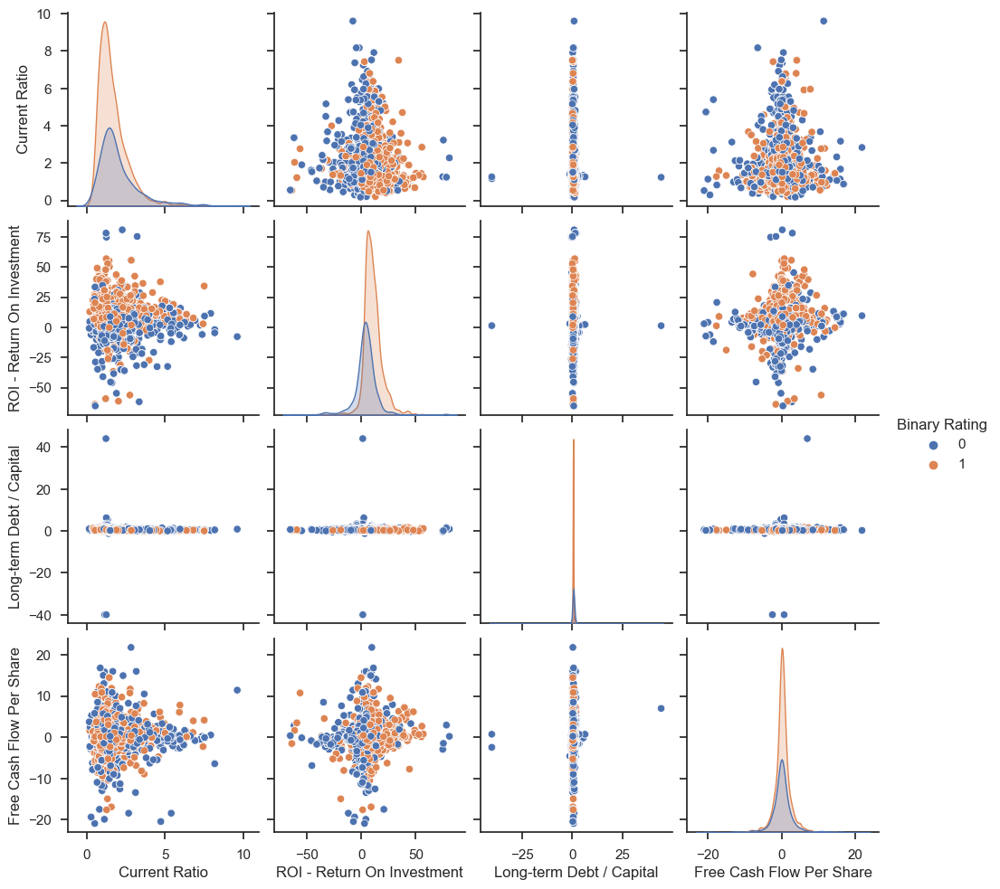

In [1238]:
df1 = df[['Binary Rating', 'Current Ratio', 'ROI - Return On Investment','Long-term Debt / Capital', 'Free Cash Flow Per Share']]
sns.set_theme(style="ticks")

sns.pairplot(df1, hue='Binary Rating')

Conclusiones Analíticas Visiblemente Evidentes.
1. Relación 'Current Ratio' vs 'ROI - Return On Investment': Los Valores de ROI > 0 suelen identificar Empresas con Calificación de Inversión, mientras que Los Valores de ROI < 0 suelen identificar Empresas con Calificación de Desinversión, independiente del Valor de Current Ratio.
2. 'ROI - Return On Investment' vs 'Long-term Debt / Capital': Los Valores de ROI > 0 para Long-term Debt / Capital > 0, suelen identificar Empresas con Calificación de Inversión, mientras que Los Valores de ROI < 0 suelen identificar Empresas con Calificación de Desinversión, independiente del Valor de Long-term Debt / Capital.
3. 'ROI - Return On Investment' vs 'Free Cash Flow Per Share': Los Valores de ROI > 0 suelen identificar Empresas con Calificación de Inversión, mientras que Los Valores de ROI < 0 suelen identificar Empresas con Calificación de Desinversión, independiente del Valor de Free Cash Flow Per Share.
4. Relación 'Free Cash Flow Per Share' vs 'Long-term Debt / Capital': En general, la mayoría de las empresas suelen tener Long-term Debt / Capital > 0 independiente del valor de Free Cash Flow Per Share.

Conclusiones Conceptuales.
1. Los Ratios de Rentabilidad sobre la Inversión, generalmente permiten identificar si es recomendable o no invertir en una empresa, independiente del valor de otras variables como Ratios de Liquidez, Ratios de Endeudamiento y Ratios de Flujo de Caja.
2. En General, las empresas suelen tener Ratios de Endeudamiento mayores a Cero, por lo cual, destinan parte de sus recursos como pasivos y su nivel de endeudamiento, no guarda relación con la liquidez que generan sus acciones. En otras palabras, las empresas que generan mayor liquidez, no necesariamente la utilizan para paagr sus deudas.

GRÁFICOS DE DENSIDAD POR INDUSTRIA.

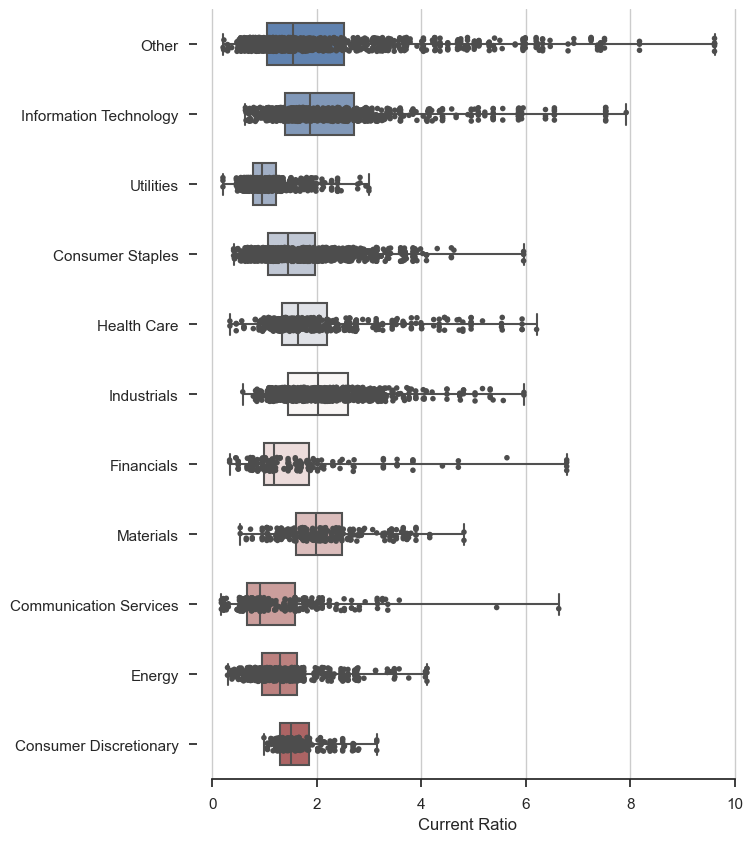

In [1239]:
sns.set_theme(style="ticks")

f, ax = plt.subplots(figsize=(7, 10))
ax.set_xscale("linear")

df2 = df[['Sector', 'Current Ratio']]

# Plot the orbital period with horizontal boxes
sns.boxplot(
    x="Current Ratio", y="Sector", data=df2,
    whis=[0, 100], width=.6, palette="vlag"
)

# Add in points to show each observation
sns.stripplot(x="Current Ratio", y="Sector", data=df2, size=4, color=".3")

# Tweak the visual presentation
ax.xaxis.grid(True)
ax.set(ylabel="")
sns.despine(trim=True, left=True)

Conclusiones:
1. Las Empresas de los Rubros de Información & Tecnología, Industrial, Fabricación de Materiales y Otros, poseen altos niveles de Liquidez, en comparación a los otros rubros, con una alta Variabilidad y frecuencia de registro dentro de los Rangos Intercuartílicos .
2. Las Empresas de los Rubros mencionados previamente, podrían ser una buena oportunidad de Inversión, siempre y cuando sus ratios de rentabilidad sean estables en el tiempo y se privilegie la Entrega de Dividendos a sus Accionistas, por sobre la Reinversión o Pago de Deuda.

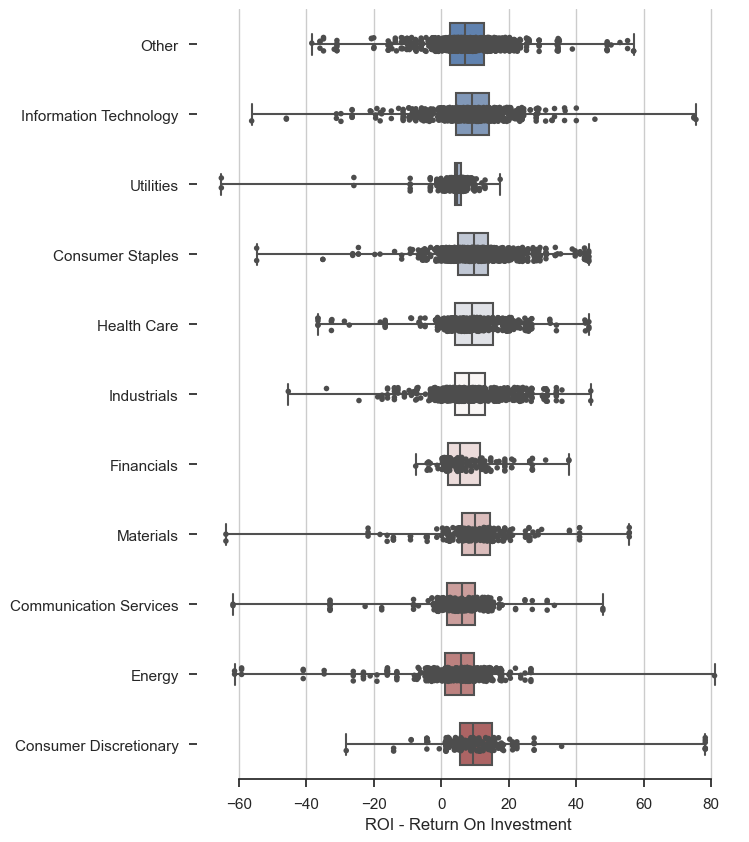

In [1240]:
sns.set_theme(style="ticks")

f, ax = plt.subplots(figsize=(7, 10))
ax.set_xscale("linear")

df3 = df[['Sector', 'ROI - Return On Investment']]

# Plot the orbital period with horizontal boxes
sns.boxplot(
    x='ROI - Return On Investment', y="Sector", data=df3,
    whis=[0, 100], width=.6, palette="vlag"
)

# Add in points to show each observation
sns.stripplot(x='ROI - Return On Investment', y="Sector", data=df3, size=4, color=".3")

# Tweak the visual presentation
ax.xaxis.grid(True)
ax.set(ylabel="")
sns.despine(trim=True, left=True)

Conclusiones:
1. Las Empresas de los Rubros de Información & Tecnología, Productos Básicos, Salud, Fabricación de Materiales y Bienes Durables poseen altos niveles de Rentabilidad sobre la Inversión, en comparación a los otros rubros, con una alta Variabilidad y frecuencia de registro dentro de los Rangos Intercuartílicos. 
2. Las Empresas de los rubros antes mencionados podrían ser una buena oportunidad de Inversión, siempre y cuando la empresa destine constantemente parte de su liquidez en reinversión para proyectos futuros.

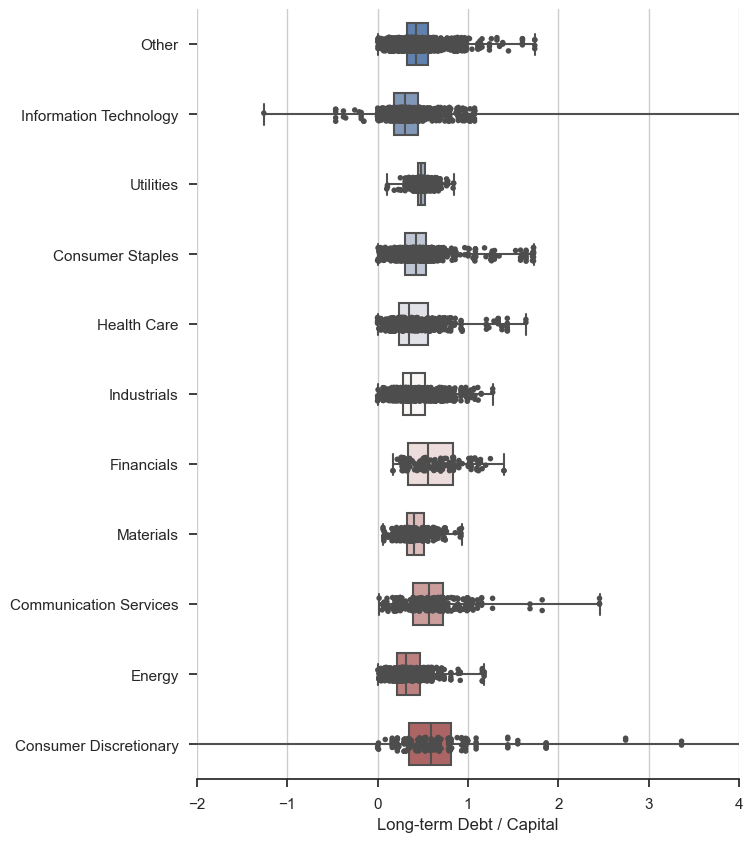

In [1241]:
sns.set_theme(style="ticks")

f, ax = plt.subplots(figsize=(7, 10))
ax.set_xscale("linear")

df4 = df[['Sector', 'Long-term Debt / Capital']]

# Plot the orbital period with horizontal boxes
sns.boxplot(
    x='Long-term Debt / Capital', y="Sector", data=df4,
    whis=[0, 100], width=.6, palette="vlag"
)

# Add in points to show each observation
sns.stripplot(x='Long-term Debt / Capital', y="Sector", data=df4, size=4, color=".3")

# Tweak the visual presentation
ax.xaxis.grid(True)
ax.set(ylabel="")
ax.set_xlim(-2,4)
sns.despine(trim=True, left=True)

Conclusiones:
1. Las Empresas de los Rubros de Bienes Durables, Servicios de Telecomunicaciones y Financieros poseen altos niveles de Endeudamiento lo cual hace sentido, de acuerdo al modelo de Negocio del Rubro al cual pertencen.
2. Se podría Invertir en Empresas de otros Rubros, diferentes a los mencionados, siempre y cuando sus niveles de endeudamiento no sean muy grandes (> 1.5) o muy pequeños (< -0.5), no disponiendo recursos propios para endeudamiento. 

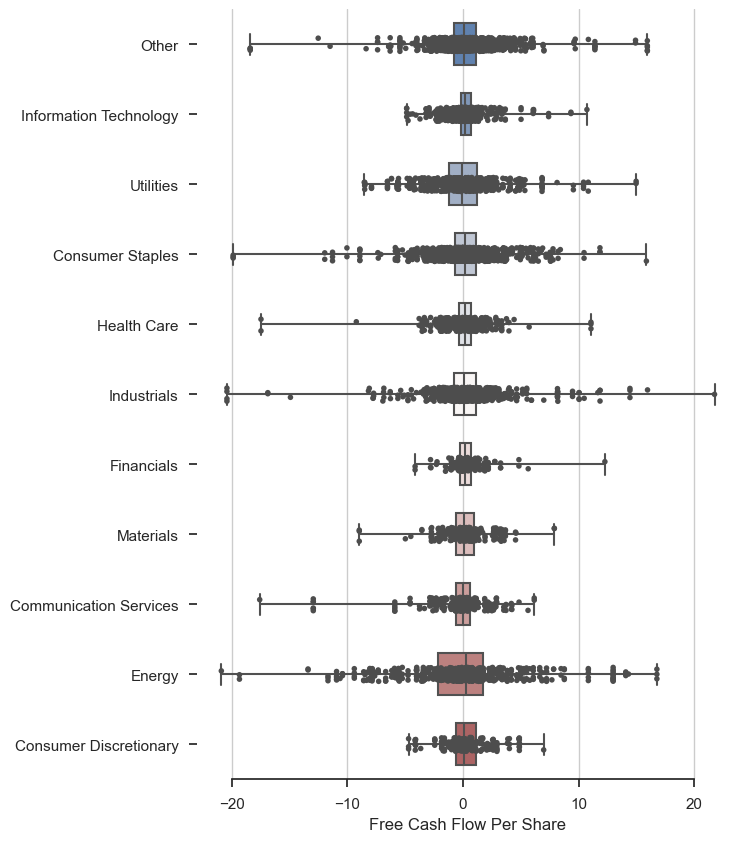

In [1242]:
sns.set_theme(style="ticks")

f, ax = plt.subplots(figsize=(7, 10))
ax.set_xscale("linear")

df5 = df[['Sector', 'Free Cash Flow Per Share']]

# Plot the orbital period with horizontal boxes
sns.boxplot(
    x='Free Cash Flow Per Share', y="Sector", data=df5,
    whis=[0, 100], width=.6, palette="vlag"
)

# Add in points to show each observation
sns.stripplot(x='Free Cash Flow Per Share', y="Sector", data=df5, size=4, color=".3")

# Tweak the visual presentation
ax.xaxis.grid(True)
ax.set(ylabel="")
sns.despine(trim=True, left=True)

Conclusiones:
1. En general, los diferentes Rubros presentan ratios de Liquidez similares en órdenes de magnitud, de acuerdo a los datos proporcionados por la muestra.
2. Se podría invertir en cualquier empresa con un buen flujo de caja, siempre y cuando esta tenga una Rentabilidad sobre la Inversión Alta y Ratios de Endeudamiento aceptables para la Industria a la cual pertenece. 

GRÁFICOS DE ESTACIONALIDAD POR PERIODO E INDUSTRIA.

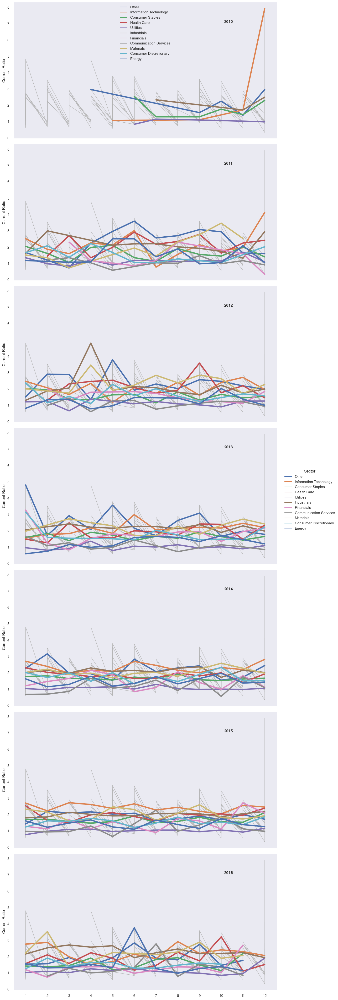

In [1243]:
# Grafico Estacionalidad 1: 'Current Ratio'
sns.set_theme(style="dark")
df_avg = df.groupby(['Year', 'Month', 'Sector'])['Current Ratio'].mean().reset_index()

# Grafico Series de Tiempo por Año.
g = sns.relplot(
    data=df_avg,
    x="Month", y="Current Ratio", col="Year", hue="Sector",
    kind="line", palette="deep", linewidth=4, zorder=5,
    col_wrap=1, height=6, aspect=2,
)

# Iteración sobre subgráficos.
for year, ax in g.axes_dict.items():

    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")
    ax.set_xticks(np.arange(1, 13))

    # Graficar cada Serie de Tiempo en el Fondo.
    sns.lineplot(
        data=df_avg, x="Month", y="Current Ratio", units="Year",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

# Titulo y Etiquetas.
g.set_titles("")
g.set_axis_labels("", "Current Ratio")
g.tight_layout()

Estacionalidad Liquidez
1. 2010: Aumento Exponencial rubro Tecnologías de la Información (Noviembre Diciembre).
2. 2011: Crecimiento Sostenido rubro Otros (Marzo a Junio) y rubro Materiales (Julio a Octubre), Aumento Exponencial rubro Tecnologías de la Información (Noviembre Diciembre).
3. 2012: Peaks Rubros Industrial, Otros y Medicina en los meses de Abril, Mayo y Septiembre Respectivamente.
4. 2013: Aumento Exponencial Rurbo otros (Diciembre 2012 a Enero 2013), peeaks en Agosto y Septiembre del mismo Rubro.
5. 2014: Sin Mayores Desviaciones / Estacionalidad.
6. 2015: Sin Mayores Desviaciones / Estacionalidad.
7. 2016: Peaks Rubros de Materiales, Otros y Medicina en los meses de Febrero, Junio y Octubre respectivamente.

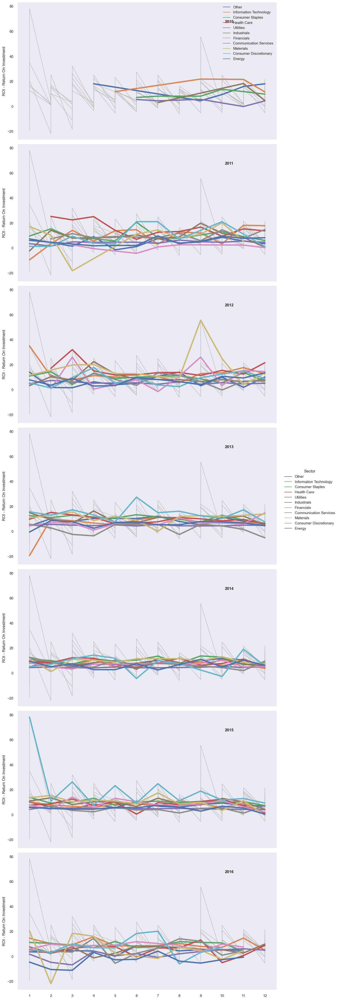

In [1244]:
# Grafico Estacionalidad 2: 'ROI - Return On Investment'
sns.set_theme(style="dark")
df_avg_2 = df.groupby(['Year', 'Month', 'Sector'])['ROI - Return On Investment'].mean().reset_index()

# Grafico Series de Tiempo por Año.
g = sns.relplot(
    data=df_avg_2,
    x="Month", y="ROI - Return On Investment", col="Year", hue="Sector",
    kind="line", palette="deep", linewidth=4, zorder=5,
    col_wrap=1, height=6, aspect=2,
)

# Iteración sobre subgráficos.
for year, ax in g.axes_dict.items():

    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")
    ax.set_xticks(np.arange(1, 13))

    # Graficar cada Serie de Tiempo en el Fondo.
    sns.lineplot(
        data=df_avg_2, x="Month", y="ROI - Return On Investment", units="Year",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

# Titulo y Etiquetas.
g.set_titles("")
g.set_axis_labels("", "ROI - Return On Investment")
g.tight_layout()

Estacionalidad Rentabilidad sobre la Inversión.
1. 2010: Sin Mayores Desviaciones / Estacionalidad.
2. 2011: Valores altos para Rubro de Medicina entre Febrero y Abril. Caída grave rubro Materiales entre Febrero y Marzo, posteriormente recuperado Entre Marzo y Julio. Buen incremento Rubro Tecnologías de la Información Entre Enero y Marzo.
3. 2012: Peak Muy Alto Rubro Materiales entre Agosto y Septiembre con posterior caída. Peaks de Rubro Financiero en Marzo y Septiembre. Peak Rubro Medicina en Marzo, con valores estables para el resto del año.
4. 2013: Aumento Exponencial Rubro Tecnologías de la Información entre Enero y Febrero. Peak Bienes Durables mes de Julio.
5. 2014: Sin Mayores Desviaciones / Estacionalidad.
6. 2015: Fuerte caída Rubro Bienes Durables entre Enero y Febrero, consecuentes Peaks menores en Marzo, Mayo, Julio Septiembre. 
7. 2016: Fuerte Caída Rubro Materiales entre Enero y Febrero, recuperada posteriormente. 

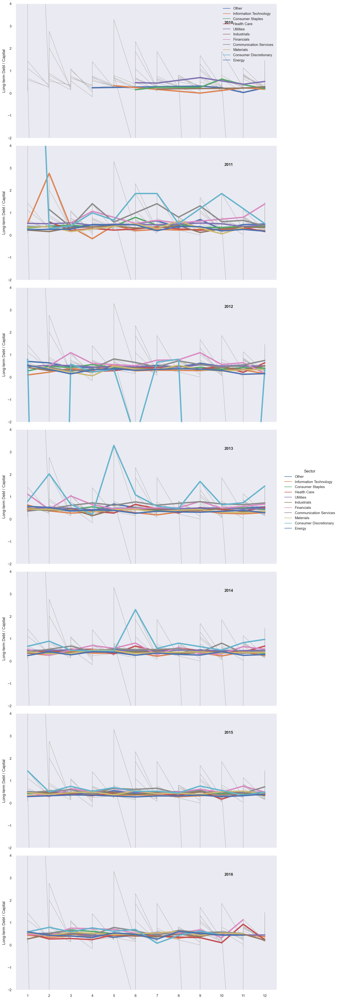

In [1245]:
# Grafico Estacionalidad 3: 'Long-term Debt / Capital'
sns.set_theme(style="dark")
df_avg_3 = df.groupby(['Year', 'Month', 'Sector'])['Long-term Debt / Capital'].mean().reset_index()

# Grafico Series de Tiempo por Año.
g = sns.relplot(
    data=df_avg_3,
    x="Month", y='Long-term Debt / Capital', col="Year", hue="Sector",
    kind="line", palette="deep", linewidth=4, zorder=5,
    col_wrap=1, height=6, aspect=2,
)

# Iteración sobre subgráficos.
for year, ax in g.axes_dict.items():

    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")
    ax.set_xticks(np.arange(1, 13))
    ax.set_ylim(-2,4)

    # Graficar cada Serie de Tiempo en el Fondo.
    sns.lineplot(
        data=df_avg_3, x="Month", y='Long-term Debt / Capital', units="Year",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

# Titulo y Etiquetas.
g.set_titles("")
g.set_axis_labels("", 'Long-term Debt / Capital')
g.tight_layout()

Estacionalidad Deuda sobre Capital.
1. 2010: Sin Mayores Desviaciones / Estacionalidad.
2. 2011: Aumento Exponencial Rubro Bienes Durables entre Enero y Febrero, con consecuentes Peaks en los Meses de Junio, Julio, Octubre.
3. 2012: Fuerte Caída Rubro Bienes Durables entre Enero y Febrero, con posterior recuperación y estabilidad entre Marzo y Agosto, para volver a caer y recuperarse entre Septiembre y Diciembre.
4. 2013: Caídas significativas Rubro Bienes Durables en los Meses de Febrero y Mayo, con posterior recuperación y estabilidad.
5. 2014: Caída significativa Rubro Bienes Durables entre Mayo y Junio.
6. 2015: Sin Mayores Desviaciones / Estacionalidad.
7. 2016: Sin Mayores Desviaciones / Estacionalidad.

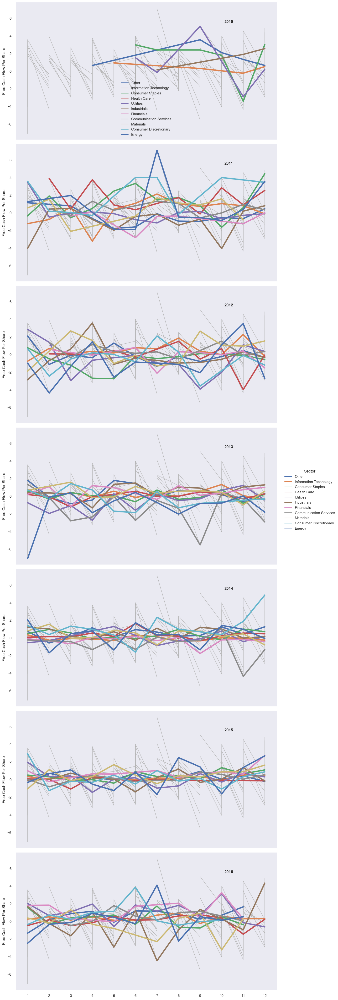

In [1246]:
# Grafico Estacionalidad 4: 'Free Cash Flow Per Share'
sns.set_theme(style="dark")
df_avg_4 = df.groupby(['Year', 'Month', 'Sector'])['Free Cash Flow Per Share'].mean().reset_index()

# Grafico Series de Tiempo por Año.
g = sns.relplot(
    data=df_avg_4,
    x="Month", y='Free Cash Flow Per Share', col="Year", hue="Sector",
    kind="line", palette="deep", linewidth=4, zorder=5,
    col_wrap=1, height=6, aspect=2,
)

# Iteración sobre subgráficos.
for year, ax in g.axes_dict.items():

    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")
    ax.set_xticks(np.arange(1, 13))

    # Graficar cada Serie de Tiempo en el Fondo.
    sns.lineplot(
        data=df_avg_4, x="Month", y='Free Cash Flow Per Share', units="Year",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

# Titulo y Etiquetas.
g.set_titles("")
g.set_axis_labels("", 'Free Cash Flow Per Share')
g.tight_layout()

Estacionalidad Flujo de Caja por Acción.
1. Alta Variabilidad y Dispersión de los Datos a lo largo de todos los periodos y rubros anzalizados. No es posible obtener conclusiones al respecto.

7. Feature Engineering - Creación de Nuevas Variables

7.1 Reduccción de Dimensionalidad.
# MCA - Analisis de correspondencias Multiples (PCA para variables Categóricas)
# https://maxhalford.github.io/prince/mca/

MCA se utiliza principalmente para analizar variables categóricas, mientras que PCA se utiliza principalmente para analizar variables continuas

MCA se basa en tablas de contingencia y en la distancia chi-cuadrado, mientras que PCA se basa en la matriz de covarianza o de correlación

MCA no impone restricciones en las categorías de las variables, mientras que PCA asume que las variables son linealmente independientes

In [1247]:
# PCA - Principal Component Analysis
# Reducimos a 3 Variables.
import prince
from prince import PCA

variables = df[[
    'Current Ratio', 'ROI - Return On Investment',
    'Long-term Debt / Capital', 'Free Cash Flow Per Share']]

pca = prince.PCA(
    n_components=3,
    n_iter=64,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=69
)
pca = pca.fit(variables)

In [1248]:
# Detalle Variables.
pca_results = pca.transform(variables)
pca_results

component,0,1,2
33,0.37,-1.16,0.35
8,0.58,0.13,-0.52
3,-0.17,0.75,-0.60
16,0.33,-0.80,0.66
29,1.02,0.27,-0.06
...,...,...,...
7299,-0.38,0.12,0.08
7434,0.55,-1.29,-0.23
7506,2.86,-0.96,1.58
7585,-0.65,-0.51,0.77


In [1249]:
# Eigen Values - La Importancia de un Componente tiene que ver con la proporción de Inercia del Dataset que Explica.
pca.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,1.095,27.37%,27.37%
1,1.015,25.38%,52.76%
2,0.988,24.70%,77.45%


Al analizar la importancia de los componentes, vemos que el primer componente explica el 27%, los primeros 2 componentes explican el 53% y los tres componentes en conjunto explican el 77% de la inercia del Dataset, respectivamente.

In [1250]:
pca.scree_plot()

alt.Chart(...)

In [1251]:
pca.column_contributions_.head(10).style.format('{:.0%}')

component,0,1,2
variable,,,
Current Ratio,9%,37%,46%
ROI - Return On Investment,39%,13%,10%
Long-term Debt / Capital,10%,43%,33%
Free Cash Flow Per Share,42%,7%,10%


Considerando que Current Ratio es un ratio de Liquiez, ROI es un Ratio de Rentabilidad, Long Term Debt es un Ratio de Deuda y Free Cash Flow Per Share es un Ratio de Flujo de Caja.

1. Los 3 Componentes generados explican en un 92% la Varianza de Current Ratio.
2. Los 3 Componentes generados explican en un 62% la Varianza de ROI.
3. Los 3 Componentes generados explican en un 86% la Varianza de Long Term Debt.
4. Los 3 Componentes generados explican en un 59% la Varianza de Free Cash Flow Per Share.

Analizando la información, se llega a la conclusión de que NO es recomendable reducir la dimensionalidad del Data Frame a 3 variables, por las siguientes razones:

Si bien los 3 componentes explican el 77% de la varianza total, conservando la mayor parte de la información original en estas 3 variables, individualmente la variables ROI y Free Cash Flow Per Share no están bien explicadas por las nuevas variables creadas (reducidas), perdiendo información valiosa de Rentabilidad y Flujo de Caja, lo cual diminuirá la importancia de las variables posteriormente al evaluar y desplegar el modelo.

In [1252]:
# Agregamos nuevas variables al DF.
# df_concat = pd.concat([df['Binary Rating'], df['Rating_OE'], df['Sector_LE'],pca_results], axis=1)
# df_concat =  df_concat.rename(columns={0:'componente1', 1:'componente2', 2:'componente3'})
# df_final = df_concat

7. Selección del Algoritmo

https://scikit-learn.org/1.3/tutorial/machine_learning_map/index.html

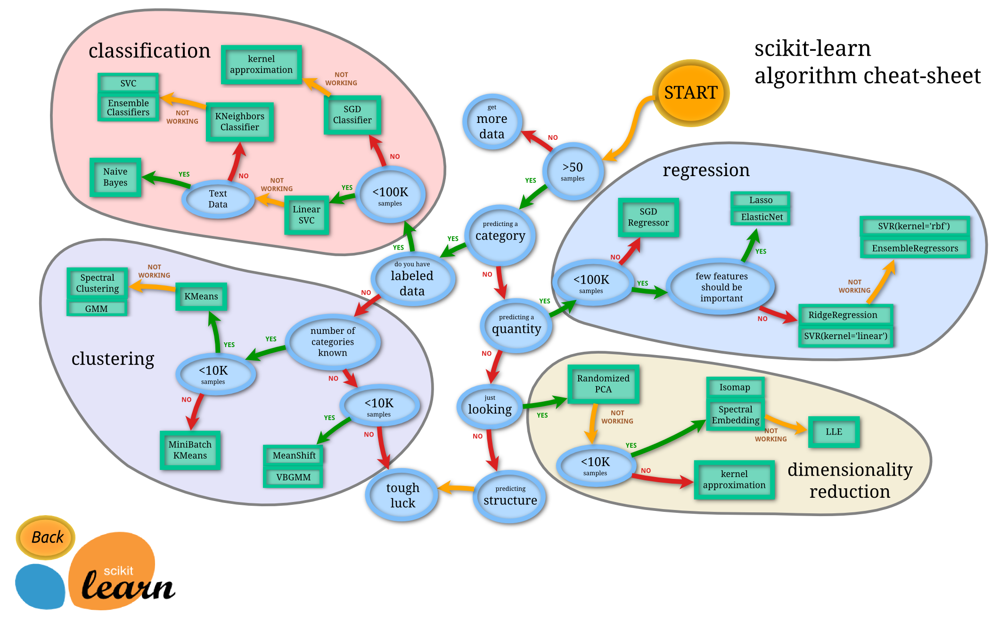

De acuerdo al mapa de selección de Algoritmos de Sckit-Learn considerando el tamaño de la muestra y un modelo de Clasificación Binaria con ciertas variables Categóricas y Etiquetadas, existe una gama variada de opciónes, sin embargo, consideraremos los algoritmos más comunes y conocidos facilitando la interpretación del modelo y sus parámetros.

Algoritmos seleccionados: Random Forest, Support Vector Machine, Naive Bayes, K Nearest Neighbours, Logistic Regression. 

8. Desarrollo del Algoritmo

8.1 Data Frame Final

In [1253]:
df_final = df[['Binary Rating', 'Rating_OE', 'Sector_LE', 'Current Ratio', 'Long-term Debt / Capital', 'ROI - Return On Investment', 'Free Cash Flow Per Share']]

In [1254]:
df_final

,Binary Rating,Rating_OE,Sector_LE,Current Ratio,Long-term Debt / Capital,ROI - Return On Investment,Free Cash Flow Per Share
33,1,4,9,2.97,0.25,18.10,0.66
8,1,5,7,1.07,0.34,11.80,0.94
3,1,7,10,0.84,0.47,5.10,-0.90
16,0,2,2,2.54,0.16,7.17,2.99
29,1,5,10,0.84,0.48,5.95,3.96
...,...,...,...,...,...,...,...
7299,1,6,10,1.91,0.46,5.13,-0.62
7434,1,7,6,2.80,0.14,26.38,-0.80
7506,1,7,6,1.45,0.22,-0.17,14.44
7585,1,4,7,2.86,0.24,1.94,0.43


In [1255]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7285 entries, 33 to 7666
Data columns (total 7 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Binary Rating               7285 non-null   int64  
 1   Rating_OE                   7285 non-null   int64  
 2   Sector_LE                   7285 non-null   int64  
 3   Current Ratio               7285 non-null   float64
 4   Long-term Debt / Capital    7285 non-null   float64
 5   ROI - Return On Investment  7285 non-null   float64
 6   Free Cash Flow Per Share    7285 non-null   float64
dtypes: float64(4), int64(3)
memory usage: 455.3 KB


9. Validación y Despliegue

9.1 SobreMuestreo para Equilibrio de Muestra

In [1278]:
from imblearn.over_sampling import SMOTE

X= df_final[['Current Ratio', 'Long-term Debt / Capital', 'ROI - Return On Investment', 'Free Cash Flow Per Share']]
y= df_final['Binary Rating']

smote = SMOTE(random_state=69)
X_res, y_res = smote.fit_resample(X, y)

In [1279]:
# Verifica el nuevo equilibrio de la muestra
print((pd.Series(y_res).value_counts()/len(y_res))*100)

Binary Rating
1   50.00
0   50.00
Name: count, dtype: float64


9.1 Validación Simple

In [1284]:
# Dividir el conjunto de datos en Entrenamiento y Prueba
# stratify: permite asegurarse que en entrenamiento y testeo tenga las mismas propociones de datos iniciales.

X= df_final[['Current Ratio', 'Long-term Debt / Capital', 'ROI - Return On Investment', 'Free Cash Flow Per Share']]
y= df_final['Binary Rating']

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=69, stratify=y)

In [1285]:
values_counts_y_train = np.asarray(np.unique(y_train, return_counts=True))
values_counts_y_train

array([[   0,    1],
       [1902, 3561]], dtype=int64)

In [1286]:
values_counts_y_test = np.asarray(np.unique(y_test, return_counts=True))
values_counts_y_test

array([[   0,    1],
       [ 634, 1188]], dtype=int64)

9.2 SobreMuestreo para Equilibrio de Muestra - Oversampling

Considerando un modelo de Clasificación y un desequilibrio de 65.20% para la clase 1 y 34.80% para la clase 0, se recomienda utilizar el método de sobremuestreo SMOTE, el cual genera nuevas muestras sintéticas para la clase minoritaria, en lugar de replicar las existentes, lo que ayuda a mejorar la generalización del modelo.

In [1287]:
from imblearn.over_sampling import SMOTE

# SMOTE en Train.
smote_train = SMOTE(k_neighbors=5, random_state=69, n_jobs=-1)
x_train_res, y_train_res = smote.fit_resample(X_train, y_train)

In [1288]:
# Equilibrio en Train.
values_counts_train_res = np.asarray(np.unique(y_train_res, return_counts=True))
values_counts_train_res

array([[   0,    1],
       [3561, 3561]], dtype=int64)

In [1282]:
# SMOTE en Test.
smote_test = SMOTE(k_neighbors=5, random_state=69, n_jobs=-1)
x_test_res, y_test_res = smote.fit_resample(X_test, y_test)

In [1283]:
# Equilibrio en Test.
values_counts_test_res = np.asarray(np.unique(y_test_res, return_counts=True))
values_counts_test_res

array([[   0,    1],
       [1188, 1188]], dtype=int64)

9.3 Validación Cruzada - Stratified K-Fold

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
https://scikit-learn.org/stable/modules/model_evaluation.html

Para la Validación del Modelo, independiente de que las muestras en Entrenamiento y Testeo hayan sido equilibradas, utilizamos el método de Validación Stratified K-Fold, para asegurarnos de que al generar las divisiones o splits en el conjunto de entrenamiento, se mantengan equilibradas las clases o clasificaciones (0,1), evitando que el modelo generalice un predicción independiente del input ingresado.

En general, de acuerdo a la documentación, Utilizaremos el  scoring='f1', para la estimación de variables target Binarias (Dicotómicas).

9.3.1 Random Forest

In [1289]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold, KFold
from sklearn.metrics import accuracy_score

# Definir los parámetros que deseas probar en el GridSearch
# En función de los mejores Hiperparámetros vamos iterando.
# Para evitar Overfitting, ingresamos un rango alto de Árboles (n_estimators), controlando también la profundidad de estos (max_depth).
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': list(range(3,8))
}
# min_samples_split
# min_impurity_decrease
# max_features
# min_samples_leaf
# max_leaf_nodes

# Crear el clasificador RandomForest
# Clasificador Binario.
clf_rf = RandomForestClassifier()

# Crear el objeto StratifiedKFold con 5 divisiones (k=5)
# Como ya no consideramos la columna de fecha, ya no trabajamos con series de tiempo, por lo cual podemos utilizar shuffle sin problemas.
S_kfold_rf = StratifiedKFold(n_splits=5, shuffle=True, random_state=69)

# Crear el objeto GridSearchCV
# Utilizamos el  scoring='f1', de acuerdo a la documnetación para variables target Binaria.
grid_search_rf = GridSearchCV(clf_rf, param_grid_rf, cv=S_kfold_rf, scoring='f1', return_train_score=True, verbose=3)

# Ajustar el GridSearch en los datos de entrenamiento
grid_search_rf.fit(x_train_res, y_train_res)

# Obtener los mejores parámetros y el mejor estimador del GridSearch
best_params_rf = grid_search_rf.best_params_

print("Mejores hiperparámetros:", best_params_rf)

Fitting 5 folds for each of 15 candidates, totalling 75 fits
[CV 1/5] END max_depth=3, n_estimators=100;, score=(train=0.771, test=0.751) total time=   0.2s
[CV 2/5] END max_depth=3, n_estimators=100;, score=(train=0.767, test=0.774) total time=   0.2s
[CV 3/5] END max_depth=3, n_estimators=100;, score=(train=0.769, test=0.755) total time=   0.2s
[CV 4/5] END max_depth=3, n_estimators=100;, score=(train=0.761, test=0.785) total time=   0.2s
[CV 5/5] END max_depth=3, n_estimators=100;, score=(train=0.775, test=0.758) total time=   0.2s
[CV 1/5] END max_depth=3, n_estimators=200;, score=(train=0.772, test=0.749) total time=   0.4s
[CV 2/5] END max_depth=3, n_estimators=200;, score=(train=0.765, test=0.773) total time=   0.4s
[CV 3/5] END max_depth=3, n_estimators=200;, score=(train=0.765, test=0.750) total time=   0.4s
[CV 4/5] END max_depth=3, n_estimators=200;, score=(train=0.766, test=0.781) total time=   0.4s
[CV 5/5] END max_depth=3, n_estimators=200;, score=(train=0.773, test=0.756

Los mejores hiperparámetros y por consiguiente resultados los entregará la grilla en entrenamiento.

Si el rendimiento en el conjunto de entrenamiento es significativamente mejor que en el conjunto de prueba, es una señal de sobreajuste.

In [1290]:
# Predicciones Random Forest con el Mejor Estimador.
best_estimator_rf = grid_search_rf.best_estimator_
y_pred = best_estimator_rf.predict(x_train_res)

# Precisión Random Forest
accuracy_rf = accuracy_score(y_train_res, y_pred)
accuracy_rf

0.8458298230834035

In [1291]:
# Scores Random Forest de todas las combinaciones de parámetros.
results_rf = grid_search_rf.cv_results_
results_rf

scores_rf = pd.DataFrame(results_rf)
scores_rf = scores_rf[['mean_train_score', 'mean_test_score', 'params']]
scores_rf.round(3).sort_values("mean_test_score", ascending=False)

,mean_train_score,mean_test_score,params
14,0.85,0.82,"{'max_depth': 7, 'n_estimators': 300}"
12,0.85,0.82,"{'max_depth': 7, 'n_estimators': 100}"
13,0.85,0.82,"{'max_depth': 7, 'n_estimators': 200}"
9,0.83,0.80,"{'max_depth': 6, 'n_estimators': 100}"
11,0.83,0.80,"{'max_depth': 6, 'n_estimators': 300}"
10,0.83,0.80,"{'max_depth': 6, 'n_estimators': 200}"
7,0.81,0.79,"{'max_depth': 5, 'n_estimators': 200}"
8,0.81,0.79,"{'max_depth': 5, 'n_estimators': 300}"
6,0.81,0.79,"{'max_depth': 5, 'n_estimators': 100}"
5,0.79,0.78,"{'max_depth': 4, 'n_estimators': 300}"


9.3.2 Support Vector Machine

In [1292]:
from sklearn import svm

# Definir los parámetros que deseas probar en el GridSearch
# En función de los mejores Hiperparámetros vamos iterando.
# Restringimos los valores de C a niveles bajos para evitar Overfitting.
param_grid_svm = {
    'gamma': [2,3,4],
    'C': [5,10,15]
}

# Crear el clasificador SVM
# Clasificador Binario.
clf_svm = svm.SVC(kernel='rbf', random_state=69)

# Crear el objeto StratifiedKFold con 5 divisiones (k=5)
# Como ya no consideramos la columna de fecha, ya no trabajamos con series de tiempo, por lo cual podemos utilizar shuffle sin problemas.
S_kfold_svm = StratifiedKFold(n_splits=5, shuffle=True, random_state=69)

# Crear el objeto GridSearchCV
# Utilizamos el  scoring='f1', de acuerdo a la documnetación para variables target Binaria.
grid_search_svm = GridSearchCV(clf_svm, param_grid_svm, cv=S_kfold_svm, scoring='f1', return_train_score=True, verbose=3)

# Ajustar el GridSearch en los datos de entrenamiento
grid_search_svm.fit(x_train_res, y_train_res)

# Obtener los mejores parámetros y el mejor estimador del GridSearch
best_params_svm = grid_search_svm.best_params_

print("Mejores hiperparámetros:", best_params_svm)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5] END ..C=5, gamma=2;, score=(train=0.946, test=0.869) total time=   0.7s
[CV 2/5] END ..C=5, gamma=2;, score=(train=0.948, test=0.881) total time=   0.6s
[CV 3/5] END ..C=5, gamma=2;, score=(train=0.947, test=0.873) total time=   0.6s
[CV 4/5] END ..C=5, gamma=2;, score=(train=0.946, test=0.885) total time=   0.6s
[CV 5/5] END ..C=5, gamma=2;, score=(train=0.949, test=0.877) total time=   0.6s
[CV 1/5] END ..C=5, gamma=3;, score=(train=0.961, test=0.875) total time=   0.9s
[CV 2/5] END ..C=5, gamma=3;, score=(train=0.962, test=0.893) total time=   0.8s
[CV 3/5] END ..C=5, gamma=3;, score=(train=0.962, test=0.886) total time=   0.7s
[CV 4/5] END ..C=5, gamma=3;, score=(train=0.960, test=0.898) total time=   0.7s
[CV 5/5] END ..C=5, gamma=3;, score=(train=0.963, test=0.880) total time=   0.8s
[CV 1/5] END ..C=5, gamma=4;, score=(train=0.968, test=0.880) total time=   0.9s
[CV 2/5] END ..C=5, gamma=4;, score=(train=0.968,

In [1293]:
# Predicciones SVM con el Mejor Estimador.
best_estimator_svm = grid_search_svm.best_estimator_
y_pred = best_estimator_svm.predict(x_train_res)

# Precisión SVM
accuracy_svm = accuracy_score(y_train_res, y_pred)
accuracy_svm

0.9738837405223252

In [1294]:
# Scores SVM con todas las combinaciones de parámetros
results_svm = grid_search_svm.cv_results_
results_svm

scores_svm = pd.DataFrame(results_svm)
scores_svm = scores_svm[['mean_train_score', 'mean_test_score', 'params']]
scores_svm.round(3).sort_values("mean_test_score", ascending=False)

,mean_train_score,mean_test_score,params
5,0.97,0.90,"{'C': 10, 'gamma': 4}"
8,0.98,0.90,"{'C': 15, 'gamma': 4}"
7,0.97,0.90,"{'C': 15, 'gamma': 3}"
2,0.97,0.89,"{'C': 5, 'gamma': 4}"
4,0.97,0.89,"{'C': 10, 'gamma': 3}"
6,0.96,0.89,"{'C': 15, 'gamma': 2}"
1,0.96,0.89,"{'C': 5, 'gamma': 3}"
3,0.96,0.88,"{'C': 10, 'gamma': 2}"
0,0.95,0.88,"{'C': 5, 'gamma': 2}"


9.3.3 Naive Bayes

In [1295]:
from sklearn.naive_bayes import GaussianNB

# Definir los parámetros que deseas probar en el GridSearch
# En función de los mejores Hiperparámetros vamos iterando.
# Valores muy bajos de var_smoothing pueden generar Overfitting.
param_grid_nb = {
    'priors': [None, [0.5, 0.5]],
    'var_smoothing': [1e-4, 1e-5, 1e-6]
}

# Crear el clasificador NB
# Clasificador Binario.
clf_nb = GaussianNB()

# Crear el objeto StratifiedKFold con 5 divisiones (k=5)
# Como ya no consideramos la columna de fecha, ya no trabajamos con series de tiempo, por lo cual podemos utilizar shuffle sin problemas.
S_kfold_nb = StratifiedKFold(n_splits=5, shuffle=True, random_state=69)

# Crear el objeto GridSearchCV
# Utilizamos el  scoring='f1', de acuerdo a la documnetación para variables target Binaria.
grid_search_nb = GridSearchCV(clf_nb, param_grid_nb, cv=S_kfold_nb, scoring='f1', return_train_score=True, verbose=3)

# Ajustar el GridSearch en los datos de entrenamiento
grid_search_nb.fit(x_train_res, y_train_res)

# Obtener los mejores parámetros y el mejor estimador del GridSearch
best_params_nb = grid_search_nb.best_params_

print("Mejores hiperparámetros:", best_params_nb)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END priors=None, var_smoothing=0.0001;, score=(train=0.698, test=0.705) total time=   0.0s
[CV 2/5] END priors=None, var_smoothing=0.0001;, score=(train=0.697, test=0.707) total time=   0.0s
[CV 3/5] END priors=None, var_smoothing=0.0001;, score=(train=0.703, test=0.686) total time=   0.0s
[CV 4/5] END priors=None, var_smoothing=0.0001;, score=(train=0.696, test=0.707) total time=   0.0s
[CV 5/5] END priors=None, var_smoothing=0.0001;, score=(train=0.702, test=0.690) total time=   0.0s
[CV 1/5] END priors=None, var_smoothing=1e-05;, score=(train=0.699, test=0.708) total time=   0.0s
[CV 2/5] END priors=None, var_smoothing=1e-05;, score=(train=0.699, test=0.705) total time=   0.0s
[CV 3/5] END priors=None, var_smoothing=1e-05;, score=(train=0.704, test=0.686) total time=   0.0s
[CV 4/5] END priors=None, var_smoothing=1e-05;, score=(train=0.699, test=0.707) total time=   0.0s
[CV 5/5] END priors=None, var_smoothing=1e-0

In [1296]:
# Predicciones NB con el Mejor Estimador.
best_estimator_nb = grid_search_nb.best_estimator_
y_pred = best_estimator_nb.predict(x_train_res)

# Precisión NB
accuracy_nb = accuracy_score(y_train_res, y_pred)
accuracy_nb

0.603201347935973

In [1297]:
# Scores NB con todas las combinaciones de parámetros
results_nb = grid_search_nb.cv_results_
results_nb

scores_nb = pd.DataFrame(results_nb)
scores_nb = scores_nb[['mean_train_score', 'mean_test_score', 'params']]
scores_nb.round(3).sort_values("mean_test_score", ascending=False)

,mean_train_score,mean_test_score,params
1,0.70,0.70,"{'priors': None, 'var_smoothing': 1e-05}"
2,0.70,0.70,"{'priors': None, 'var_smoothing': 1e-06}"
4,0.70,0.70,"{'priors': [0.5, 0.5], 'var_smoothing': 1e-05}"
5,0.70,0.70,"{'priors': [0.5, 0.5], 'var_smoothing': 1e-06}"
0,0.70,0.70,"{'priors': None, 'var_smoothing': 0.0001}"
3,0.70,0.70,"{'priors': [0.5, 0.5], 'var_smoothing': 0.0001}"


9.3.4 K Nearest Neighbours

In [1298]:
from sklearn.neighbors import KNeighborsClassifier

# Definir los parámetros que deseas probar en el GridSearch
# En función de los mejores Hiperparámetros vamos iterando.
# Generalmente, valores bajos de vecinos (n_neighbors) puede llevar a Overfitting, ya que el modelo se ajustará mucho a los datos de entrenamiento.
param_grid_knn = {
    'n_neighbors': list(range(4,9))
}
# Crear el clasificador KNN
# Clasificador Binario.
clf_knn = KNeighborsClassifier()

# Crear el objeto StratifiedKFold con 5 divisiones (k=5)
# Como ya no consideramos la columna de fecha, ya no trabajamos con series de tiempo, por lo cual podemos utilizar shuffle sin problemas.
S_kfold_knn = StratifiedKFold(n_splits=5, shuffle=True, random_state=69)

# Crear el objeto GridSearchCV
# Utilizamos el  scoring='f1', de acuerdo a la documnetación para variables target Binaria.
grid_search_knn = GridSearchCV(clf_knn, param_grid_knn, cv=S_kfold_knn, scoring='f1', return_train_score=True, verbose=3)

# Ajustar el GridSearch en los datos de entrenamiento
grid_search_knn.fit(x_train_res, y_train_res)

# Obtener los mejores parámetros y el mejor estimador del GridSearch
best_params_knn = grid_search_knn.best_params_

print("Mejores hiperparámetros:", best_params_knn)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV 1/5] END .n_neighbors=4;, score=(train=0.897, test=0.814) total time=   0.0s
[CV 2/5] END .n_neighbors=4;, score=(train=0.896, test=0.820) total time=   0.0s
[CV 3/5] END .n_neighbors=4;, score=(train=0.904, test=0.833) total time=   0.0s
[CV 4/5] END .n_neighbors=4;, score=(train=0.899, test=0.834) total time=   0.0s
[CV 5/5] END .n_neighbors=4;, score=(train=0.897, test=0.806) total time=   0.0s
[CV 1/5] END .n_neighbors=5;, score=(train=0.891, test=0.813) total time=   0.0s
[CV 2/5] END .n_neighbors=5;, score=(train=0.891, test=0.834) total time=   0.0s
[CV 3/5] END .n_neighbors=5;, score=(train=0.898, test=0.843) total time=   0.0s
[CV 4/5] END .n_neighbors=5;, score=(train=0.892, test=0.840) total time=   0.0s
[CV 5/5] END .n_neighbors=5;, score=(train=0.894, test=0.815) total time=   0.0s
[CV 1/5] END .n_neighbors=6;, score=(train=0.865, test=0.776) total time=   0.0s
[CV 2/5] END .n_neighbors=6;, score=(train=0.868,

In [1299]:
# Predicciones KNN con el Mejor Estimador.
best_estimator_knn = grid_search_knn.best_estimator_
y_pred = best_estimator_knn.predict(x_train_res)

# Precisión KNN
accuracy_knn = accuracy_score(y_train_res, y_pred)
accuracy_knn

0.9076102218477956

In [1300]:
# Scores KNN con todas las combinaciones de parámetros
results_knn = grid_search_knn.cv_results_
results_knn

scores_knn = pd.DataFrame(results_knn)
scores_knn = scores_knn[['mean_train_score', 'mean_test_score', 'params']]
scores_knn.round(3).sort_values("mean_test_score", ascending=False)

,mean_train_score,mean_test_score,params
1,0.89,0.83,{'n_neighbors': 5}
0,0.90,0.82,{'n_neighbors': 4}
2,0.87,0.80,{'n_neighbors': 6}
3,0.86,0.80,{'n_neighbors': 7}
4,0.84,0.77,{'n_neighbors': 8}


9.3.5 Logistic Regression

In [1301]:
from sklearn.linear_model import LogisticRegression

# Definir los parámetros que deseas probar en el GridSearch
# En función de los mejores Hiperparámetros vamos iterando.
# Granulando de mejor manera C y incrementando el número de iteraciones, es posible evitar el overfitting.
param_grid_lr = {
    'C': [0.000001, 0.00001, 0.0001, 0.001, 0.01],
    'max_iter': [100, 200, 300, 400, 500]
}
# Crear el clasificador LR
# Clasificador Binario.
clf_lr = LogisticRegression(random_state=69 , multi_class='multinomial', solver='newton-cg')

# Crear el objeto StratifiedKFold con 10 divisiones (k=10)
# Como ya no consideramos la columna de fecha, ya no trabajamos con series de tiempo, por lo cual podemos utilizar shuffle sin problemas.
S_kfold_lr = StratifiedKFold(n_splits=10, shuffle=True, random_state=69)

# Crear el objeto GridSearchCV
# Utilizamos el  scoring='f1', de acuerdo a la documnetación para variables target Binaria.
grid_search_lr = GridSearchCV(clf_lr, param_grid_lr, cv=S_kfold_lr, scoring='f1', return_train_score=True, verbose=3)

# Ajustar el GridSearch en los datos de entrenamiento
grid_search_lr.fit(x_train_res, y_train_res)

# Obtener los mejores parámetros y el mejor estimador del GridSearch
best_params_lr = grid_search_lr.best_params_

print("Mejores hiperparámetros:", best_params_lr)

Fitting 10 folds for each of 25 candidates, totalling 250 fits
[CV 1/10] END C=1e-06, max_iter=100;, score=(train=0.669, test=0.653) total time=   0.0s
[CV 2/10] END C=1e-06, max_iter=100;, score=(train=0.667, test=0.676) total time=   0.0s
[CV 3/10] END C=1e-06, max_iter=100;, score=(train=0.672, test=0.645) total time=   0.0s
[CV 4/10] END C=1e-06, max_iter=100;, score=(train=0.670, test=0.663) total time=   0.0s
[CV 5/10] END C=1e-06, max_iter=100;, score=(train=0.670, test=0.657) total time=   0.0s
[CV 6/10] END C=1e-06, max_iter=100;, score=(train=0.667, test=0.676) total time=   0.0s
[CV 7/10] END C=1e-06, max_iter=100;, score=(train=0.667, test=0.688) total time=   0.0s
[CV 8/10] END C=1e-06, max_iter=100;, score=(train=0.667, test=0.688) total time=   0.0s
[CV 9/10] END C=1e-06, max_iter=100;, score=(train=0.669, test=0.665) total time=   0.0s
[CV 10/10] END C=1e-06, max_iter=100;, score=(train=0.668, test=0.677) total time=   0.0s
[CV 1/10] END C=1e-06, max_iter=200;, score=(t

In [1302]:
# Predicciones LR con el Mejor Estimador.
best_estimator_lr = grid_search_lr.best_estimator_
y_pred = best_estimator_lr.predict(x_train_res)

# Precisión LR
accuracy_lr = accuracy_score(y_train_res, y_pred)
accuracy_lr

0.7026116259477675

In [1303]:
# Scores LR con todas las combinaciones de parámetros
results_lr = grid_search_lr.cv_results_
results_lr

scores_lr = pd.DataFrame(results_lr)
scores_lr = scores_lr[['mean_train_score', 'mean_test_score', 'params']]
scores_lr.round(3).sort_values("mean_test_score", ascending=False)

,mean_train_score,mean_test_score,params
24,0.71,0.71,"{'C': 0.01, 'max_iter': 500}"
23,0.71,0.71,"{'C': 0.01, 'max_iter': 400}"
22,0.71,0.71,"{'C': 0.01, 'max_iter': 300}"
21,0.71,0.71,"{'C': 0.01, 'max_iter': 200}"
20,0.71,0.71,"{'C': 0.01, 'max_iter': 100}"
19,0.70,0.70,"{'C': 0.001, 'max_iter': 500}"
18,0.70,0.70,"{'C': 0.001, 'max_iter': 400}"
17,0.70,0.70,"{'C': 0.001, 'max_iter': 300}"
16,0.70,0.70,"{'C': 0.001, 'max_iter': 200}"
15,0.70,0.70,"{'C': 0.001, 'max_iter': 100}"


9.4 Resumen Metricas

9.4.1 Resumen Accuracy

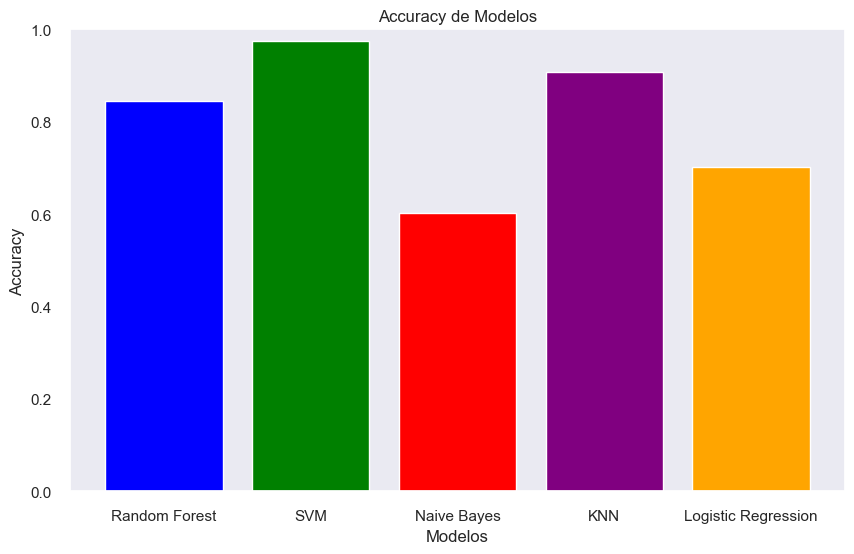

In [1304]:
data = {
    'Modelos': ['Random Forest', 'SVM', 'Naive Bayes', 'KNN', 'Logistic Regression'],
    'Accuracy': [accuracy_rf, accuracy_svm, accuracy_nb, accuracy_knn, accuracy_lr]
}

df = pd.DataFrame(data)

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
plt.bar(df['Modelos'], df['Accuracy'], color=['blue', 'green', 'red', 'purple', 'orange'])
plt.xlabel('Modelos')
plt.ylabel('Accuracy')
plt.title('Accuracy de Modelos')
plt.ylim(0, 1)  
plt.show()

9.4.2 Resumen Best Scores Grid Search

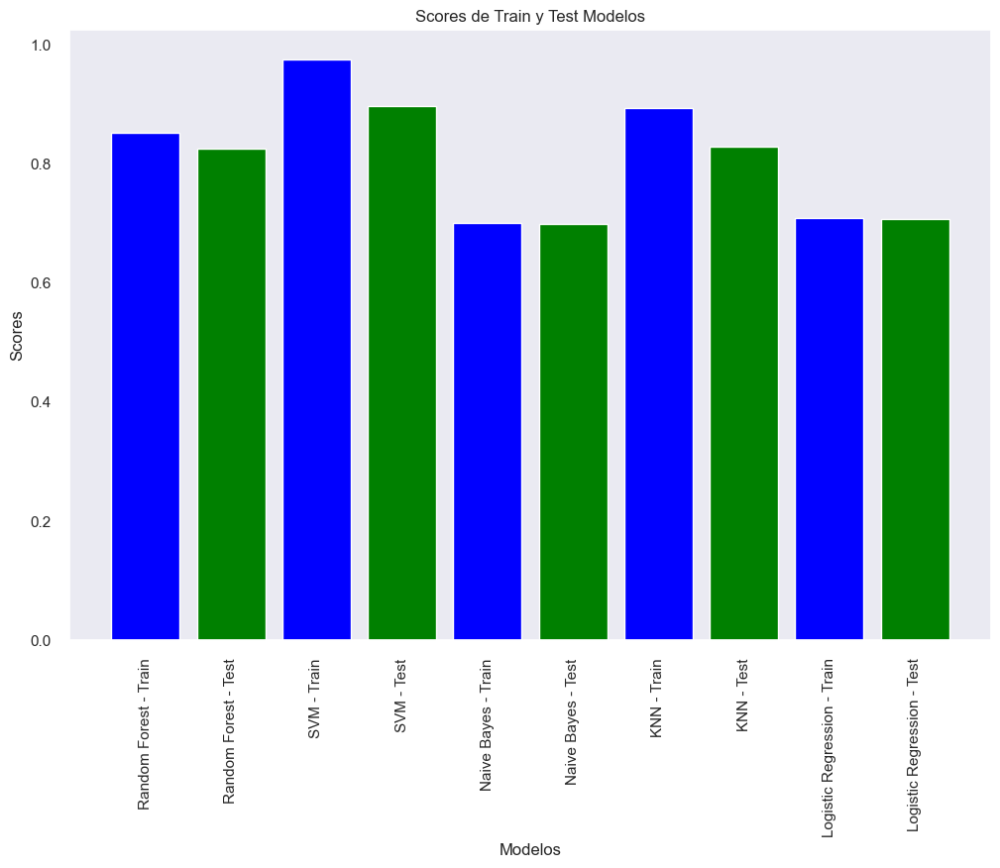

In [1305]:
scores_list = [scores_rf, scores_svm, scores_nb, scores_knn, scores_lr]
model_names = ['Random Forest', 'SVM', 'Naive Bayes', 'KNN', 'Logistic Regression']

plt.figure(figsize=(12, 8))

for i, scores in enumerate(scores_list):
    max_test_score_row = scores.loc[scores['mean_test_score'].idxmax()]
    plt.bar(f'{model_names[i]} - Train', max_test_score_row['mean_train_score'], color='blue')
    plt.bar(f'{model_names[i]} - Test', max_test_score_row['mean_test_score'], color='green')

# Configurar etiquetas y título del gráfico
plt.xlabel('Modelos')
plt.ylabel('Scores')
plt.title('Scores de Train y Test Modelos')
plt.xticks(rotation=90)
plt.show()

Si bien los algoritmos SVM y KNN poseen el mayor Accuracy, la diferencia del desempeño entre Entrenamiento y Testeo es bastante alto, mostrando signos de sobreajuste, por lo cual, nos quedaremos con el algoritmo Random Forest, el cual posee el tercer valor más alto en Accuracy y una diferencia positiva sutil entre sus desempeños de Entrenamiento y Testeo.

In [1307]:
# Lazzy Regressor
# from lazypredict.Supervised import LazyClassifier
# from sklearn.model_selection import train_test_split

# data = df_final
# X= df_final[['Current Ratio', 'Long-term Debt / Capital', 'ROI - Return On Investment', 'Free Cash Flow Per Share']]
# y= df_final['Binary Rating']

# X_train, X_test, y_train, y_test = train_test_split(X, y,test_size = 0.25,random_state = 69)

# clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
# models,predictions = clf.fit(X_train, X_test, y_train, y_test)

# print(models)

9.5 Evaluación y Despliegue

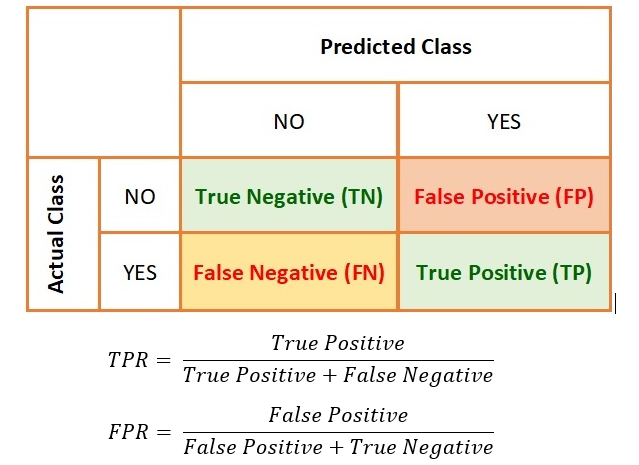

COMENTARIOS.

9.5.1 Evaluación en Entrenamiento

In [1346]:
# Clasificador RF Entrenamiento.

modelo_train_rf = RandomForestClassifier(max_depth = 7, n_estimators = 300)

modelo_train_rf.fit(x_train_res, y_train_res)

y_pred_train_res = modelo_train_rf.predict(x_train_res)

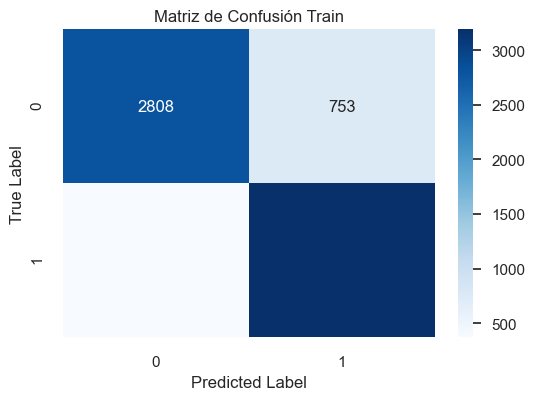

In [1347]:
from sklearn.metrics import confusion_matrix

# Matriz de Confusión en Entrenamiento
cm_train = confusion_matrix(y_train_res, y_pred_train_res)

# usando heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de Confusión Train")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [1348]:
print(cm_train)

[[2808  753]
 [ 371 3190]]


In [1349]:
from sklearn import metrics
from sklearn.metrics import precision_score

# Precisión por Categoría en Entrenamiento
precision_positiva_train = metrics.precision_score(y_train_res, y_pred_train_res, pos_label=1)
precision_negativa_train = metrics.precision_score(y_train_res, y_pred_train_res, pos_label=0)
precision_positiva_train, precision_negativa_train

(0.8090286583819427, 0.883296634161686)

In [1350]:
from sklearn.metrics import recall_score

# Recall en Entrenamiento - Capacidad del modelo para detectar correctamente los casos positivos de una clase específica.
metrics.recall_score(y_train_res, y_pred_train_res, pos_label=1), metrics.recall_score(y_train_res, y_pred_train_res, pos_label=0)

(0.8958157820836844, 0.7885425442291492)

In [1351]:
# Resumen Métricas Train

print(metrics.classification_report(y_train_res, y_pred_train_res))

              precision    recall  f1-score   support

           0       0.88      0.79      0.83      3561
           1       0.81      0.90      0.85      3561

    accuracy                           0.84      7122
   macro avg       0.85      0.84      0.84      7122
weighted avg       0.85      0.84      0.84      7122



9.3.2 Evaluación en Testeo

In [1352]:
# Clasificador RF Testeo.

modelo_test_rf = RandomForestClassifier(max_depth = 7, n_estimators = 300)

modelo_test_rf.fit(x_test_res, y_test_res)

y_pred_test_res = modelo_test_rf.predict(x_test_res)

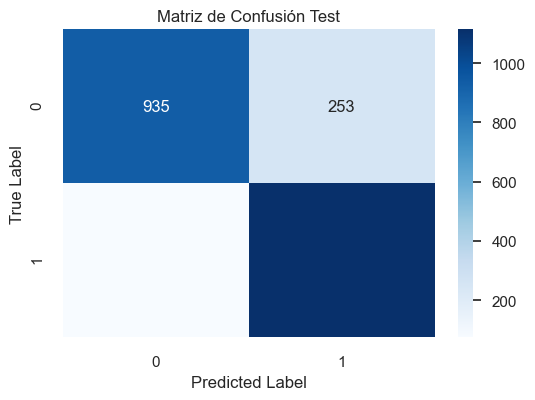

In [1353]:
# Matriz de Confusión en Testeo
cm_test = confusion_matrix(y_test_res, y_pred_test_res)

# usando heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de Confusión Test")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [1354]:
print(cm_test)

[[ 935  253]
 [  74 1114]]


In [1355]:
# Precisión por Categoría en Testeo
precision_positiva_test = metrics.precision_score(y_test_res, y_pred_test_res, pos_label=1)
precision_negativa_test = metrics.precision_score(y_test_res, y_pred_test_res, pos_label=0)
precision_positiva_test, precision_negativa_test

(0.8149231894659839, 0.9266600594648167)

In [1356]:
# Recall en Testeo - Capacidad del modelo para detectar correctamente los casos positivos de una clase específica.
metrics.recall_score(y_test_res, y_pred_test_res, pos_label=1), metrics.recall_score(y_test_res, y_pred_test_res, pos_label=0)

(0.9377104377104377, 0.7870370370370371)

In [1357]:
# Resumen Métricas Test

print(metrics.classification_report(y_test_res, y_pred_test_res))

              precision    recall  f1-score   support

           0       0.93      0.79      0.85      1188
           1       0.81      0.94      0.87      1188

    accuracy                           0.86      2376
   macro avg       0.87      0.86      0.86      2376
weighted avg       0.87      0.86      0.86      2376



Sensibilidad (Recall): Al disminuir el umbral de corte, es probable que se clasifiquen más instancias como positivas. Esto puede aumentar la sensibilidad (recall), ya que el modelo capturará más casos positivos. Sin embargo, al hacerlo, también es probable que aumente la tasa de falsos positivos.

Especificidad: Al aumentar el umbral de corte, se clasificarán menos instancias como positivas, lo que puede aumentar la especificidad (1 - FPR) del modelo. Esto significa que el modelo será más preciso en la clasificación de instancias negativas. Sin embargo, es posible que esto también disminuya la sensibilidad.

Equilibrio entre sensibilidad y especificidad: Al ajustar el umbral de corte, se busca encontrar un equilibrio entre la sensibilidad y la especificidad según los requisitos del problema. Si el objetivo es maximizar la sensibilidad, se puede disminuir el umbral de corte, aunque esto puede aumentar los falsos positivos. Si se busca maximizar la especificidad, se puede aumentar el umbral de corte, pero esto puede disminuir la sensibilidad.

Resumen: buscamos tener TPR alto (verdaderos positivos) y minimizar FPR (falsos positivos)

9.4 Importancia de las Variables.

https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html

In [1358]:
from sklearn.inspection import permutation_importance

# Importancia en Entrenamiento
importances_train = permutation_importance(modelo_train_rf, x_train_res, y_train_res, n_repeats=10, random_state=69)

# Crear un DataFrame con las importancias de las variables
importance_df_train = pd.DataFrame({'Variable': X_train.columns, 'Importance': importances_train.importances_mean})
importance_df_train = importance_df_train.sort_values('Importance', ascending=False)

importance_df_train

,Variable,Importance
2,ROI - Return On Investment,0.19
1,Long-term Debt / Capital,0.16
0,Current Ratio,0.10
3,Free Cash Flow Per Share,0.04


In [1359]:
# Importancia en Entrenamiento
importances_test = permutation_importance(modelo_test_rf, x_test_res, y_test_res, n_repeats=10, random_state=69)

# Crear un DataFrame con las importancias de las variables
importance_df_test = pd.DataFrame({'Variable': X_test.columns, 'Importance': importances_test.importances_mean})
importance_df_test = importance_df_test.sort_values('Importance', ascending=False)

importance_df_test

,Variable,Importance
2,ROI - Return On Investment,0.19
1,Long-term Debt / Capital,0.18
0,Current Ratio,0.12
3,Free Cash Flow Per Share,0.04


9.5 Predicciones

In [1360]:
# Predicción en Entrenamiento
y_pred_train = modelo_train_rf.predict(x_train_res)
y_pred_train

array([1, 1, 1, ..., 0, 1, 0], dtype=int64)

In [1361]:
# Predicción en Testeo
y_pred_test = modelo_test_rf.predict(x_test_res)
y_pred_test

array([1, 0, 1, ..., 0, 0, 0], dtype=int64)

10. Modelo de Predicción

10.1 Rangos de Ingreso de Datos

In [1374]:
# Rangos de Input para el Usuario Final.
print('Min - Max Sector_LE:', df_final['Sector_LE'].min().round(1), '-', df_final['Sector_LE'].max().round(1))
print('Min - Max Current Ratio:', df_final['Current Ratio'].min().round(1), '-', df_final['Current Ratio'].max().round(1))
print('Min - Max Long-term Debt / Capital:', df_final['Long-term Debt / Capital'].min().round(1), '-', df_final['Long-term Debt / Capital'].max().round(1))
print('Min - Max ROI - Return On Investment:', df_final['ROI - Return On Investment'].min().round(1), '-', df_final['ROI - Return On Investment'].max().round(1))
print('Min - Max Free Cash Flow Per Share:', df_final['Free Cash Flow Per Share'].min().round(1), '-', df_final['Free Cash Flow Per Share'].max().round(1))

Min - Max Sector_LE: 0 - 10
Min - Max Current Ratio: 0.2 - 9.6
Min - Max Long-term Debt / Capital: -40.0 - 44.1
Min - Max ROI - Return On Investment: -65.2 - 81.0
Min - Max Free Cash Flow Per Share: -20.9 - 21.8


10.2 Input

In [1386]:
# Ingreso Datos Usuario.

Sector_LE = 1.0
Current_Ratio = 2.0
Long_term_Debt_Capital = 0.3
Return_On_Investment = 0.2
Free_Cash_Flow_Per_Share = 3.0

10.3 Función - Predición.

In [1389]:
def predecir_inversion(Current_Ratio, Long_term_Debt_Capital, Return_On_Investment, Free_Cash_Flow_Per_Share, modelo_test_rf):

    data = {
        'Current Ratio': [Current_Ratio],
        'Long-term Debt / Capital': [Long_term_Debt_Capital],
        'ROI - Return On Investment': [Return_On_Investment],
        'Free Cash Flow Per Share': [Free_Cash_Flow_Per_Share]
    }
    x_test_res = pd.DataFrame(data)

    y_pred_test = modelo_test_rf.predict(x_test_res)
    
    return y_pred_test[0]

resultado = predecir_inversion(Current_Ratio, Long_term_Debt_Capital, Return_On_Investment, Free_Cash_Flow_Per_Share, modelo_test_rf)
print(resultado)  

1


11. Guardar y Cargar Moldeo a Futuro

In [1390]:
# Guardar Modelo
import pickle

# Modelo
modelo_test_rf

# Guardamos el modelo en un archivo utilizando pickle
with open('modelo_clf.pkl', 'wb') as archivo:
    pickle.dump(modelo_test_rf, archivo)

In [1391]:
# Cargar Modelo para Utilizarlo.
with open('modelo_clf.pkl', 'rb') as archivo:
    modelo_cargado = pickle.load(archivo)

# Utilizar el modelo cargado para hacer predicciones, por ejemplo:
predicciones = modelo_cargado.predict(X_test)
predicciones

array([1, 0, 1, ..., 1, 1, 1], dtype=int64)

11. Conclusiones y Recomendaciones

3.1  ¿Cuantas Clasificaciones nos permiten obtener un Resultado de Inversión Asertivo para los Clientes?

3.1.A: Para lograr un equilibro estable de la muestra en función de la cantidad de registros por clasificación y así evitar sobreajuste de los datos en el modelo preditivo, se recomienda clasificar las empresas en 7 niveles jeráquicos, los cuales posteriormente indicará la recomendación de Invertir o no hacerlo.

3.2  ¿De qué manera influye la estacionalidad en los Ratios Financieros Analizados?

3.2.A Si bien se realiza un análisis de los ratios para los diferentes periodos, no existe un patrón de estacionalidad clara para la evolución de una variable a lo largo del tiempo para un rubro en Particular. Se recomienda ampliar la muestra y/o utilizar parámetros de medición diferentes al promedio, los cuales pueden no ser lo suficientemente representativos.

3.3  ¿Es posible que las Variables Predictoras tengan cierto grado de Correlación, sesgando el Modelo Predictivo?

3.3.A Queda en evidencia el alto grado de Correlación y Colinealidad entre las variables Predictoras, es por esta razón que gran parte de ellas es descartada, dejando únicamente 4 variables para predecir la Variable de Respuesta.

3.4  ¿Cual es la incidencia del Know How Financiero para el Tratamiento de Valores Atípicos? 

3.4.A El conocimiento Financiero es fundamental para el Análisis y Tratamiento de Outliers, ya que valores extremos que en cualquier otro contexto pueden ser considerados como atípicos (a ser tratados o eliminados posteriormente), en el mundo financiero pueden ser perfectamente posibles, siempre y cuando sean contrastados y analizados en detalle. 

3.5  ¿Que tanto influye el Rubro o Industria a la cual pertence la empresa en la decisión de Inversión?

3.5.A Queda en Evidencia que el Rubro al cual pertenece una Empresa influye directamente en los Valores de las Variables Predictoras (Ratios Financieros), las cuales posteriormente incidirán en la clasificación final, por lo cual, se recomienda de sobremanera identificar las Industrias a las cuales pertenece la empresa y contrastar el cómo los ratios financieros pueden cambiar significativamente entre una y otra.